In [1]:
###################  LOAD THE LIBRARIES ####################### 

# for data mining
import os
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
%matplotlib inline
import matplotlib.pyplot as plt  # Matlab-style plotting
import seaborn as sns
import warnings
from scipy import stats
from scipy.stats import norm, skew #for some statistics
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) #Limiting floats output to 3 decimal points
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
py.init_notebook_mode(connected=True)
import matplotlib.ticker as mticker
import random

# for ML Modelling
from sklearn.linear_model import ElasticNet, Lasso,  BayesianRidge, LassoLarsIC, LogisticRegression, LogisticRegressionCV
from sklearn.ensemble import RandomForestRegressor,  GradientBoostingRegressor, BaggingClassifier, AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier
from sklearn.kernel_ridge import KernelRidge
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.metrics import mean_squared_error,confusion_matrix, accuracy_score, roc_curve, roc_auc_score
from sklearn import tree

In [2]:
###################  ROUTINE ####################### 

# Variables 
wd = "F:\Work Folder\Ritesh\ML\KAGGLE-CASESTUDY\KAGGLE-RISK-CS"
train_dataset = "application_train.csv"
# Set working directory
os.chdir(wd)

# Import Libraries
import FunctionLib as f

# Import working dataset
train_df = pd.read_csv(train_dataset)

# Summarize data infor from dataset    
#f.dataframeinfo(train_df)

# Seperate the target from working dataset
#target = train_df.TARGET
#x_df = train_df.drop(train_df[['TARGET']],axis=1)

# Create a new dataset same as train data
x_df = train_df.sample(frac=0.1, random_state=1).reset_index(drop=True)

In [3]:
# Delete the original dataset and work with Sample to free some space for processing.
del train_df

In [4]:
color_list = ['green','blue','orange','yellow','red','violet','cyan']

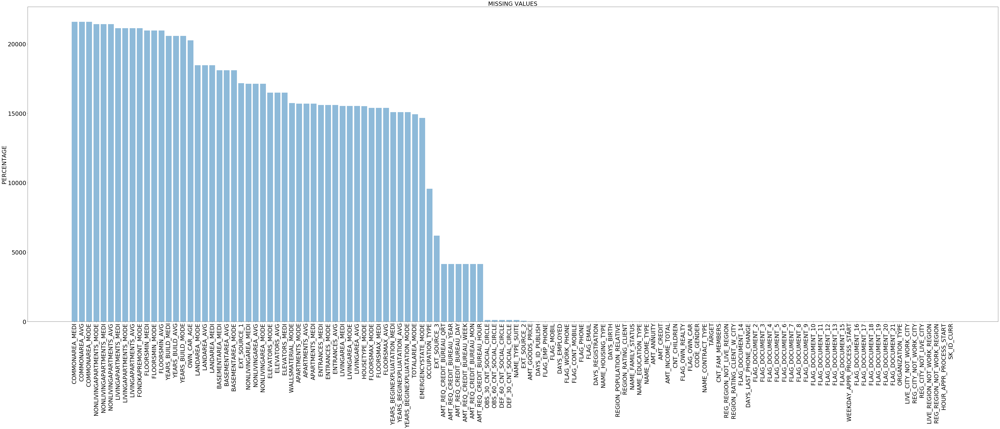

In [5]:
val = x_df.isna().sum().sort_values(ascending=False)
f.plot_bar(val.index,(90,30),val,30)

In [6]:
f.get_missing_value_feats(x_df)

Index(['AMT_GOODS_PRICE', 'NAME_TYPE_SUITE', 'OWN_CAR_AGE', 'OCCUPATION_TYPE',
       'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG',
       'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG',
       'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG',
       'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG',
       'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG',
       'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE',
       'YEARS_BUILD_MODE', 'COMMONAREA_MODE', 'ELEVATORS_MODE',
       'ENTRANCES_MODE', 'FLOORSMAX_MODE', 'FLOORSMIN_MODE', 'LANDAREA_MODE',
       'LIVINGAPARTMENTS_MODE', 'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE',
       'NONLIVINGAREA_MODE', 'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI',
       'YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI',
       'ELEVATORS_MEDI', 'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 'FLOORSMIN_MEDI',
       'LANDAREA_MEDI', 'LIVINGA

In [5]:
# Seperate the categorical and numerical features
num_feats,cat_feats = f.distinct_feats(x_df)
print(len(num_feats),len(cat_feats))
num_feats.remove('TARGET')

106 16


In [6]:
f.change_type(x_df,num_feats,10)

Seems Numerical: SK_ID_CURR 30751
Seems categorical column: CNT_CHILDREN 7
CNT_CHILDREN changing type to Object
Seems Numerical: AMT_INCOME_TOTAL 579
Seems Numerical: AMT_CREDIT 2893
Seems Numerical: AMT_ANNUITY 7335
Seems Numerical: AMT_GOODS_PRICE 459
Seems Numerical: REGION_POPULATION_RELATIVE 81
Seems Numerical: DAYS_BIRTH 13782
Seems Numerical: DAYS_EMPLOYED 6880
Seems Numerical: DAYS_REGISTRATION 11297
Seems Numerical: DAYS_ID_PUBLISH 5556
Seems Numerical: OWN_CAR_AGE 51
Seems categorical column: FLAG_MOBIL 1
FLAG_MOBIL changing type to Object
Seems categorical column: FLAG_EMP_PHONE 2
FLAG_EMP_PHONE changing type to Object
Seems categorical column: FLAG_WORK_PHONE 2
FLAG_WORK_PHONE changing type to Object
Seems categorical column: FLAG_CONT_MOBILE 2
FLAG_CONT_MOBILE changing type to Object
Seems categorical column: FLAG_PHONE 2
FLAG_PHONE changing type to Object
Seems categorical column: FLAG_EMAIL 2
FLAG_EMAIL changing type to Object
Seems categorical column: CNT_FAM_MEMBERS 8


In [7]:
# Seperate the categorical and numerical features
num_feats,cat_feats = f.distinct_feats(x_df)
print(len(num_feats),len(cat_feats))


64 58


In [10]:
x_df_dum = pd.get_dummies(x_df)
x_df_Default_dum = x_df_dum[x_df_dum['TARGET']==1]

In [11]:
# General correlations wrt Correlations in case of default.
x_corr_default = x_df_Default_dum.corr()
x_corr = x_df_dum.corr()

In [12]:
corr_threshold = 0.6
get_highly_corr_feats = f.corr_feats (x_df_dum,x_df_dum.columns,corr_threshold)
get_highly_corr_feats = pd.DataFrame(get_highly_corr_feats)
print('Highly correlated features description more than pearsonsr',corr_threshold)
get_highly_corr_feats

Highly correlated features description more than pearsonsr 0.6


,corr_feats,feature
0,"[AMT_ANNUITY, AMT_GOODS_PRICE]",AMT_CREDIT
1,"[AMT_CREDIT, AMT_GOODS_PRICE]",AMT_ANNUITY
2,"[AMT_CREDIT, AMT_ANNUITY]",AMT_GOODS_PRICE
3,"[REGION_RATING_CLIENT_1, REGION_RATING_CLIENT_...",REGION_POPULATION_RELATIVE
4,[FLAG_EMP_PHONE_1],DAYS_BIRTH
5,"[NAME_INCOME_TYPE_Pensioner, FLAG_EMP_PHONE_0,...",DAYS_EMPLOYED
6,"[BASEMENTAREA_AVG, ELEVATORS_AVG, ENTRANCES_AV...",APARTMENTS_AVG
7,"[APARTMENTS_AVG, ENTRANCES_AVG, LIVINGAPARTMEN...",BASEMENTAREA_AVG
8,"[YEARS_BEGINEXPLUATATION_MODE, YEARS_BEGINEXPL...",YEARS_BEGINEXPLUATATION_AVG
9,"[YEARS_BUILD_MODE, YEARS_BUILD_MEDI]",YEARS_BUILD_AVG


##### EXPLORATORY DATA ANALYSIS

##### TARGET

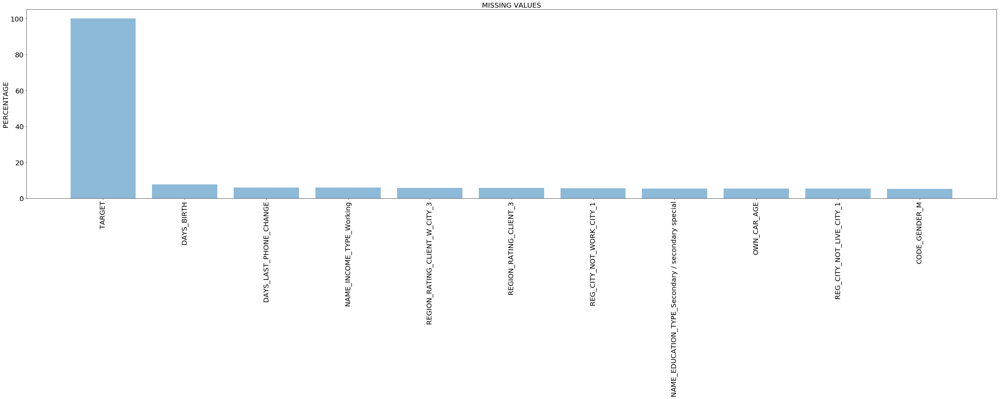

In [13]:
# Corr
val= x_corr['TARGET'].sort_values(ascending=False)*100
val = val[val.where(val>5)>0]
# Plots for relationship with Strongly correlated features
f.plot_bar(val.index,(50,10),val)


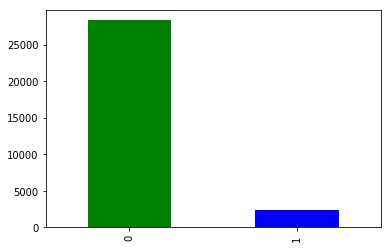

In [14]:
x_df.TARGET.value_counts().plot.bar(color=color_list)

##### Feature Observations: TARGET
1. Response Variable - Classification Problem. 0-No Default, 1-Default
2. Unbalanced Problem with less than 10% values of one class
3. Not sinificantly correlated with any of the available features

NAME_CONTRACT_TYPE


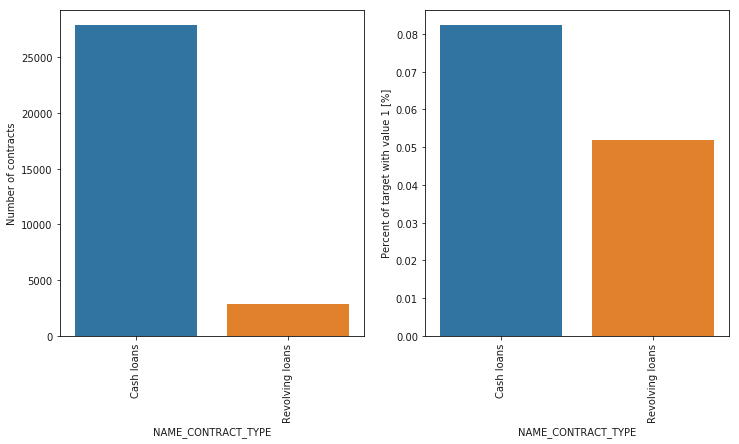

CODE_GENDER


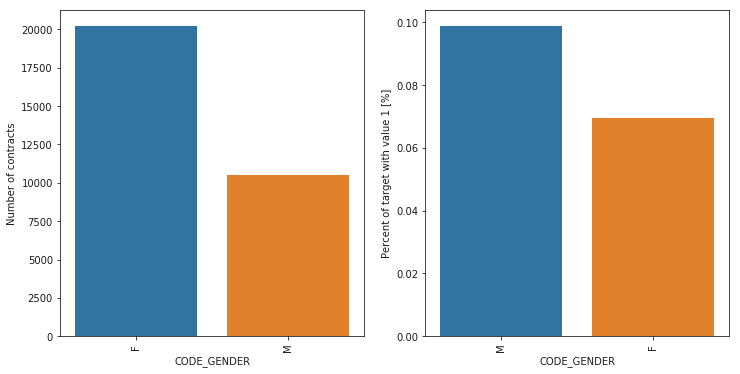

FLAG_OWN_CAR


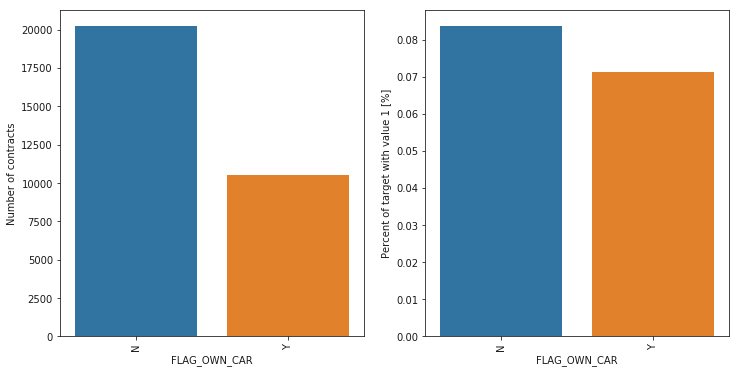

FLAG_OWN_REALTY


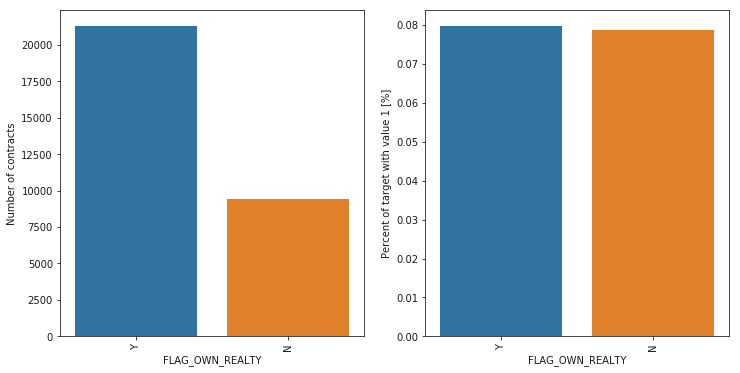

CNT_CHILDREN


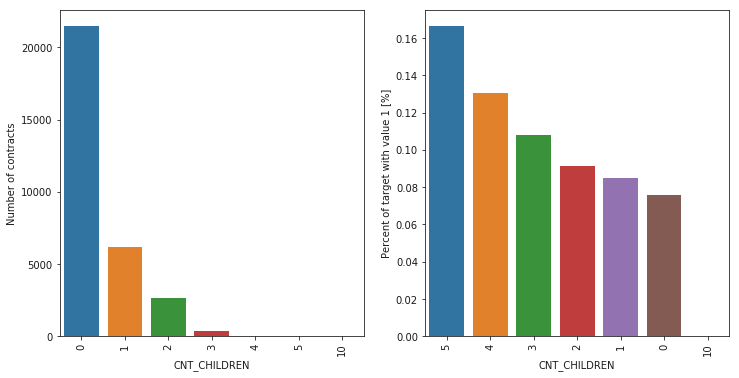

NAME_TYPE_SUITE


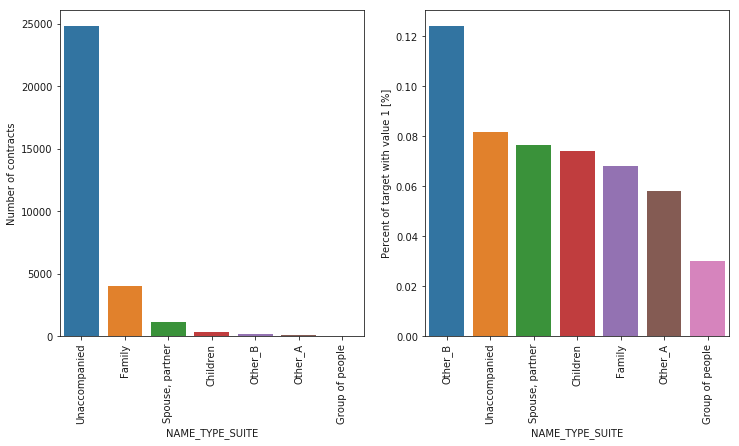

NAME_INCOME_TYPE


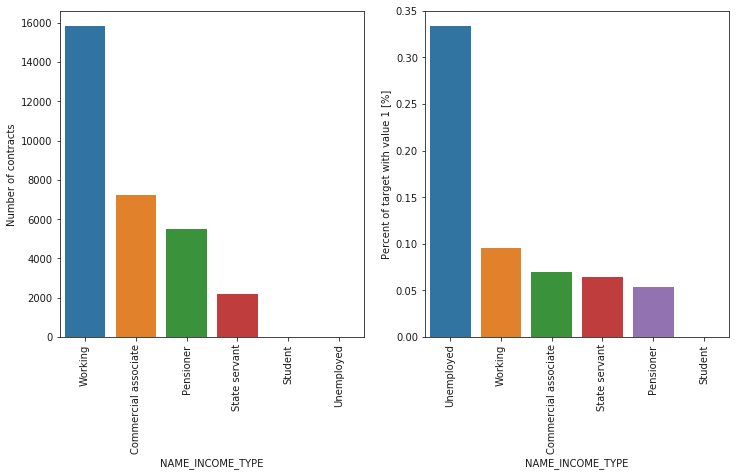

NAME_EDUCATION_TYPE


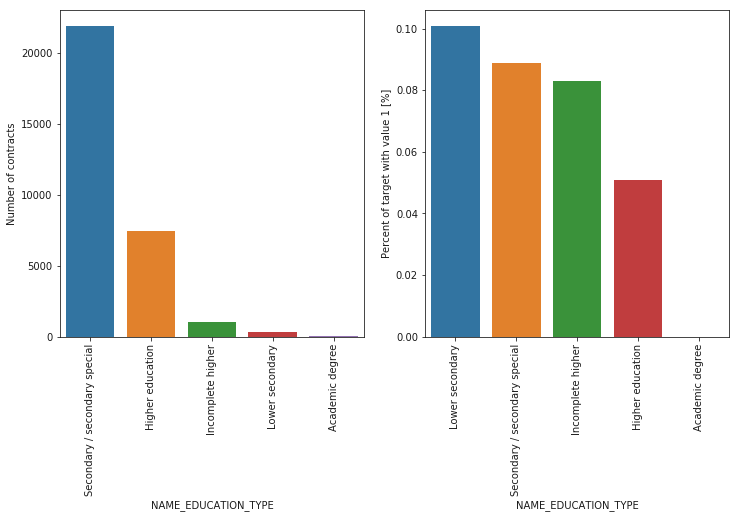

NAME_FAMILY_STATUS


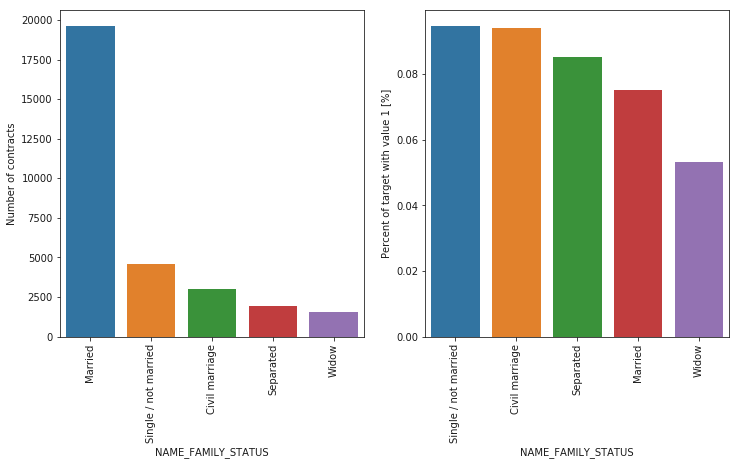

NAME_HOUSING_TYPE


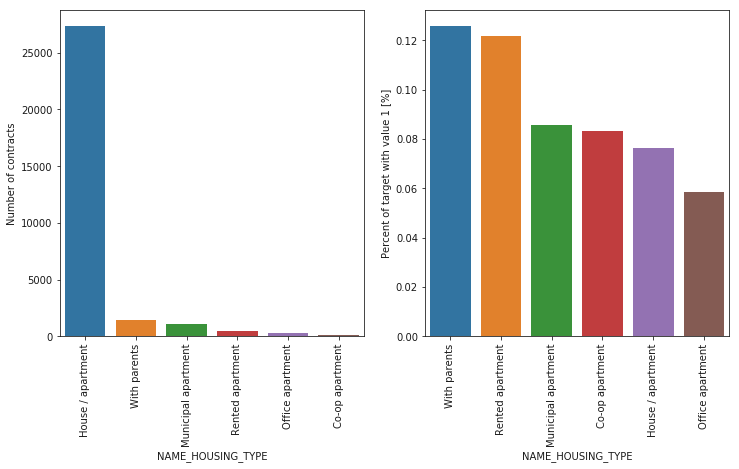

FLAG_MOBIL


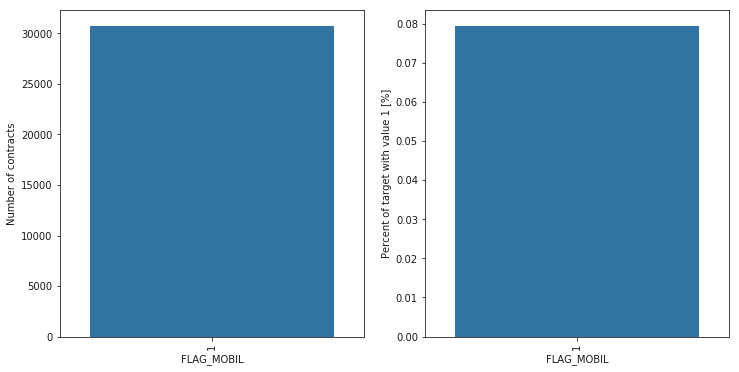

FLAG_EMP_PHONE


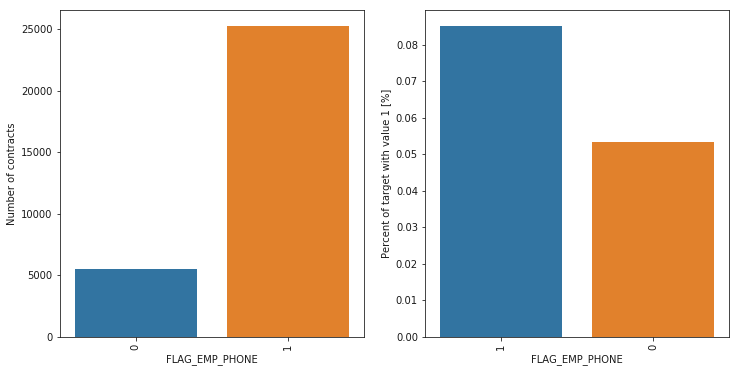

FLAG_WORK_PHONE


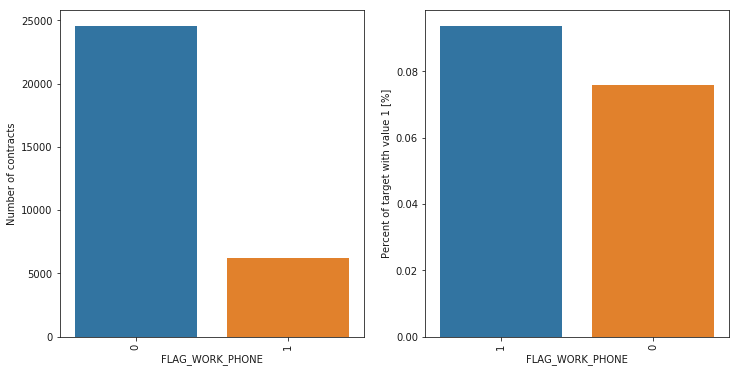

FLAG_CONT_MOBILE


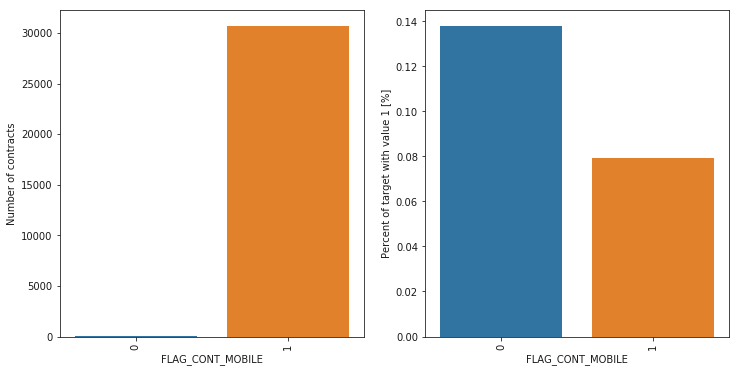

FLAG_PHONE


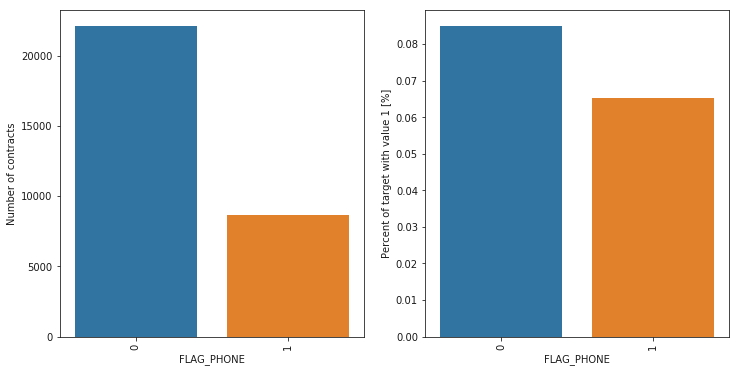

FLAG_EMAIL


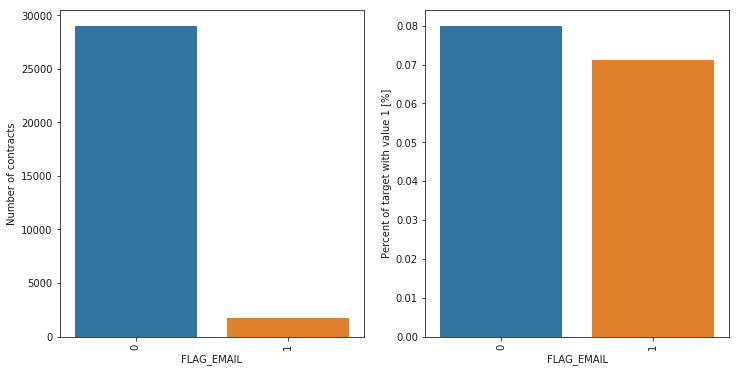

OCCUPATION_TYPE


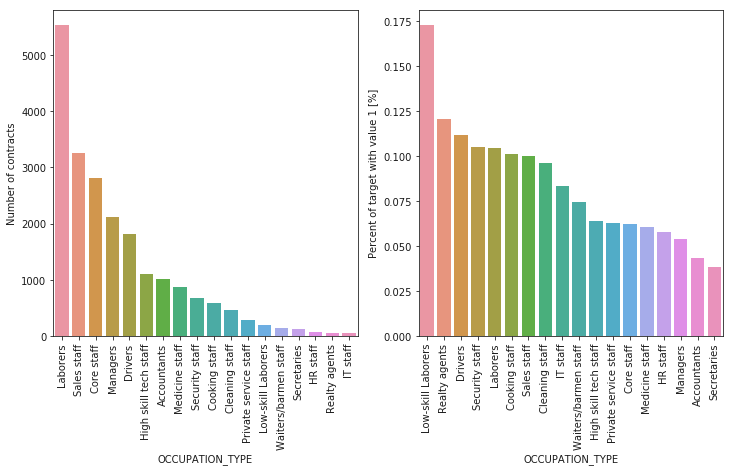

CNT_FAM_MEMBERS


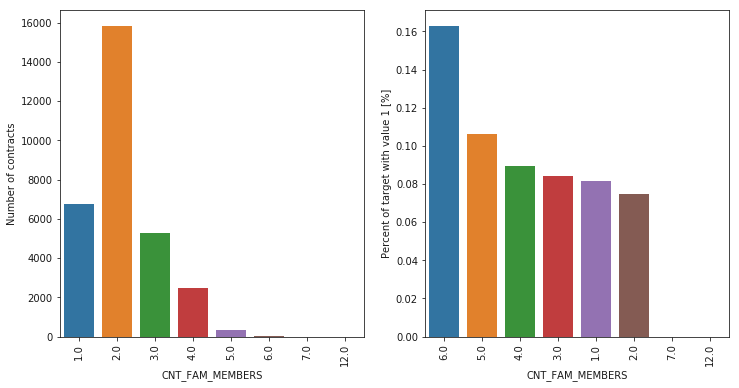

REGION_RATING_CLIENT


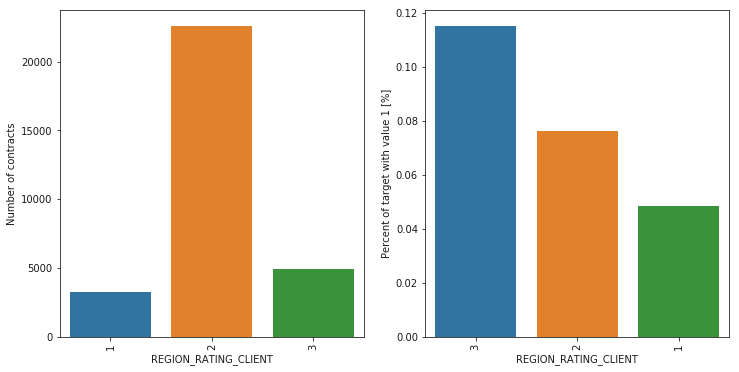

REGION_RATING_CLIENT_W_CITY


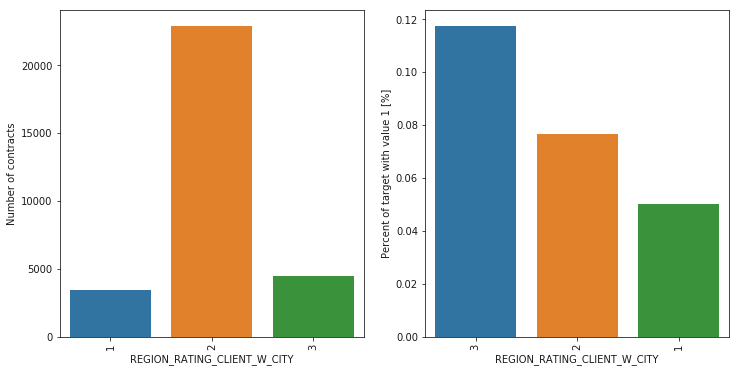

WEEKDAY_APPR_PROCESS_START


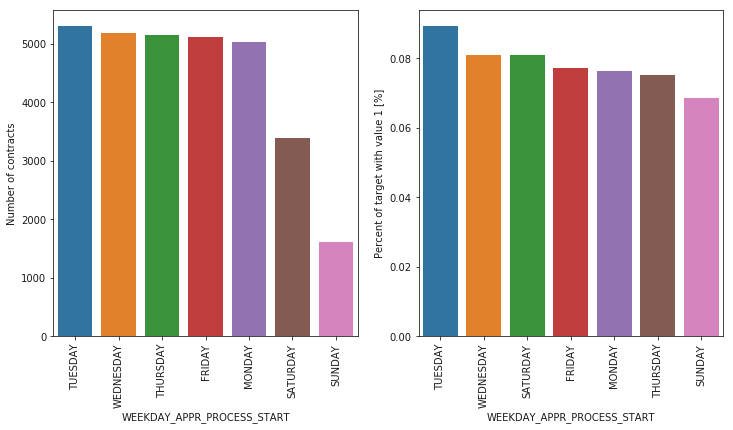

REG_REGION_NOT_LIVE_REGION


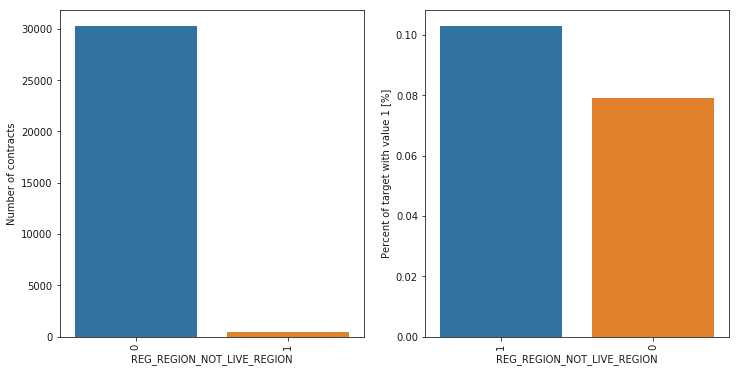

REG_REGION_NOT_WORK_REGION


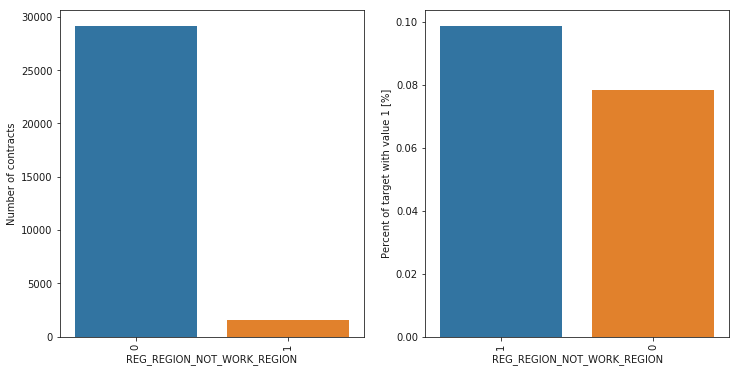

LIVE_REGION_NOT_WORK_REGION


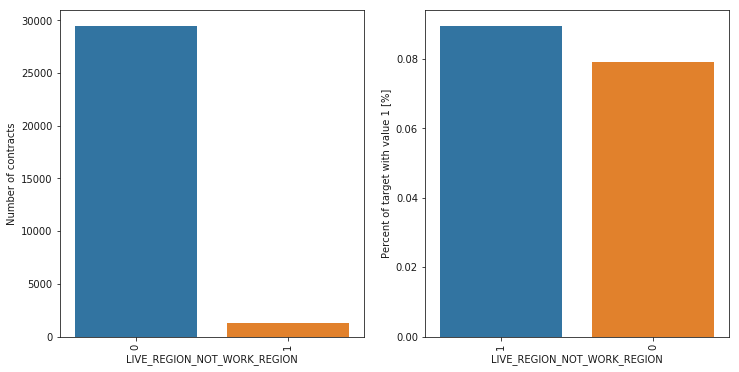

REG_CITY_NOT_LIVE_CITY


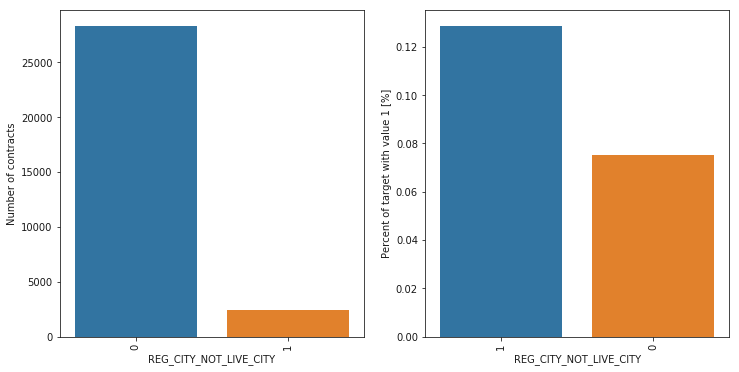

REG_CITY_NOT_WORK_CITY


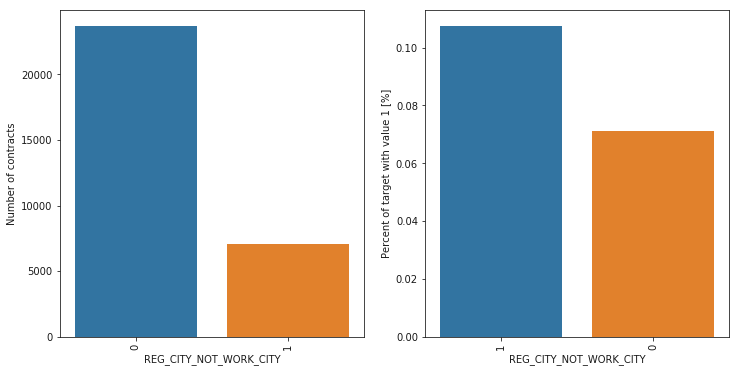

LIVE_CITY_NOT_WORK_CITY


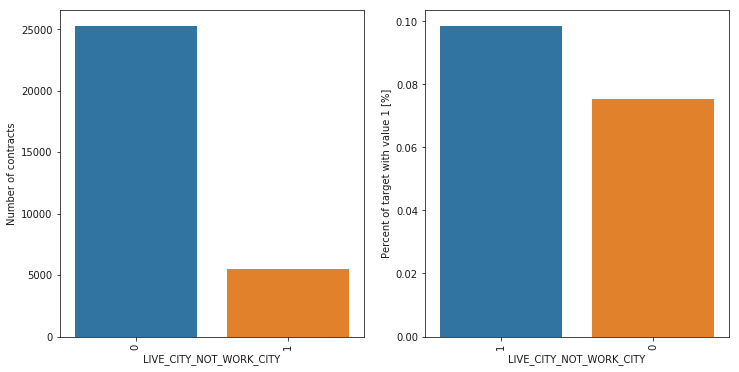

ORGANIZATION_TYPE


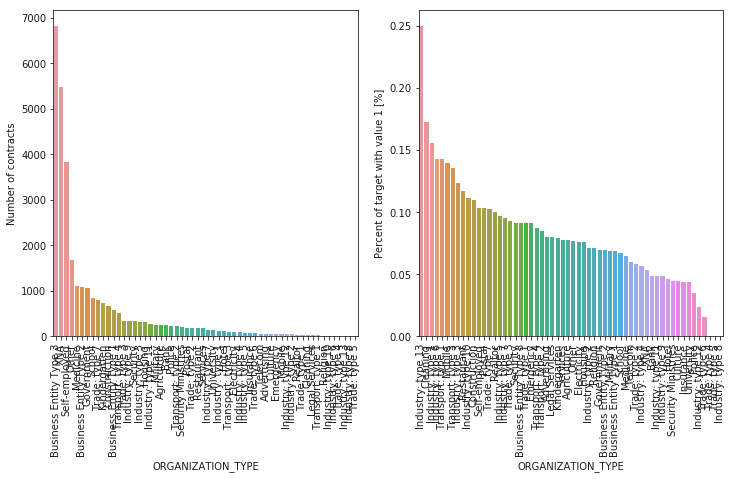

FONDKAPREMONT_MODE


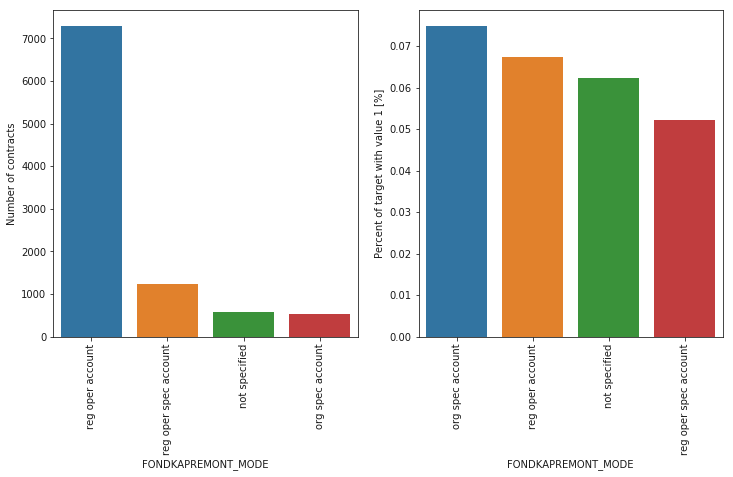

HOUSETYPE_MODE


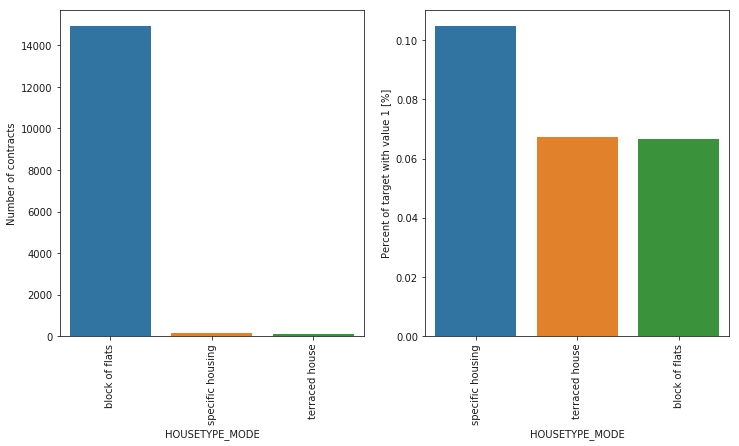

WALLSMATERIAL_MODE


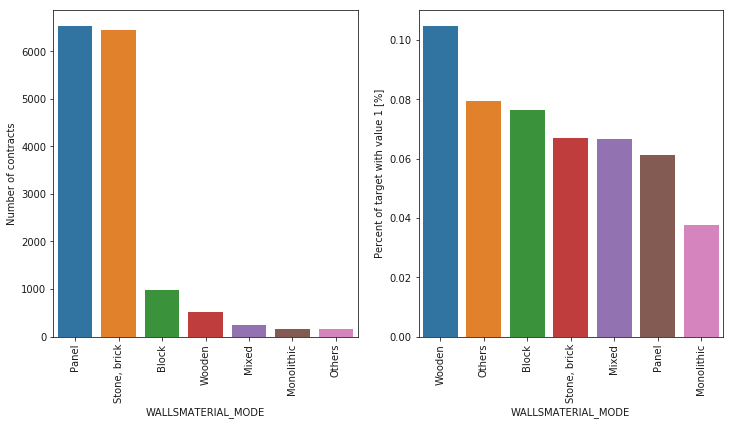

EMERGENCYSTATE_MODE


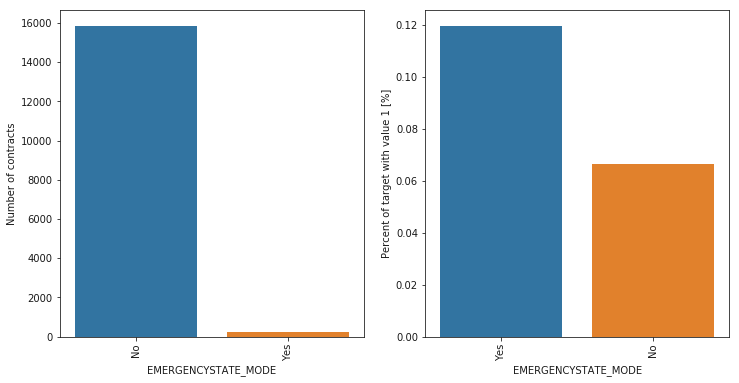

DEF_30_CNT_SOCIAL_CIRCLE


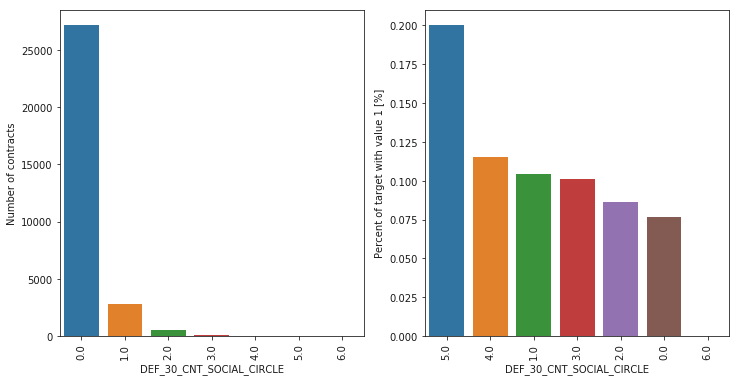

DEF_60_CNT_SOCIAL_CIRCLE


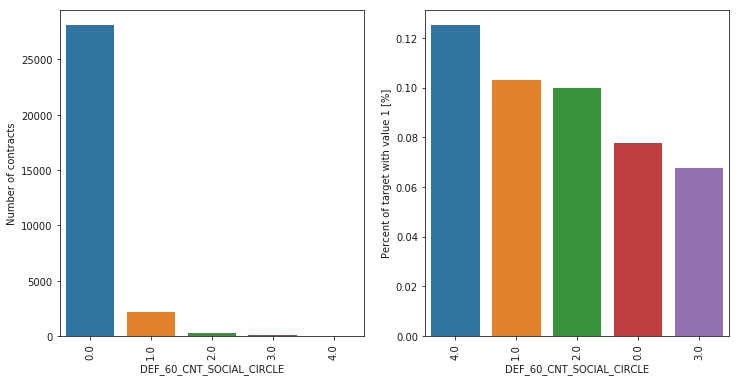

FLAG_DOCUMENT_2


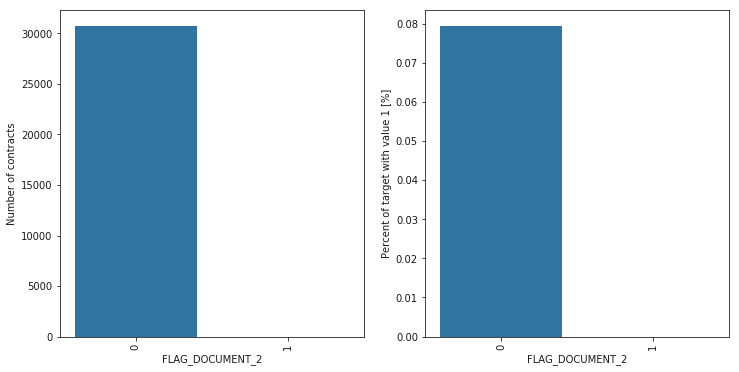

FLAG_DOCUMENT_3


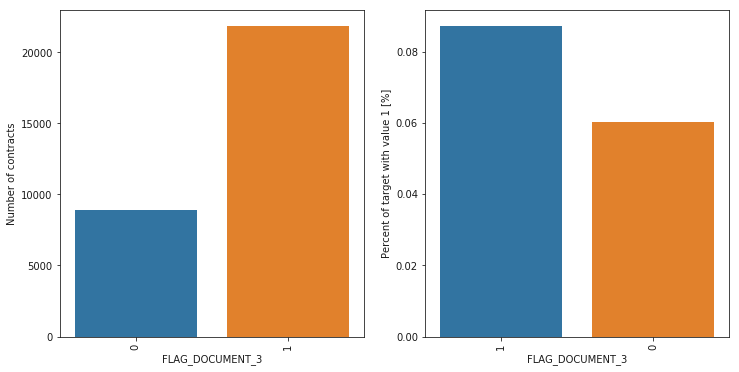

FLAG_DOCUMENT_4


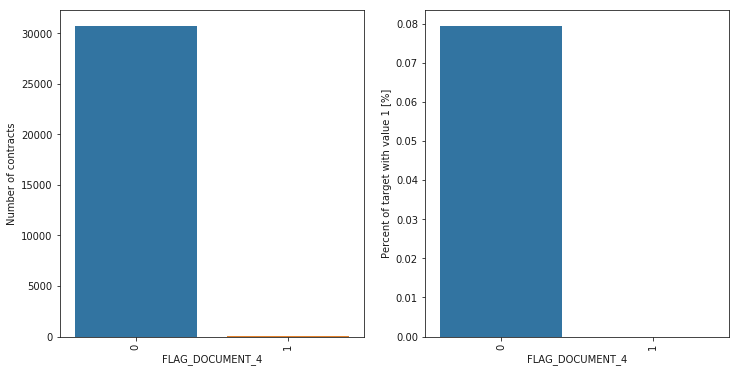

FLAG_DOCUMENT_5


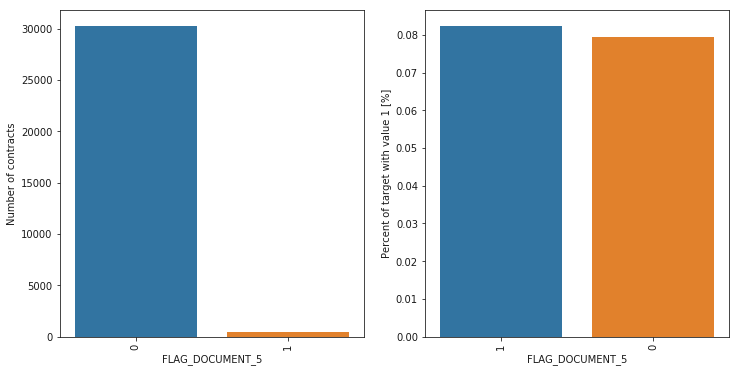

FLAG_DOCUMENT_6


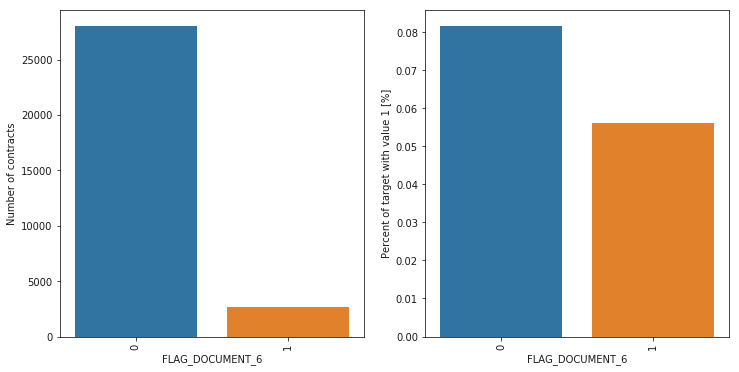

FLAG_DOCUMENT_7


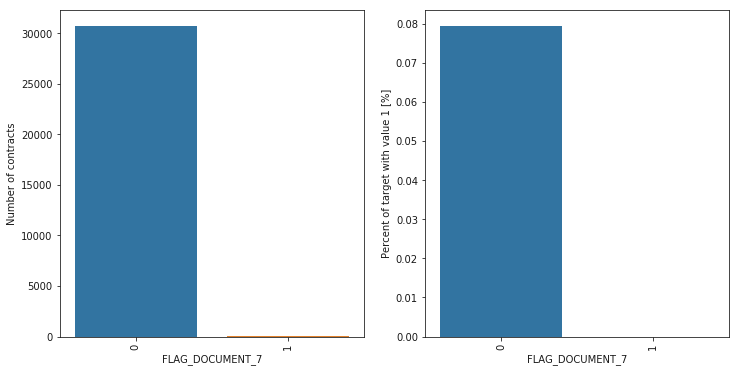

FLAG_DOCUMENT_8


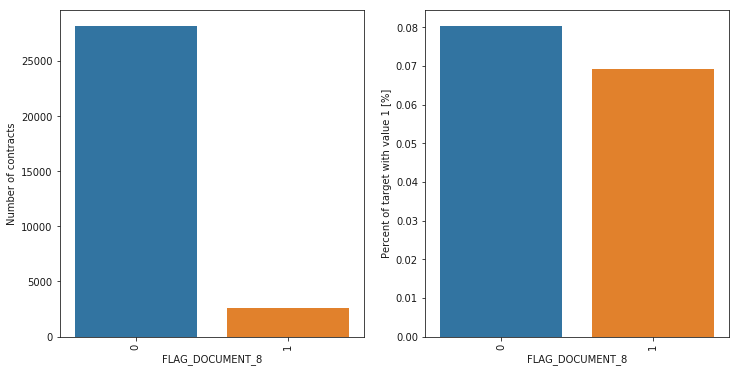

FLAG_DOCUMENT_9


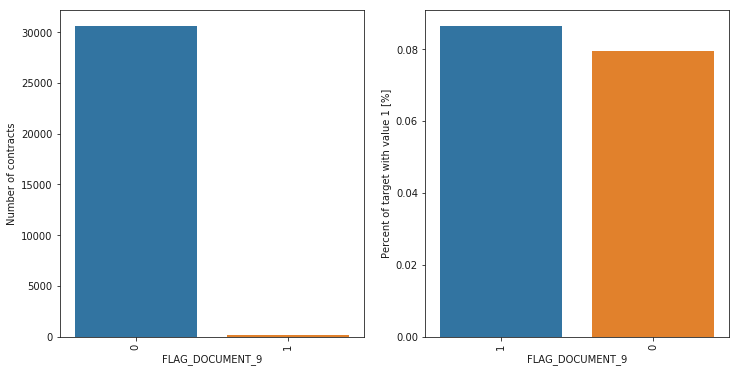

FLAG_DOCUMENT_10


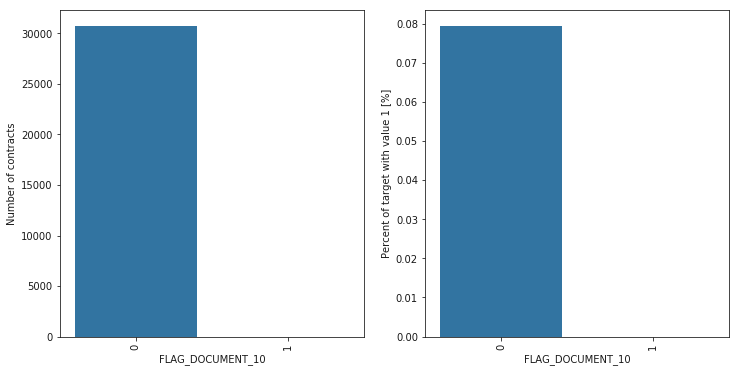

FLAG_DOCUMENT_11


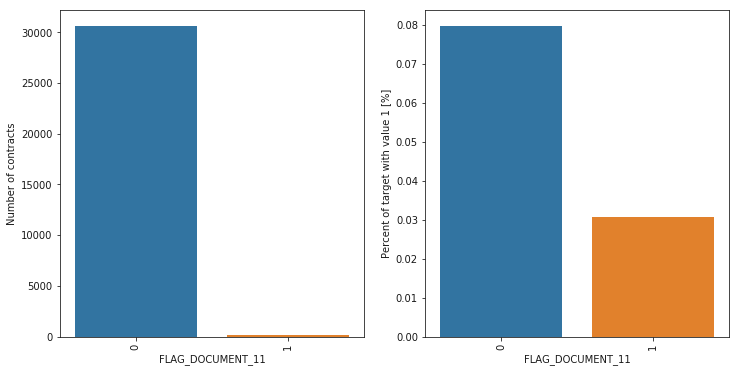

FLAG_DOCUMENT_12


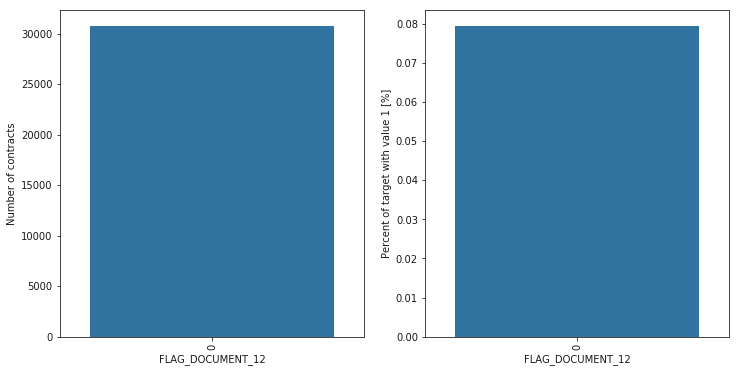

FLAG_DOCUMENT_13


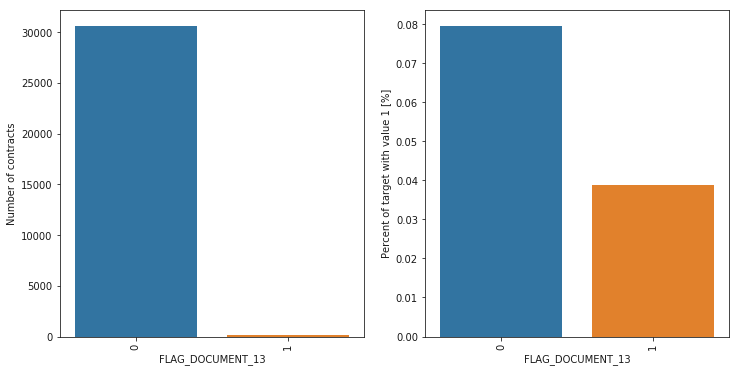

FLAG_DOCUMENT_14


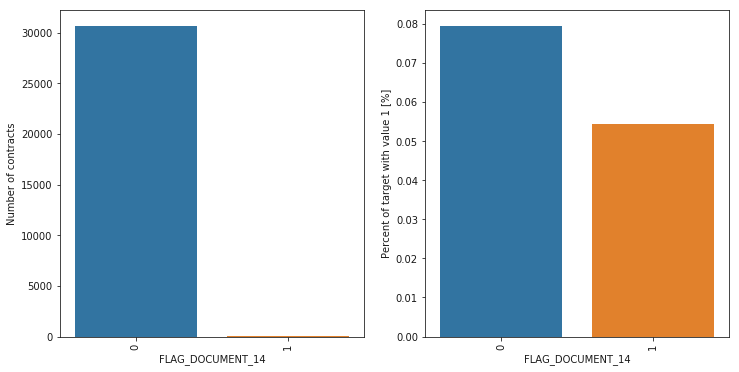

FLAG_DOCUMENT_15


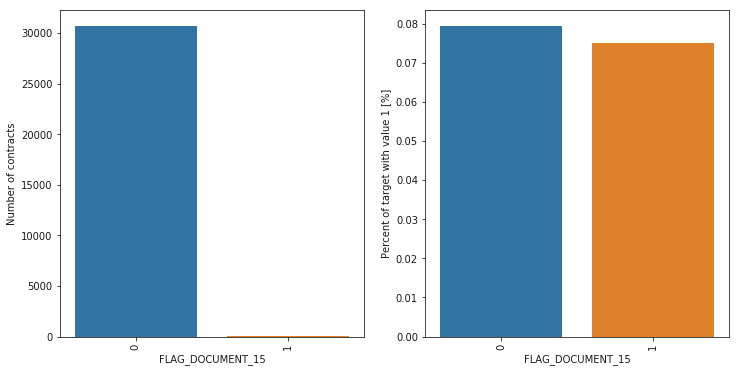

FLAG_DOCUMENT_16


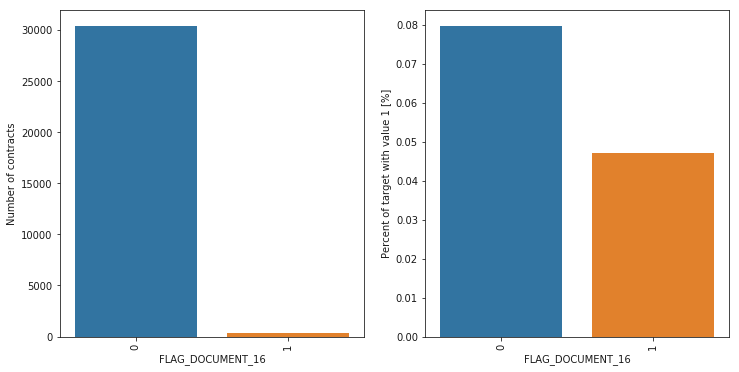

FLAG_DOCUMENT_17


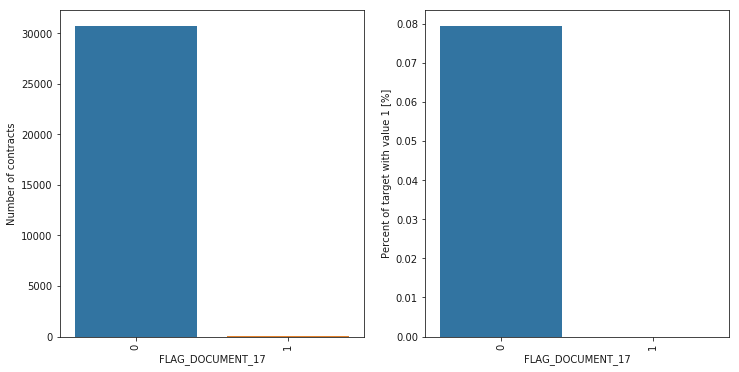

FLAG_DOCUMENT_18


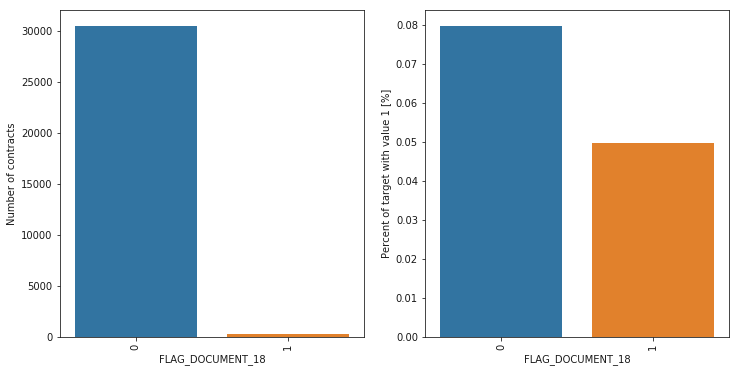

FLAG_DOCUMENT_19


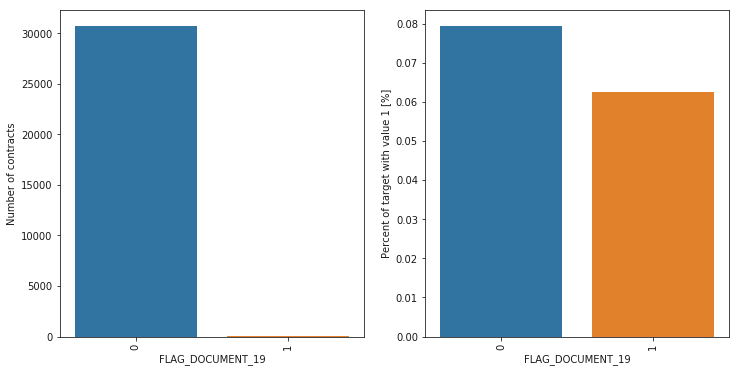

FLAG_DOCUMENT_20


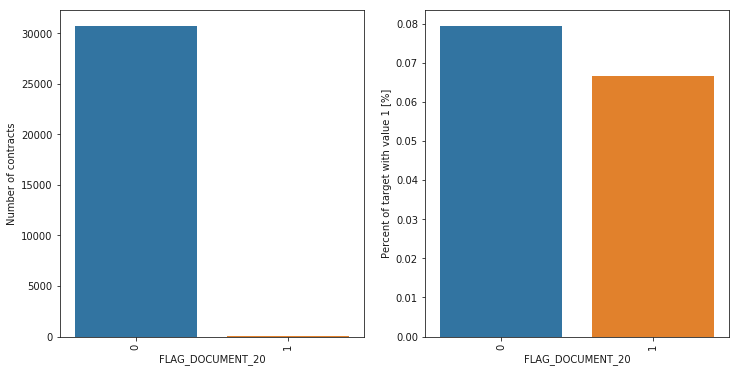

FLAG_DOCUMENT_21


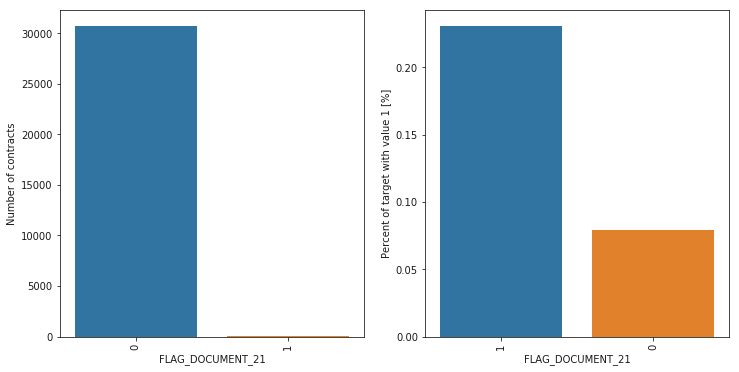

AMT_REQ_CREDIT_BUREAU_HOUR


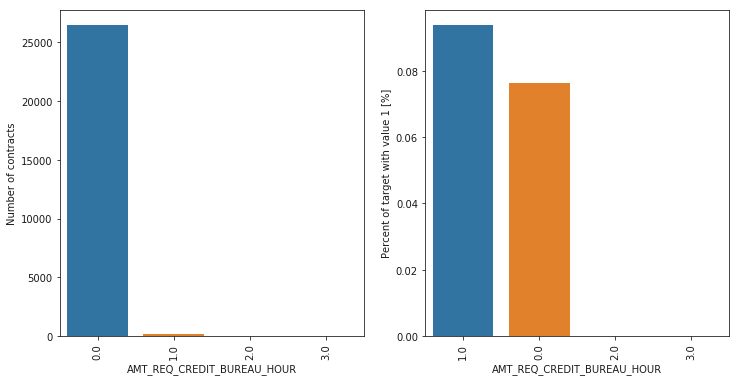

AMT_REQ_CREDIT_BUREAU_DAY


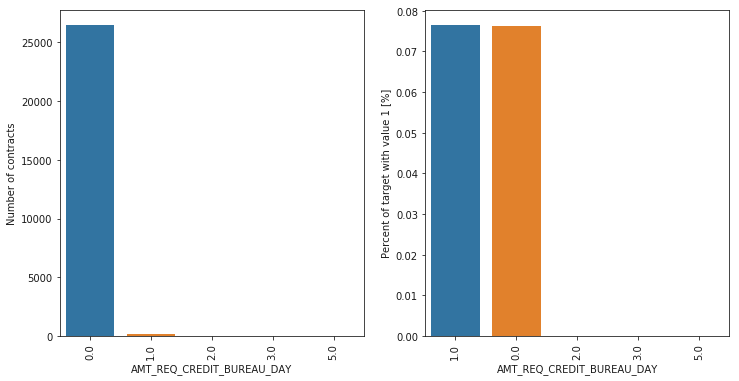

AMT_REQ_CREDIT_BUREAU_WEEK


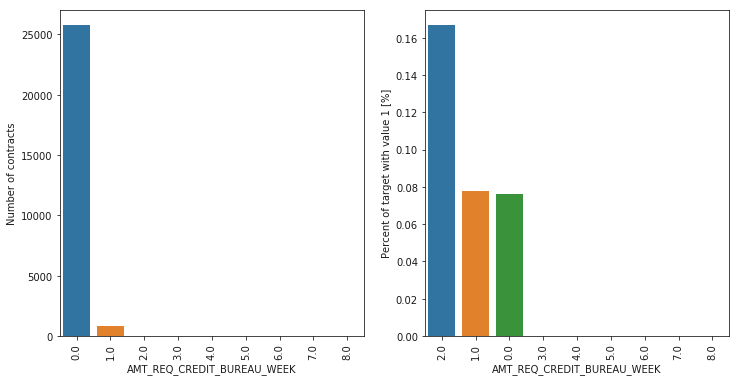

AMT_REQ_CREDIT_BUREAU_QRT


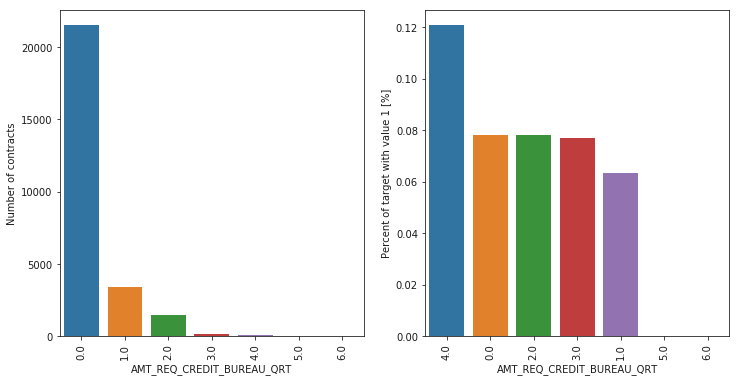

In [15]:
# FOR CATEGORICAL ATTRIBUTES: Distribution of Categories for whole dataset with respect to the Default conditions
for i in cat_feats:
    print(i)
    f.plot_stats(x_df, i,label_rotation=True,horizontal_layout=True)

##### IMPORTANT CORRELATIONS

C:\Users\kumarite\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:528: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



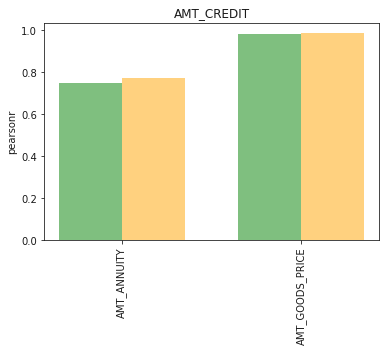

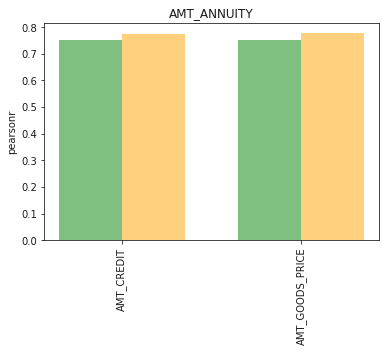

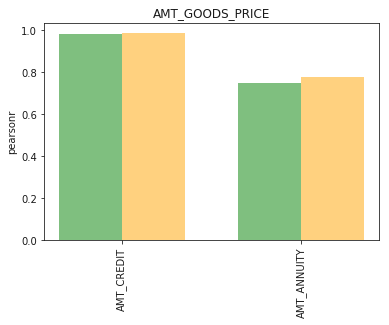

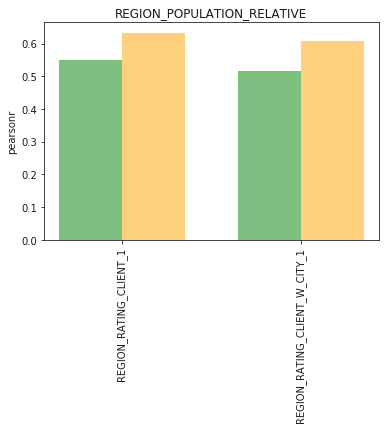

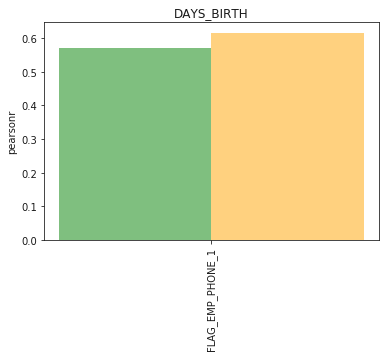

...

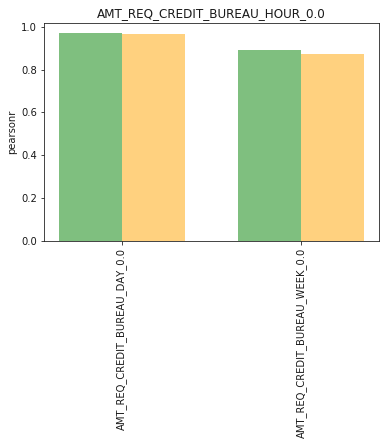

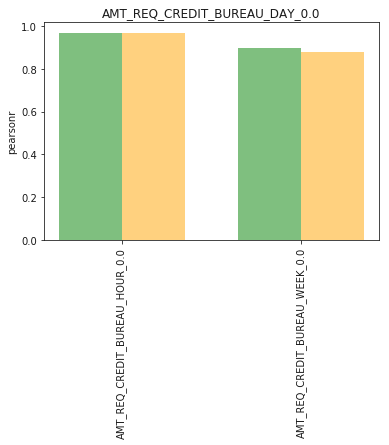

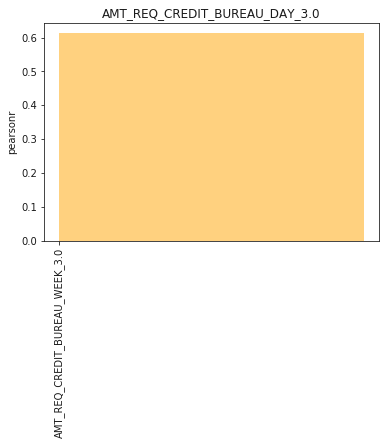

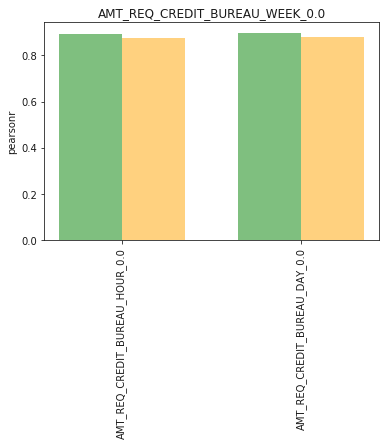

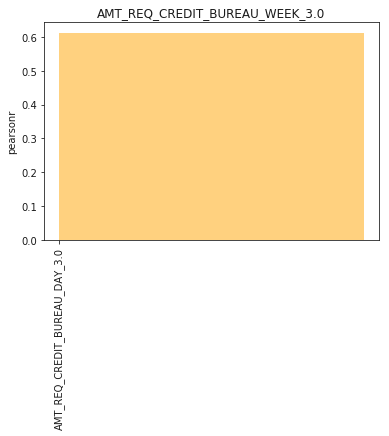

In [16]:
# Get the correlation plot for highly correlated features only for ALL VS DEFAULTERS

get_highly_corr_feats_for_corr = get_highly_corr_feats.feature.tolist()
fig_each_row = 3
no_rows = (len(get_highly_corr_feats_for_corr)//fig_each_row)+1
if (len(get_highly_corr_feats_for_corr)%fig_each_row) > 0:
    no_rows = no_rows+1
    
for i in get_highly_corr_feats_for_corr:
    m = get_highly_corr_feats[get_highly_corr_feats.feature == i].corr_feats.values[0]
    y_pos = np.arange(len(m))
    #feats_for_corr= [x for x in nval.index.tolist() if x in m]
    width = 0.35

    plt.figure(figsize=(len(m)*2,3))
    abc, ax1 = plt.subplots()
    
    val = x_corr_default[i].sort_values(ascending=False)
    nval = x_corr[i].sort_values(ascending=False)
    #val = f.get_corr(x_corr_default,i)
    rects1 = ax1.bar(y_pos-width/2, val.filter(items=m), width, align='center', alpha=0.5,label='DEFAULTERS',color = color_list[0])
    rects2 = ax1.bar(y_pos+width/2, nval.filter(items=m), width, align='center', alpha=0.5,label = 'ALL',color = color_list[2])

    ax1.set_ylabel('pearsonr')
    ax1.set_title(i)
    plt.xticks(rotation='vertical')
    ax1.set_xticks(y_pos)
    ax1.set_xticklabels(m)



#f.plot_bar(m,(10,5),val.filter(items=m))
# put the value of highly correlated features extracted from dataframe to get the graph for highly correlated features only

In [17]:
# Get the important universal categorical features and create a facet Grid with feature in question and the target variable
imp_cat_feats = ['NAME_CONTRACT_TYPE','CODE_GENDER','FLAG_OWN_CAR','FLAG_OWN_REALTY','CNT_CHILDREN','NAME_INCOME_TYPE','NAME_EDUCATION_TYPE','NAME_FAMILY_STATUS','NAME_HOUSING_TYPE','CNT_FAM_MEMBERS']
imp_num_feats = ['AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY','AMT_GOODS_PRICE','REGION_POPULATION_RELATIVE','DAYS_BIRTH','DAYS_EMPLOYED']

### EDA FOR ALL COLUMNS 

##### NAME_CONTRACT_TYPE

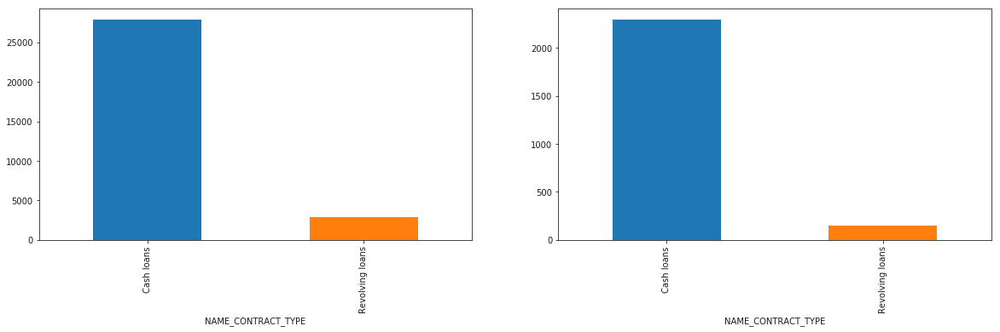

In [18]:
feature = 'NAME_CONTRACT_TYPE'
plt.figure(figsize=(20,5))
plt.subplot2grid((1,2),(0,0),rowspan=1,colspan=1)
x_df.groupby(feature).SK_ID_CURR.count().plot.bar()

plt.subplot2grid((1,2),(0,1),rowspan=1,colspan=1)
x_df[x_df['TARGET']==1].groupby(feature).SK_ID_CURR.count().plot.bar()

plt.show()

In [19]:
corr_thres = .1

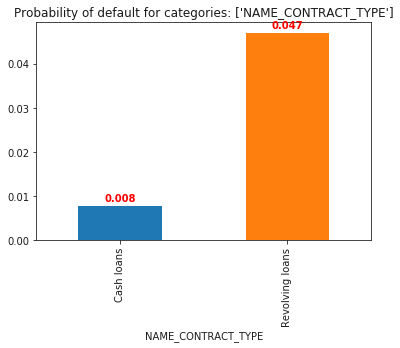

In [20]:
# Default ratio for the feature
lst = []
lst.append(feature)
f.default_ratio(x_df,['TARGET'],1,0,lst,.001)

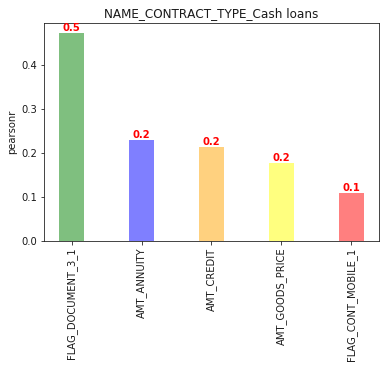

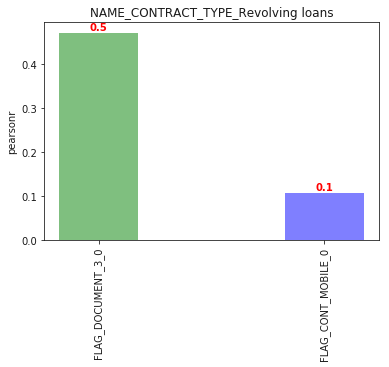

In [21]:
# Higher Correlations of all categories of feature with all other features

categories = x_corr.filter(like=feature,axis=0).index.tolist()

rng = np.arange(len(categories))
for i in categories:
    
    val= x_corr[i].sort_values(ascending=False)
    val = val[val.where((val>corr_thres) & (val!=1))>0]
    
    y_pos = np.arange(len(val.index))
    width = 0.35

    abc, ax1 = plt.subplots()
    rects1 = ax1.bar(y_pos-width/2, val, width, align='center', alpha=0.5,label=i,color = color_list)
    for v,c in enumerate(val):
        ax1.text(v-width/2, 
                c+.005, 
                round(c,1), 
                color='red', 
                fontweight='bold',
                horizontalalignment='center')
    
    ax1.set_ylabel('pearsonr')
    ax1.set_title(i)
    plt.xticks(rotation='vertical')
    ax1.set_xticks(y_pos-width/2)
    ax1.set_xticklabels(val.index)

NAME_CONTRACT_TYPE  VS  CODE_GENDER  VS TARGET


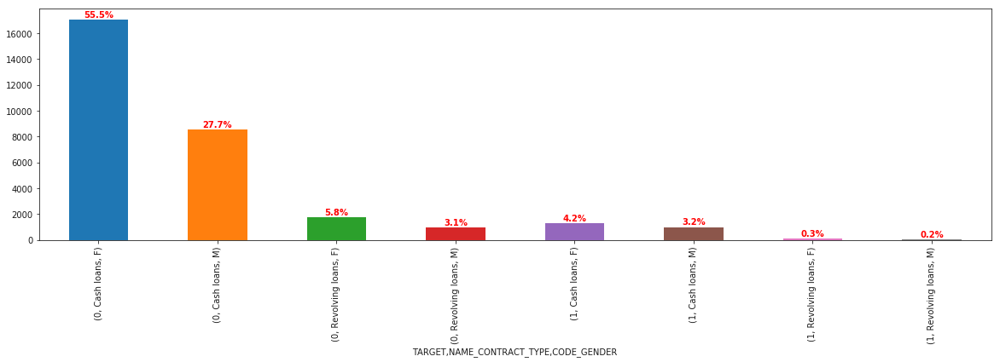

NAME_CONTRACT_TYPE  VS  FLAG_OWN_CAR  VS TARGET


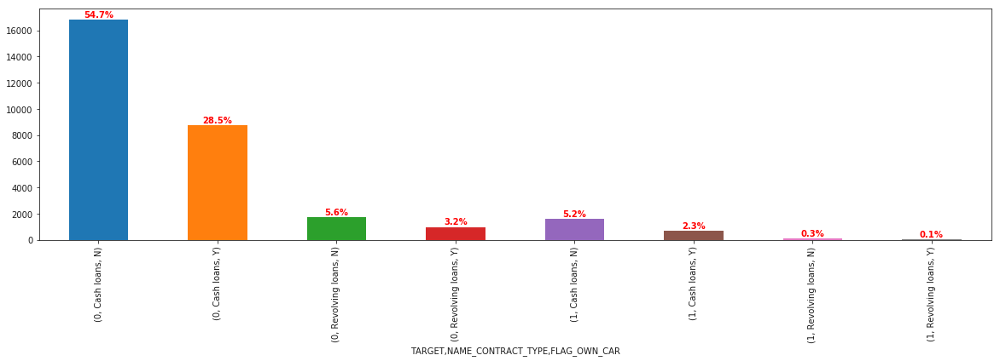

NAME_CONTRACT_TYPE  VS  FLAG_OWN_REALTY  VS TARGET


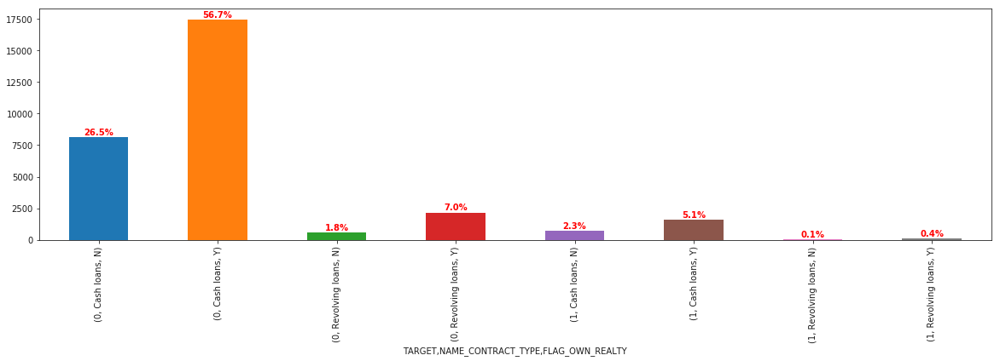

NAME_CONTRACT_TYPE  VS  CNT_CHILDREN  VS TARGET


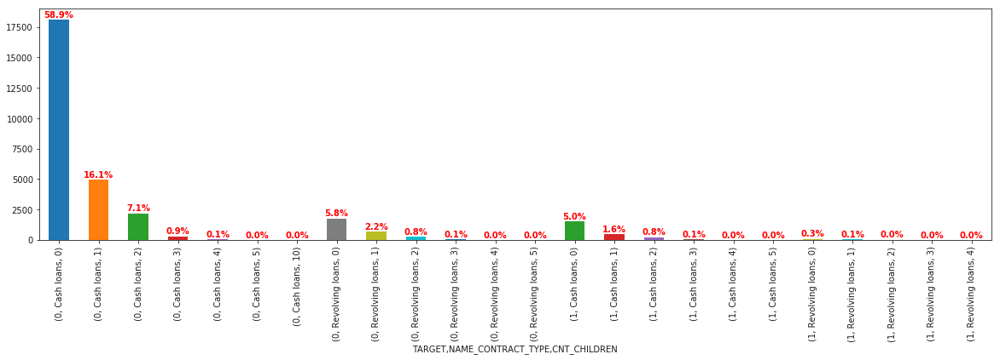

NAME_CONTRACT_TYPE  VS  NAME_INCOME_TYPE  VS TARGET


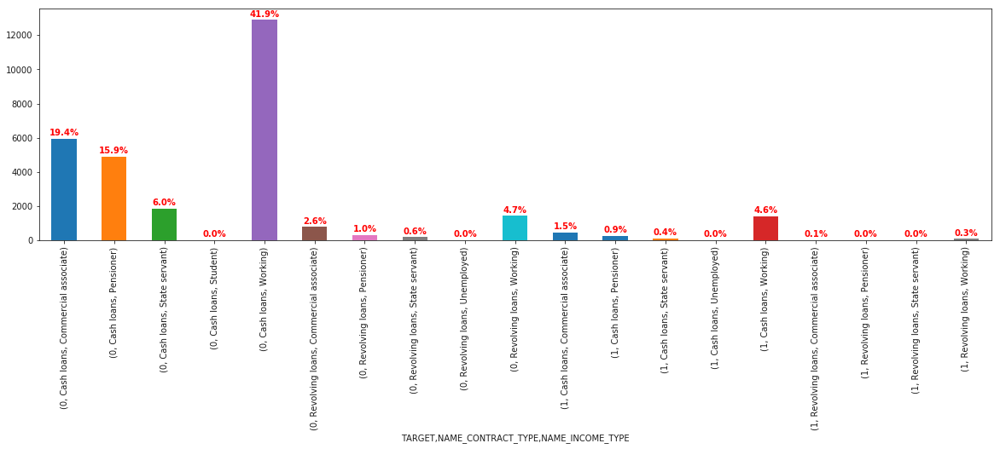

NAME_CONTRACT_TYPE  VS  NAME_EDUCATION_TYPE  VS TARGET


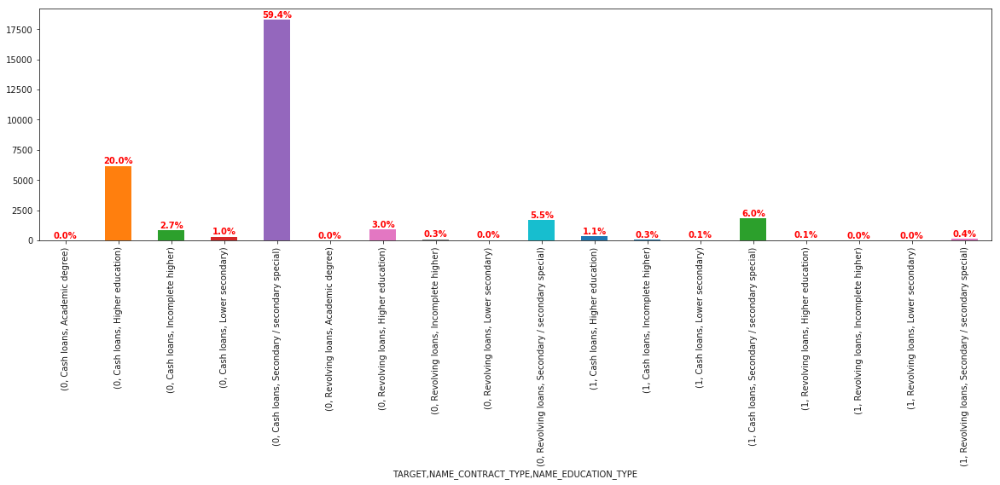

NAME_CONTRACT_TYPE  VS  NAME_FAMILY_STATUS  VS TARGET


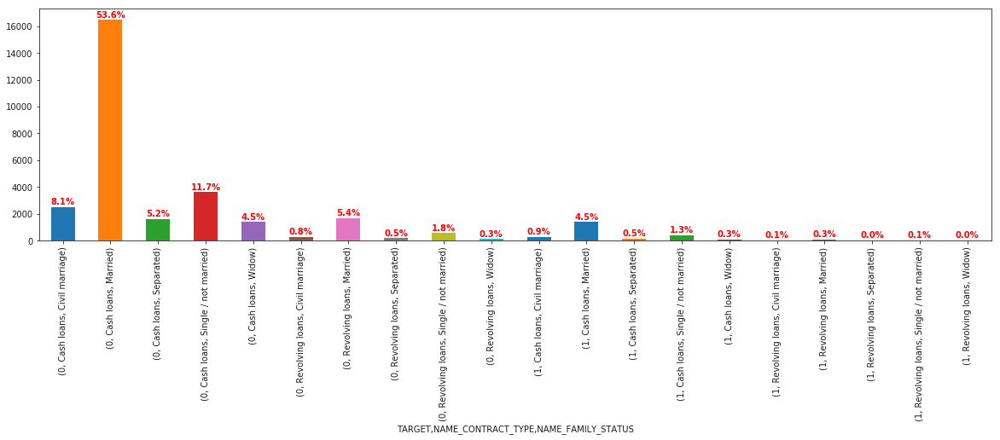

NAME_CONTRACT_TYPE  VS  NAME_HOUSING_TYPE  VS TARGET


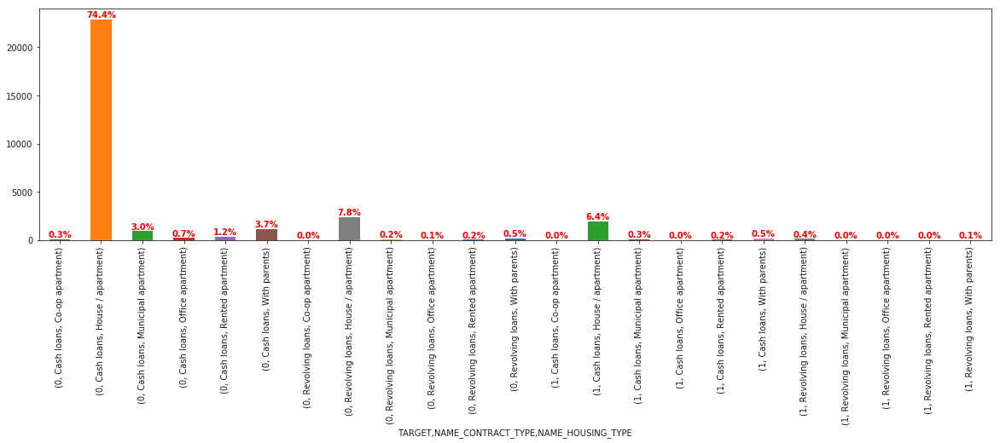

NAME_CONTRACT_TYPE  VS  CNT_FAM_MEMBERS  VS TARGET


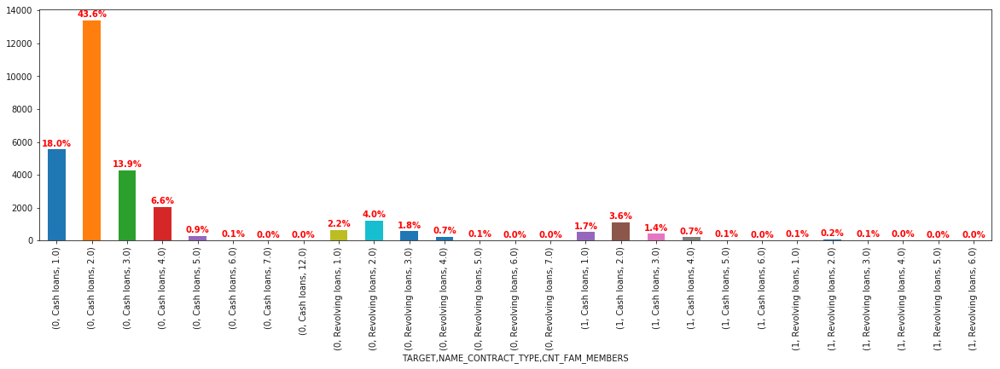

In [22]:
# Feature relationship with important categorical feats
for i in imp_cat_feats:
    if i != feature :
        print(feature," VS ",i, " VS TARGET")
        width=.5
        plt.figure(figsize=(20,5))
        g = x_df.groupby(by = ['TARGET',feature,i])
        vc = g.SK_ID_CURR.count()
        ax = vc.plot.bar(width=width)
        
        for v,c in enumerate(vc):
            ax.text(v, 
                    c+200, 
                    '{}%'.format(round((c/x_df.shape[0])*100,1)), 
                    color='red', 
                    fontweight='bold',
                    horizontalalignment='center')
        plt.show()

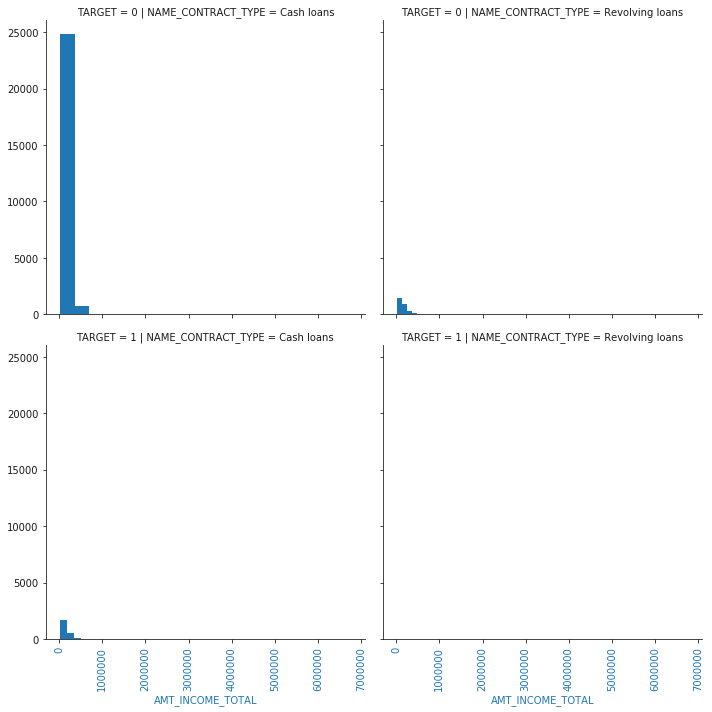

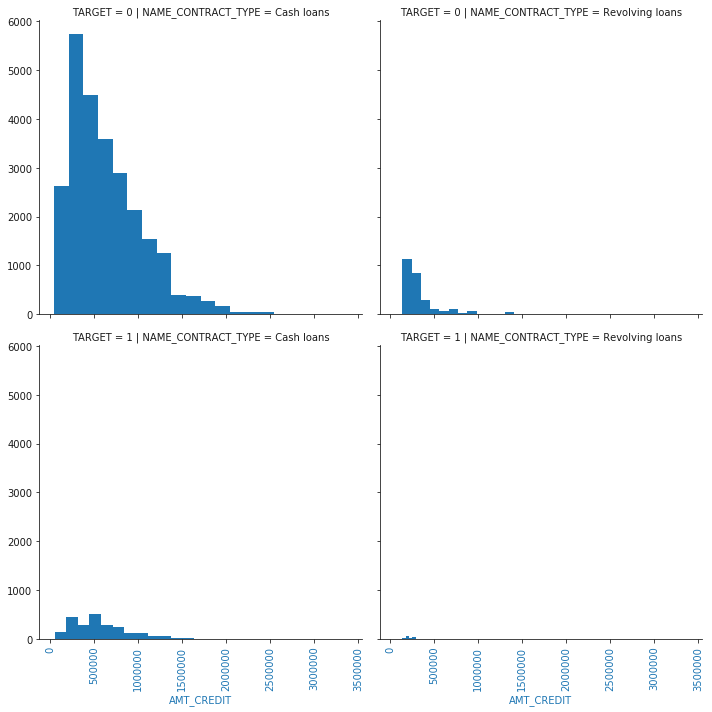

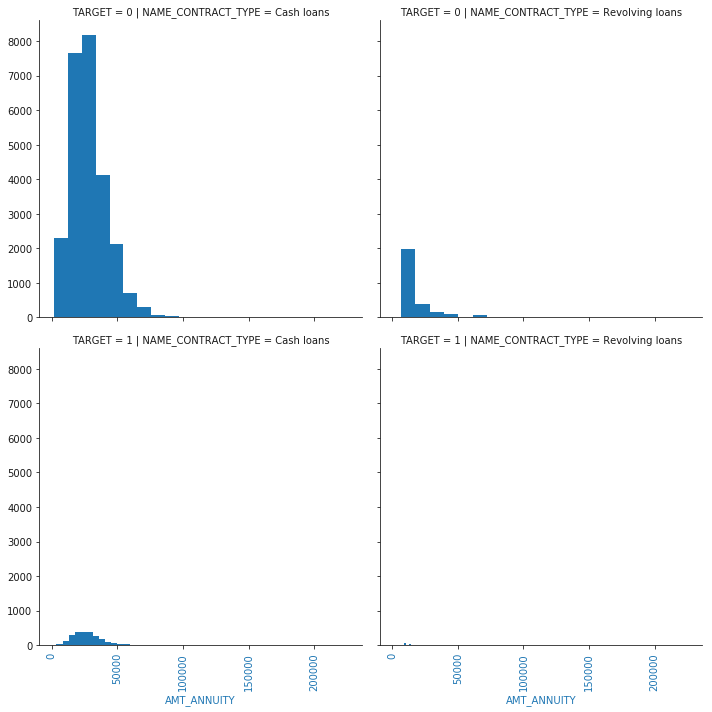

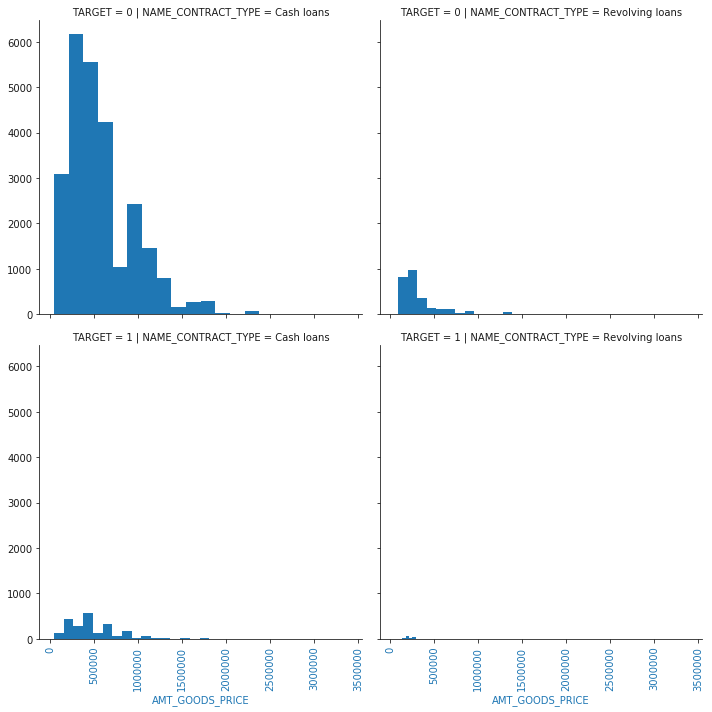

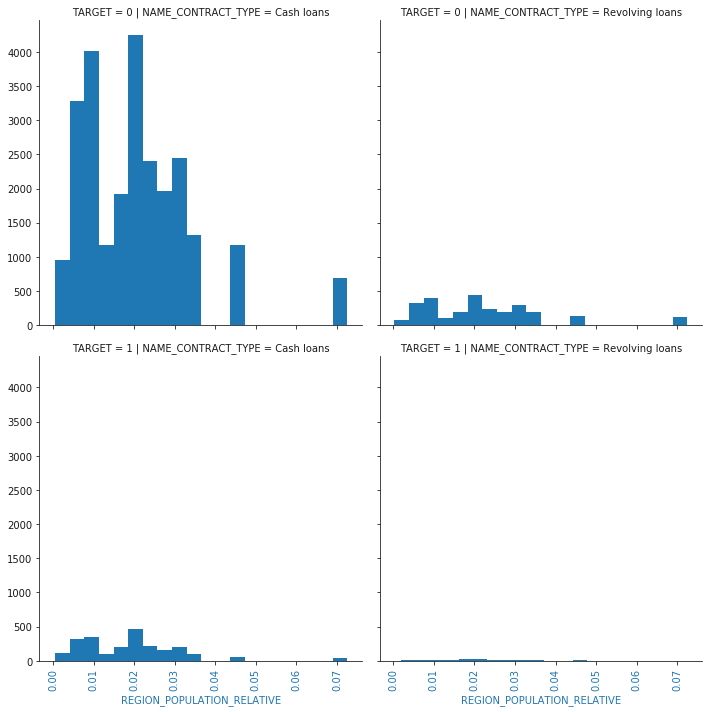

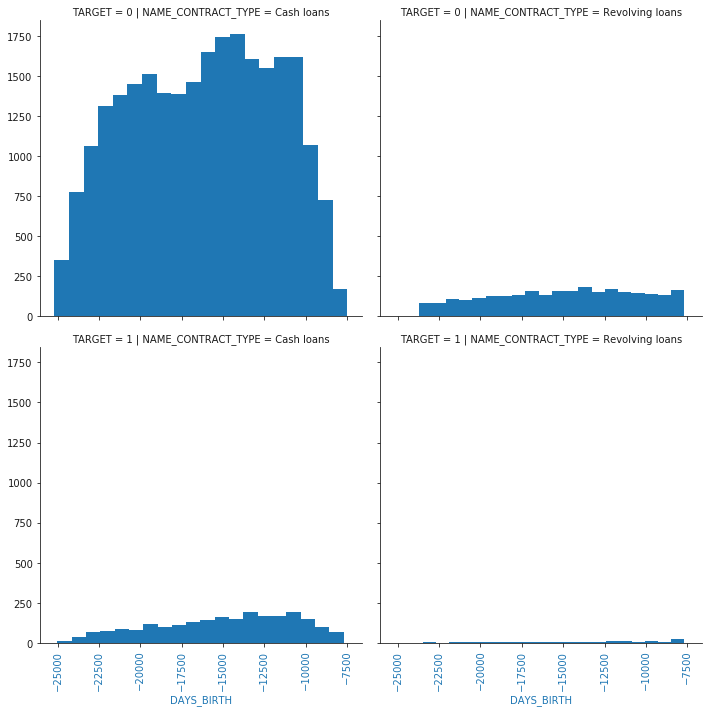

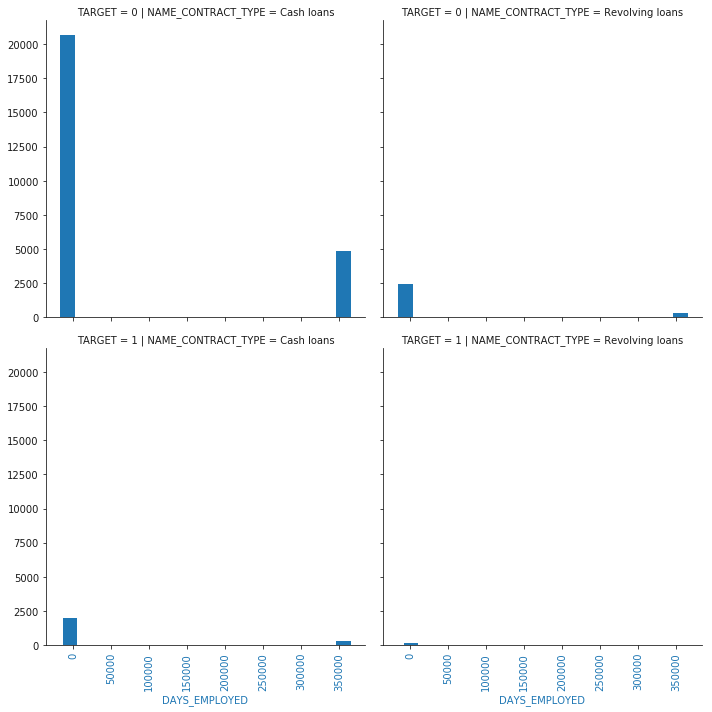

In [23]:
# Feature relationship with important numerical feats

from itertools import cycle, islice
for i in imp_num_feats:
    g = sns.FacetGrid(x_df, row="TARGET",  col=feature,size=5)
    g = g.map(plt.hist, i,bins=20)
    g.map(plt.xticks, rotation=90)
    g.map(plt.xlabel,i)

##### Observations:NAME_CONTRACT_TYPE
1. The revolving loans in the dataset are less than 10% of cash loans
2. There is no significant relationship of cash loans to Defaulting vs Revolving loans
3. The attribute seems to be intermediately correlated with FLAG_DOCUMENT_3 and somewhat with AMT_ANNUITY. This could mean that with increase in annuity amount revolving loans decreases and Cash Loans increases which could mean that people could not afford to revolve with such high annuity. This implies that the people want to save their high interest and late fees but with less annuity they do not mind revolving the loan.

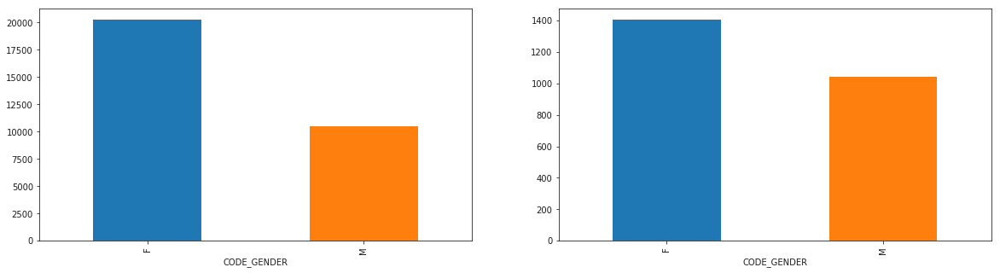

In [24]:
feature = 'CODE_GENDER'
plt.figure(figsize=(20,5))
plt.subplot2grid((1,2),(0,0),rowspan=1,colspan=1)
x_df.groupby(feature).SK_ID_CURR.count().plot.bar()
plt.subplot2grid((1,2),(0,1),rowspan=1,colspan=1)
x_df[x_df['TARGET']==1].groupby(feature).SK_ID_CURR.count().plot.bar()
plt.show()

In [25]:
corr_thres = .1


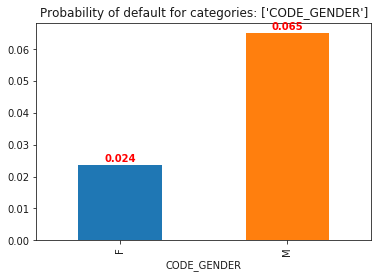

In [26]:
# Probability of default for the feature categories
lst = []
lst.append(feature)
f.default_ratio(x_df,['TARGET'],1,0,lst,.001)

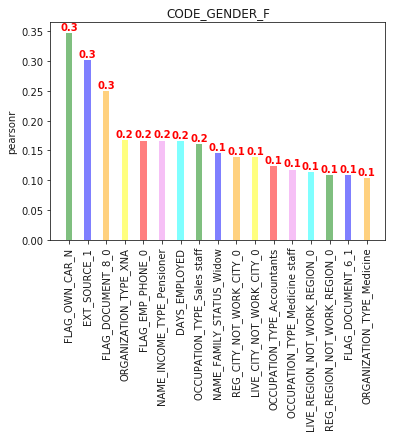

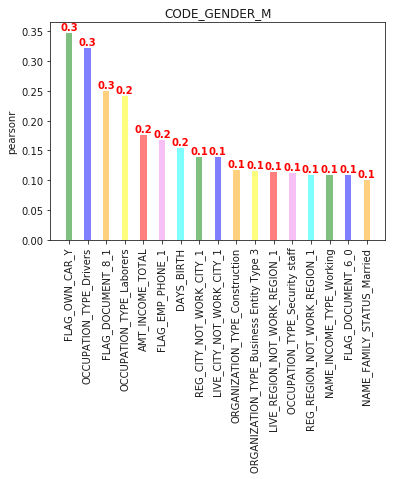

In [28]:
# Higher Correlations of all categories of feature with all other features

categories = x_corr.filter(like=feature,axis=0).index.tolist()

rng = np.arange(len(categories))
for i in categories:
    
    val= x_corr[i].sort_values(ascending=False)
    val = val[val.where((val>corr_thres) & (val!=1))>0]
    
    y_pos = np.arange(len(val.index))
    width = 0.35

    abc, ax1 = plt.subplots()
    rects1 = ax1.bar(y_pos-width/2, val, width, align='center', alpha=0.5,label=i,color = color_list)
    for v,c in enumerate(val):
        ax1.text(v-width/2, 
                c+.005, 
                round(c,1), 
                color='red', 
                fontweight='bold',
                horizontalalignment='center')
    
    ax1.set_ylabel('pearsonr')
    ax1.set_title(i)
    plt.xticks(rotation='vertical')
    ax1.set_xticks(y_pos-width/2)
    ax1.set_xticklabels(val.index)

CODE_GENDER  VS  NAME_CONTRACT_TYPE  VS TARGET


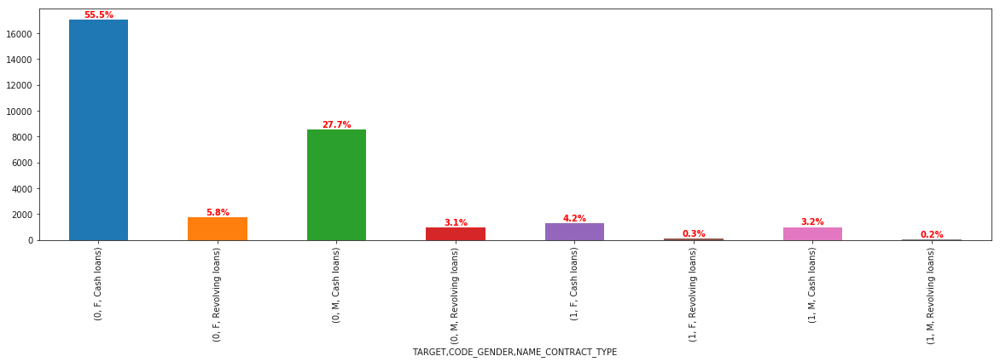

CODE_GENDER  VS  FLAG_OWN_CAR  VS TARGET


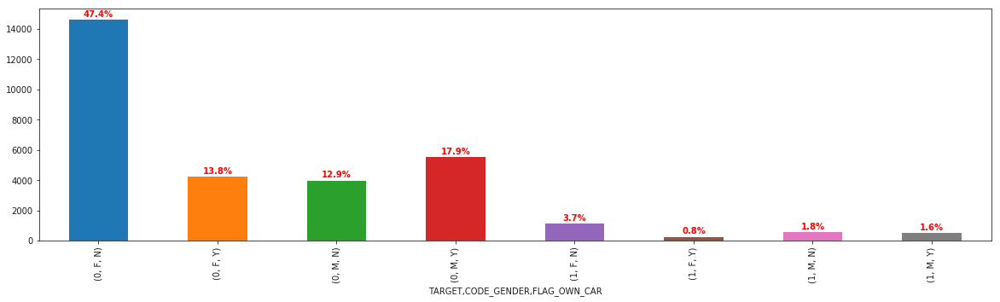

CODE_GENDER  VS  FLAG_OWN_REALTY  VS TARGET


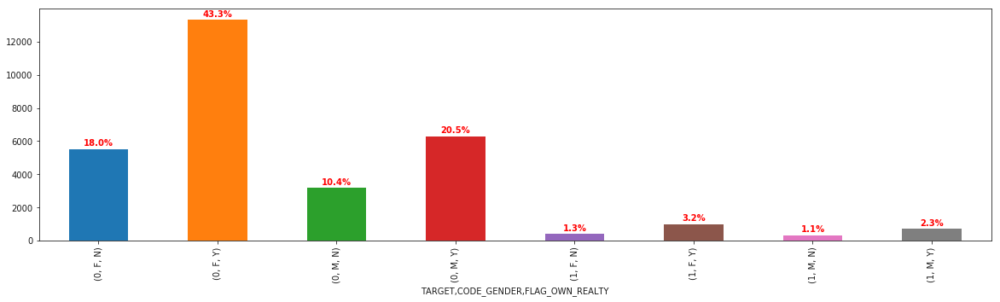

CODE_GENDER  VS  CNT_CHILDREN  VS TARGET


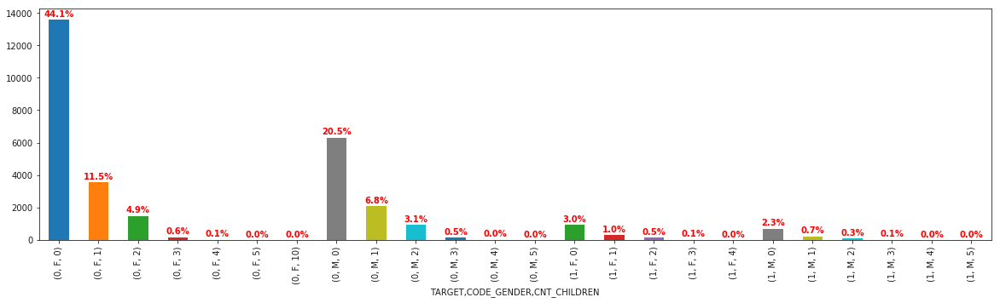

CODE_GENDER  VS  NAME_INCOME_TYPE  VS TARGET


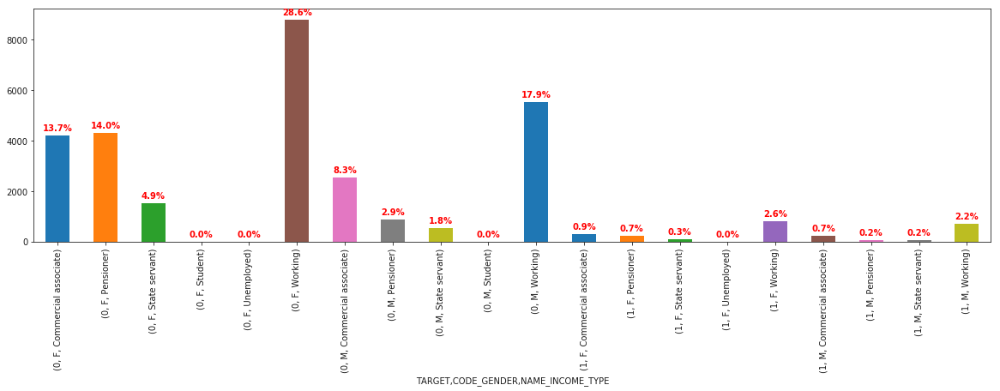

CODE_GENDER  VS  NAME_EDUCATION_TYPE  VS TARGET


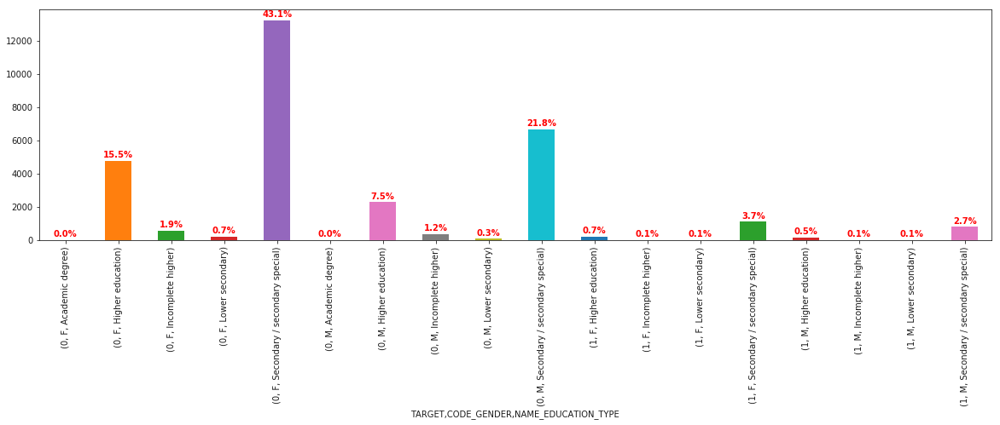

CODE_GENDER  VS  NAME_FAMILY_STATUS  VS TARGET


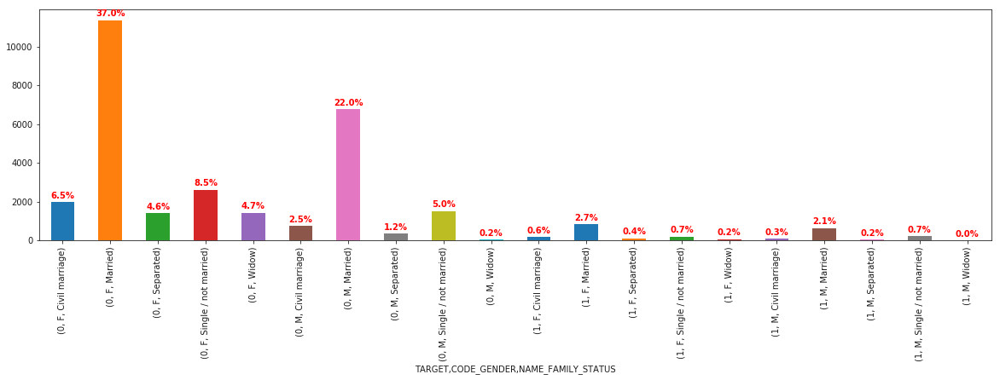

CODE_GENDER  VS  NAME_HOUSING_TYPE  VS TARGET


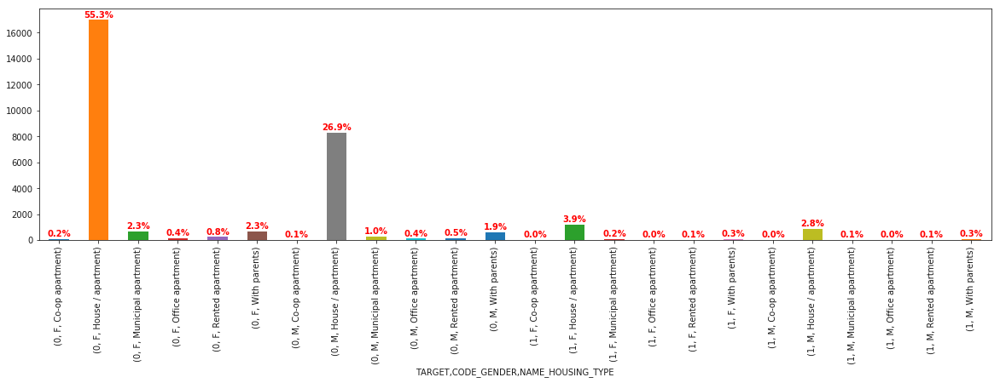

CODE_GENDER  VS  CNT_FAM_MEMBERS  VS TARGET


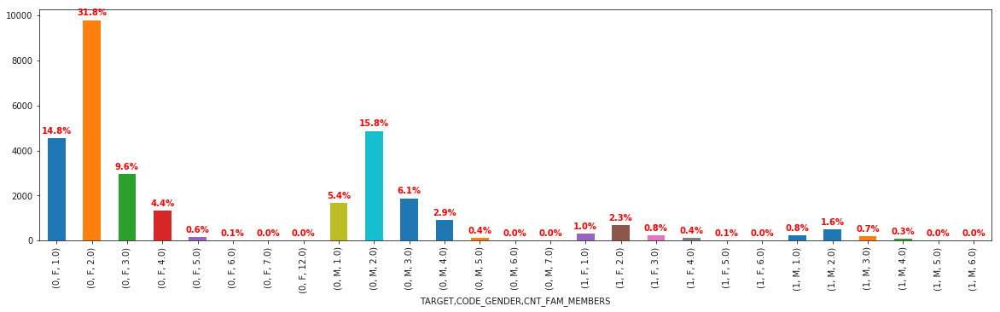

In [29]:
# Feature relationship with important categorical feats
for i in imp_cat_feats:
    if i != feature :
        print(feature," VS ",i, " VS TARGET")
        width=.5
        plt.figure(figsize=(20,5))
        g = x_df.groupby(by = ['TARGET',feature,i])
        vc = g.SK_ID_CURR.count()
        ax = vc.plot.bar(width=width)
        
        for v,c in enumerate(vc):
            ax.text(v, 
                    c+200, 
                    '{}%'.format(round((c/x_df.shape[0])*100,1)), 
                    color='red', 
                    fontweight='bold',
                    horizontalalignment='center')
        plt.show()

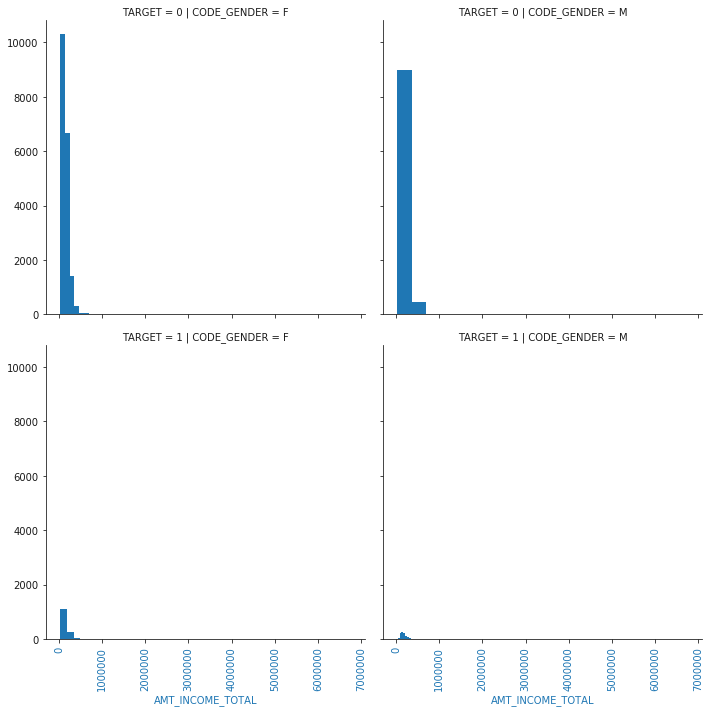

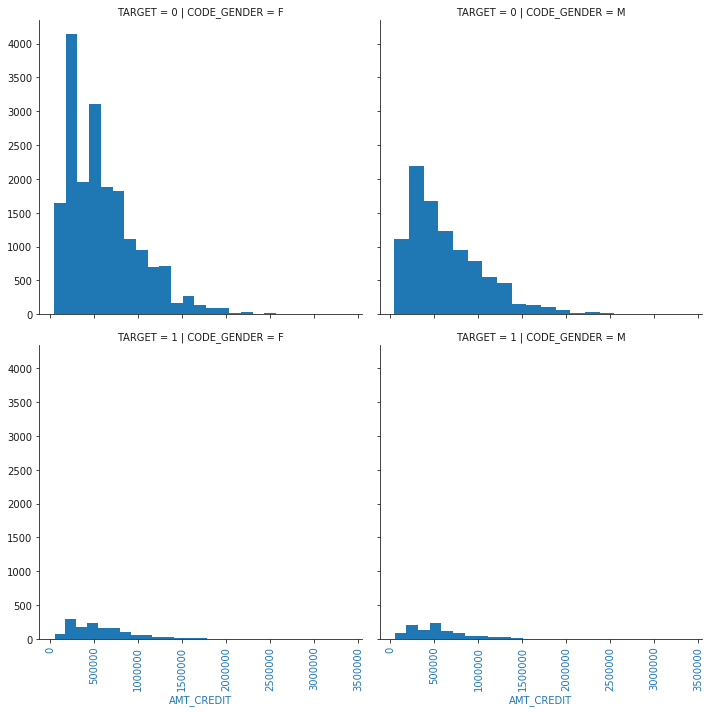

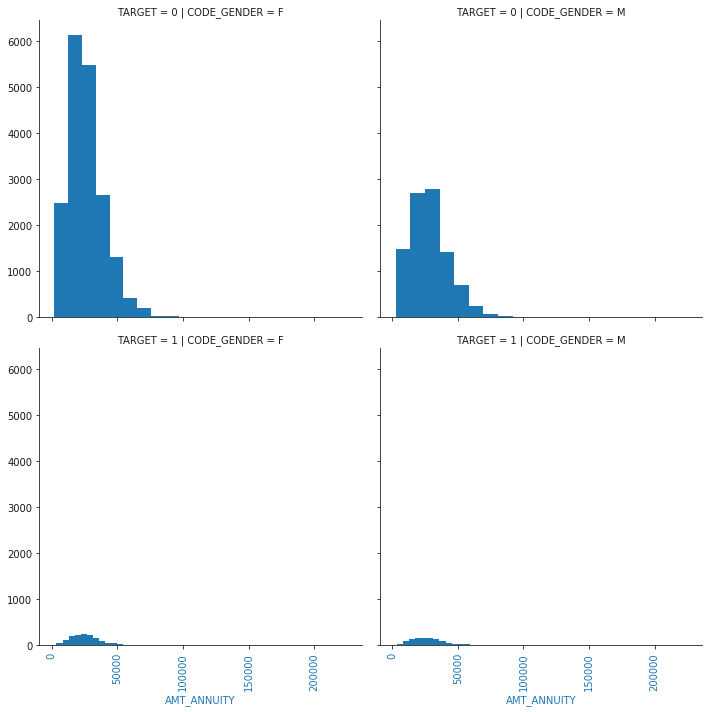

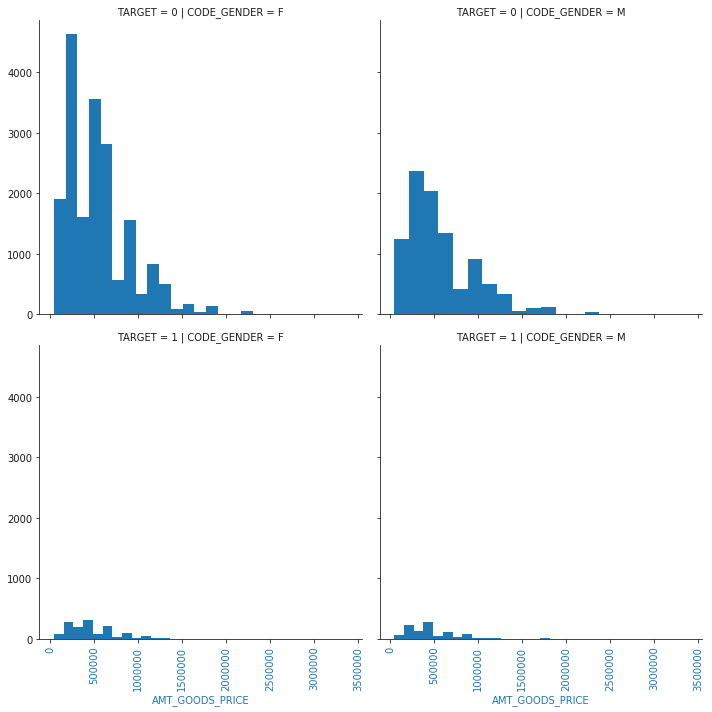

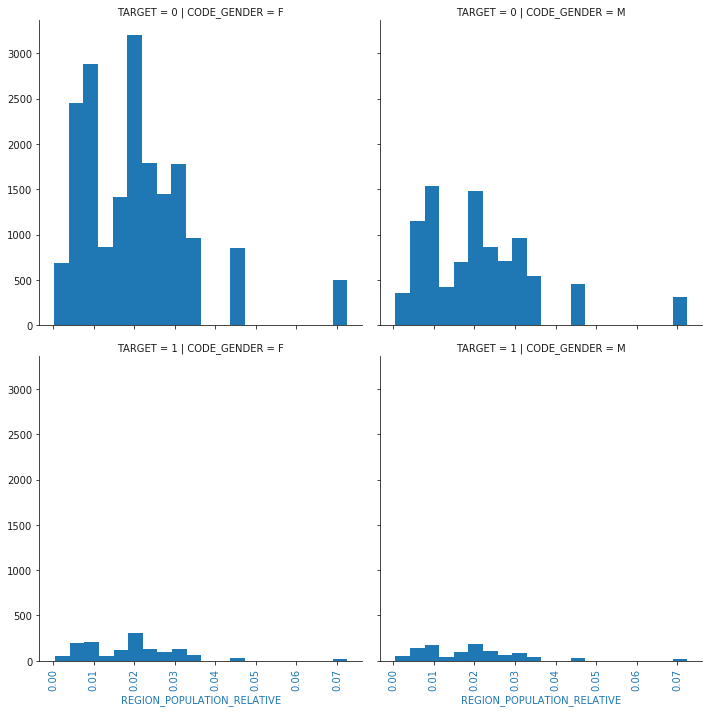

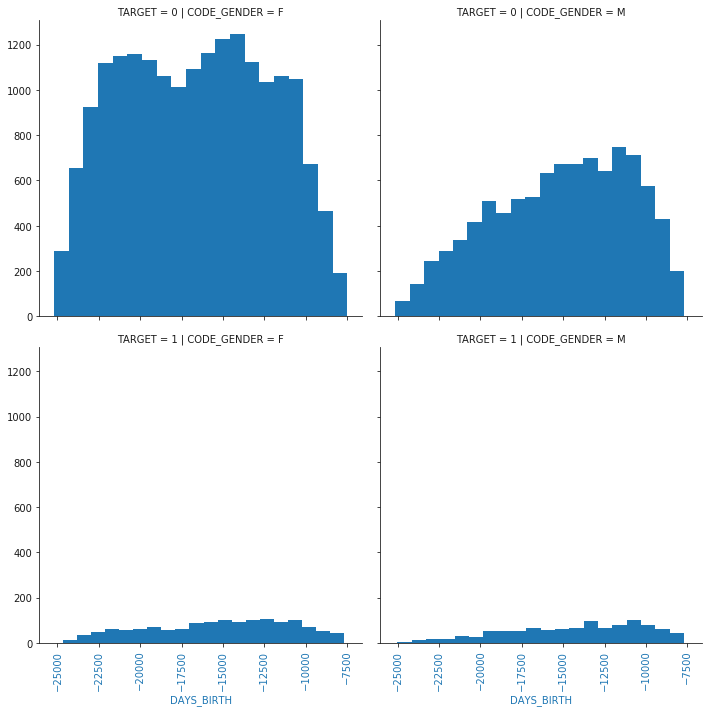

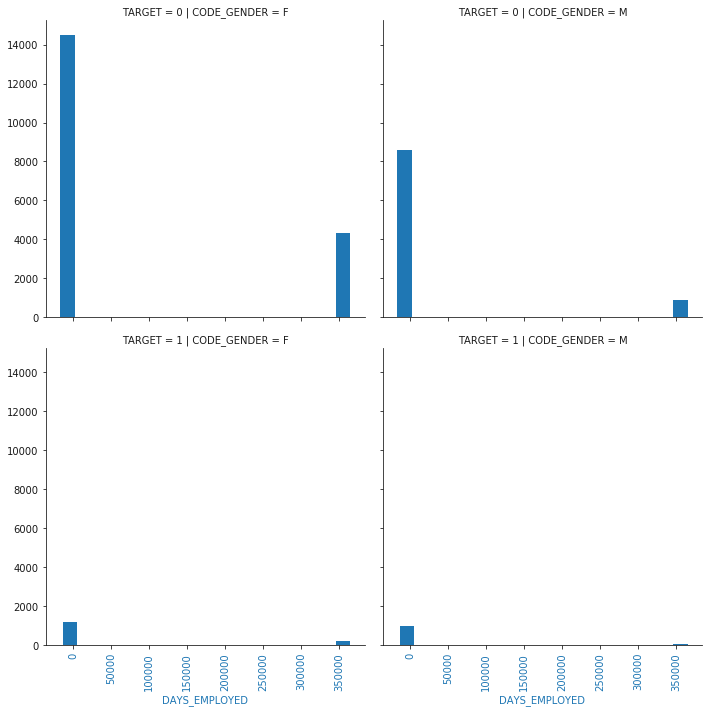

In [30]:
# Feature relationship with important numerical feats

from itertools import cycle, islice
for i in imp_num_feats:
    g = sns.FacetGrid(x_df, row="TARGET",  col=feature,size=5)
    g = g.map(plt.hist, i,bins=20)
    g.map(plt.xticks, rotation=90)
    g.map(plt.xlabel,i)

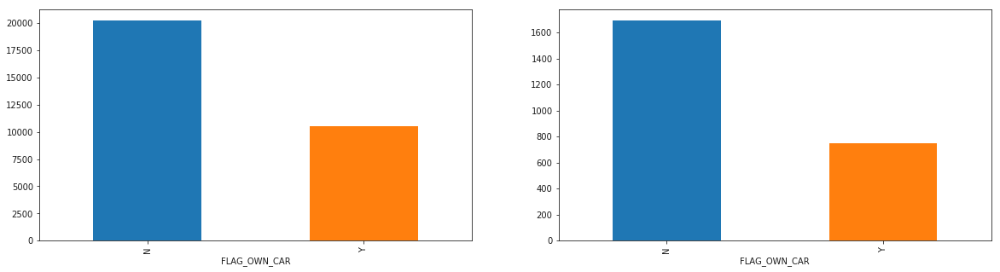

In [31]:
feature = 'FLAG_OWN_CAR'
plt.figure(figsize=(20,5))
plt.subplot2grid((1,2),(0,0),rowspan=1,colspan=1)
x_df.groupby(feature).SK_ID_CURR.count().plot.bar()
plt.subplot2grid((1,2),(0,1),rowspan=1,colspan=1)
x_df[x_df['TARGET']==1].groupby(feature).SK_ID_CURR.count().plot.bar()
plt.show()

In [32]:
corr_thres = .1


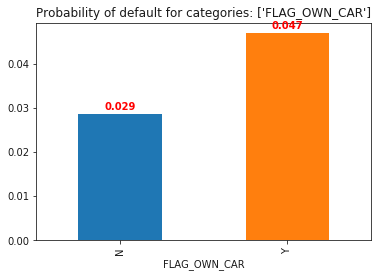

In [33]:
# Default ratio for the feature
lst = []
lst.append(feature)
f.default_ratio(x_df,['TARGET'],1,0,lst,.001)

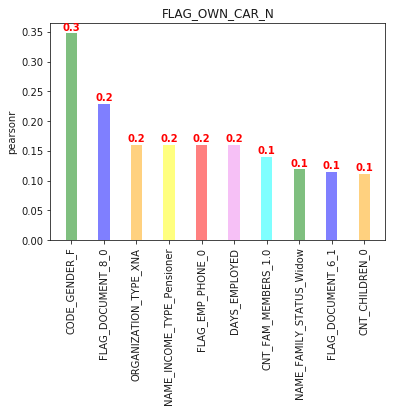

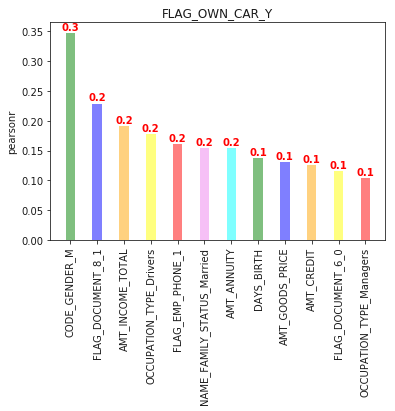

In [34]:
# Higher Correlations of all categories of feature with all other features

categories = x_corr.filter(like=feature,axis=0).index.tolist()

rng = np.arange(len(categories))
for i in categories:
    
    val= x_corr[i].sort_values(ascending=False)
    val = val[val.where((val>corr_thres) & (val!=1))>0]
    
    y_pos = np.arange(len(val.index))
    width = 0.35

    abc, ax1 = plt.subplots()
    rects1 = ax1.bar(y_pos-width/2, val, width, align='center', alpha=0.5,label=i,color = color_list)
    for v,c in enumerate(val):
        ax1.text(v-width/2, 
                c+.005, 
                round(c,1), 
                color='red', 
                fontweight='bold',
                horizontalalignment='center')
    
    ax1.set_ylabel('pearsonr')
    ax1.set_title(i)
    plt.xticks(rotation='vertical')
    ax1.set_xticks(y_pos-width/2)
    ax1.set_xticklabels(val.index)

TARGET VS FLAG_OWN_CAR  VS  NAME_CONTRACT_TYPE


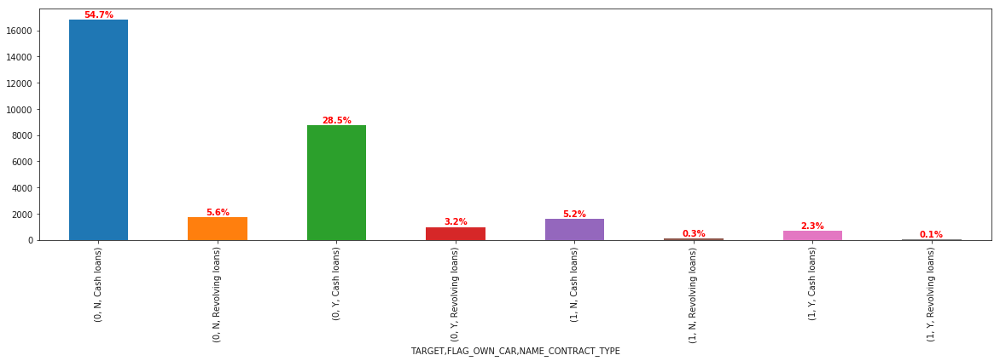

TARGET VS FLAG_OWN_CAR  VS  CODE_GENDER


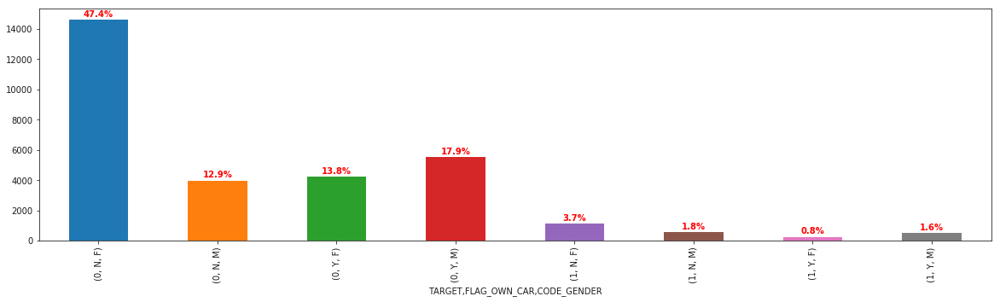

TARGET VS FLAG_OWN_CAR  VS  FLAG_OWN_REALTY


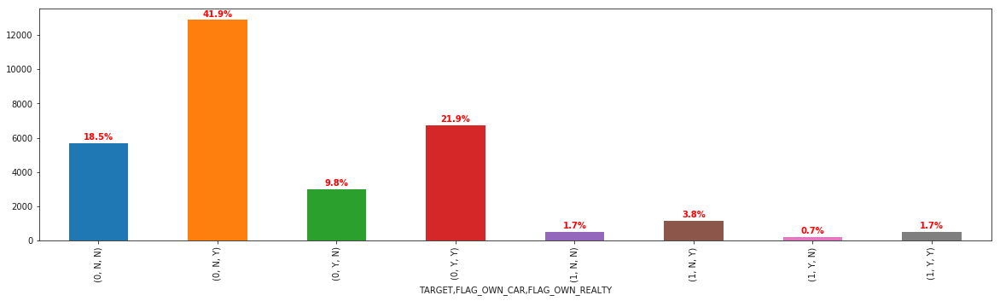

TARGET VS FLAG_OWN_CAR  VS  CNT_CHILDREN


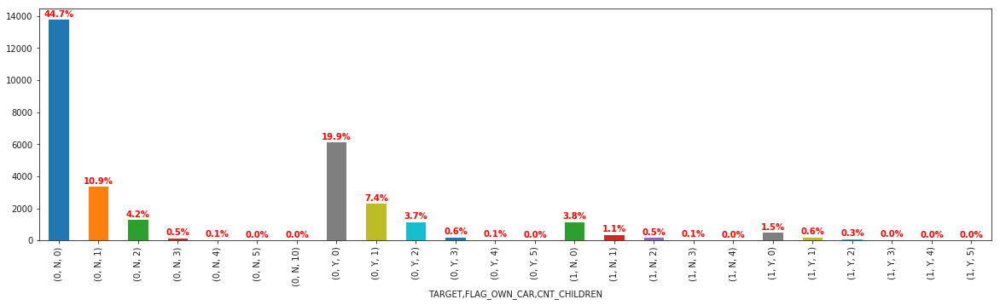

TARGET VS FLAG_OWN_CAR  VS  NAME_INCOME_TYPE


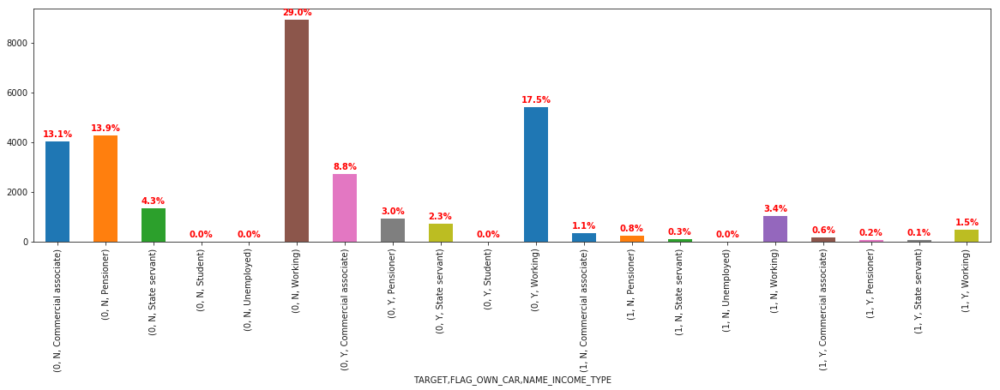

TARGET VS FLAG_OWN_CAR  VS  NAME_EDUCATION_TYPE


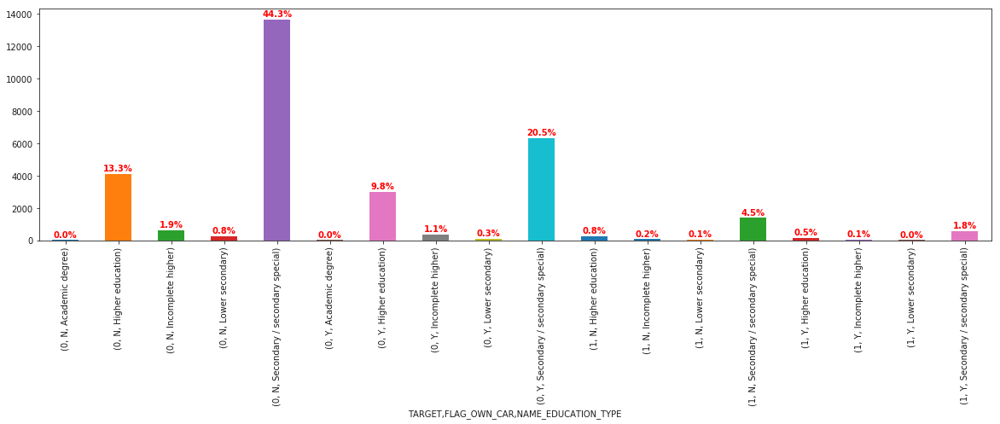

TARGET VS FLAG_OWN_CAR  VS  NAME_FAMILY_STATUS


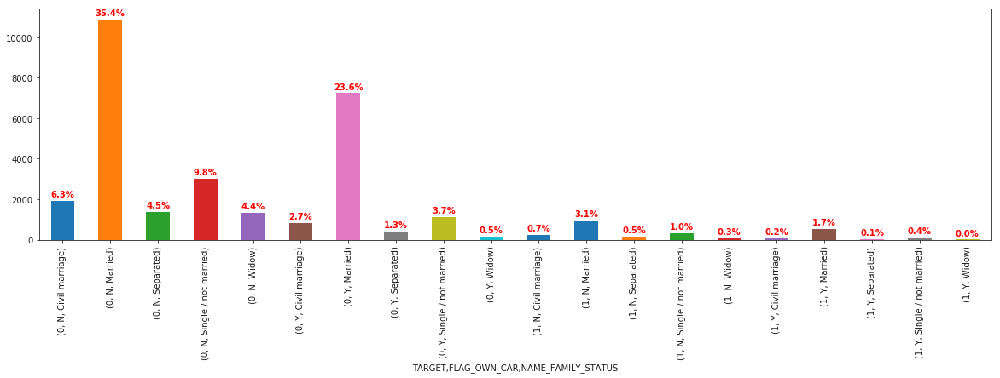

TARGET VS FLAG_OWN_CAR  VS  NAME_HOUSING_TYPE


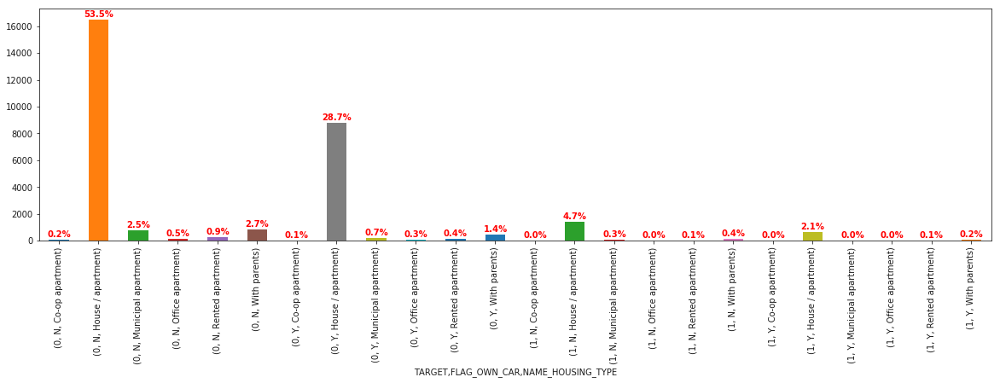

TARGET VS FLAG_OWN_CAR  VS  CNT_FAM_MEMBERS


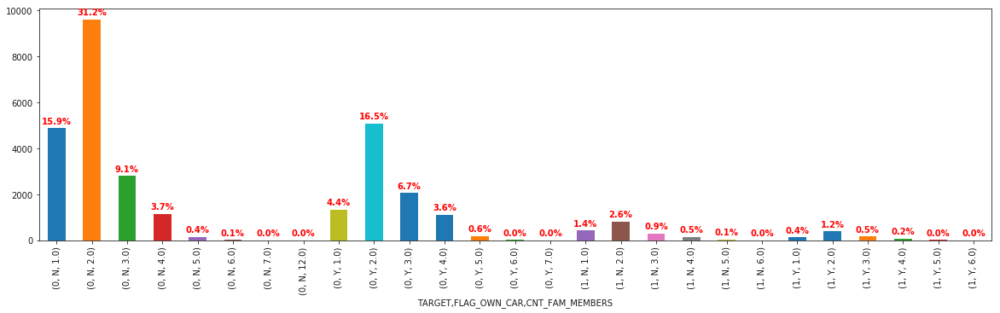

In [35]:
# Feature relationship with important categorical feats
for i in imp_cat_feats:
    if i != feature :
        print('TARGET VS',feature,' VS ',i)
        width=.5
        plt.figure(figsize=(20,5))
        g = x_df.groupby(by = ['TARGET',feature,i])
        vc = g.SK_ID_CURR.count()
        ax = vc.plot.bar(width=width)
        
        for v,c in enumerate(vc):
            ax.text(v, 
                    c+200, 
                    '{}%'.format(round((c/x_df.shape[0])*100,1)), 
                    color='red', 
                    fontweight='bold',
                    horizontalalignment='center')
        plt.show()

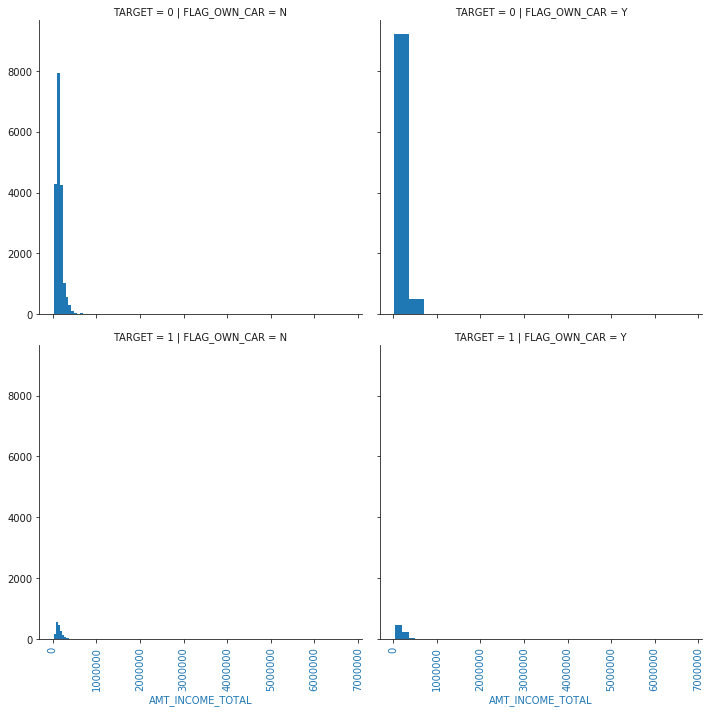

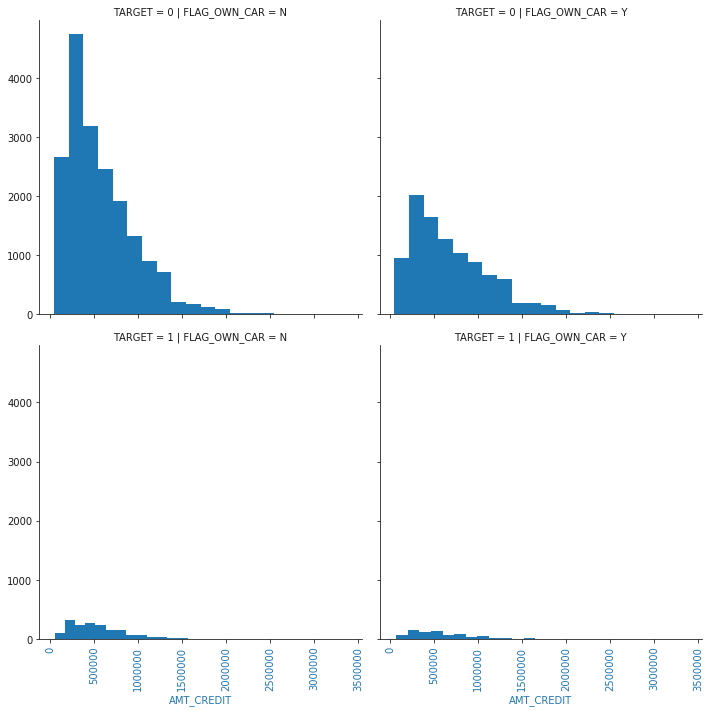

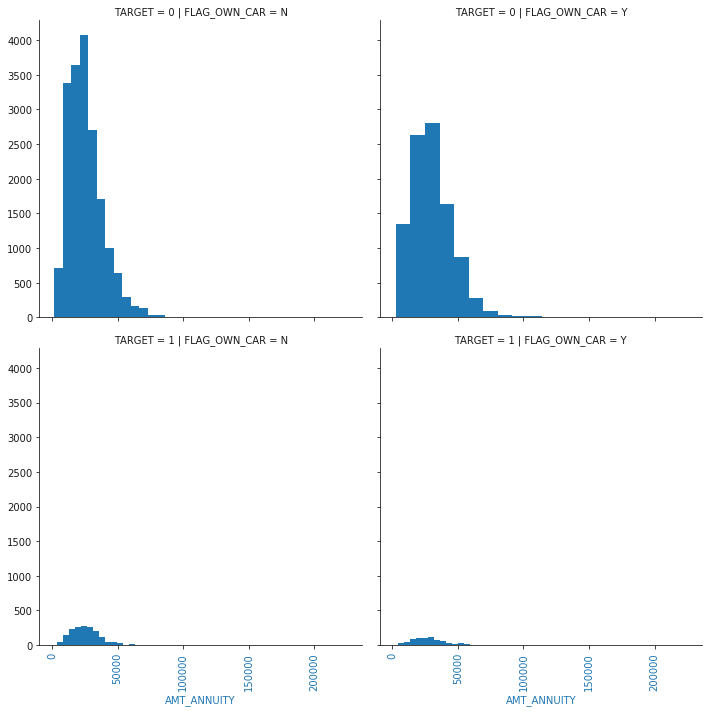

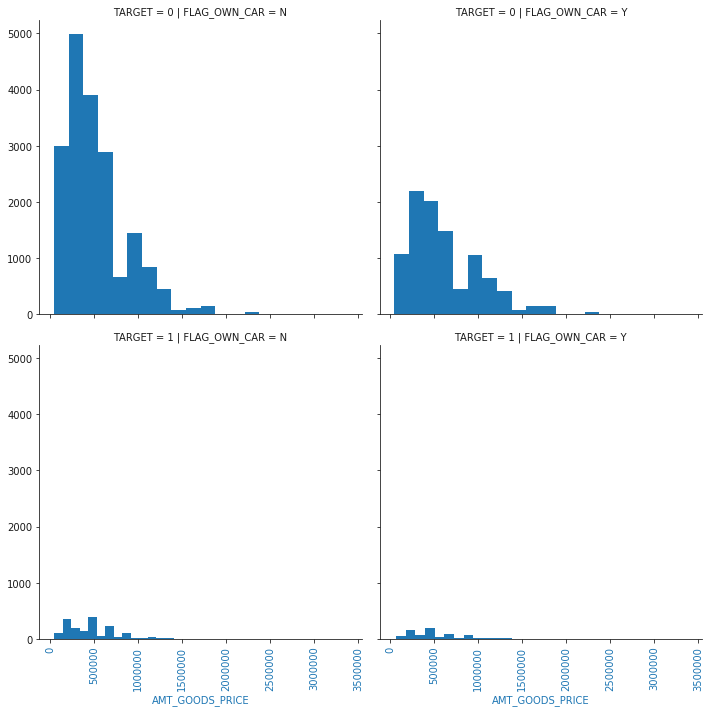

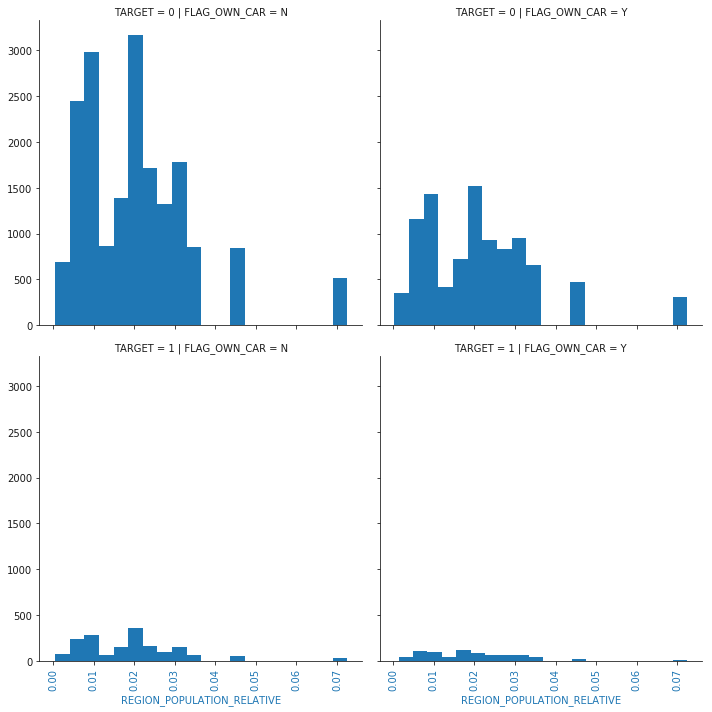

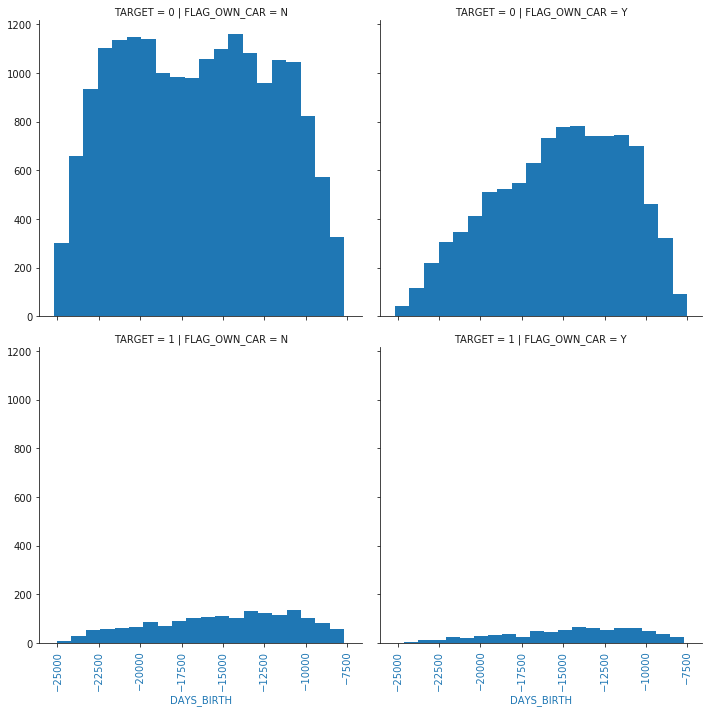

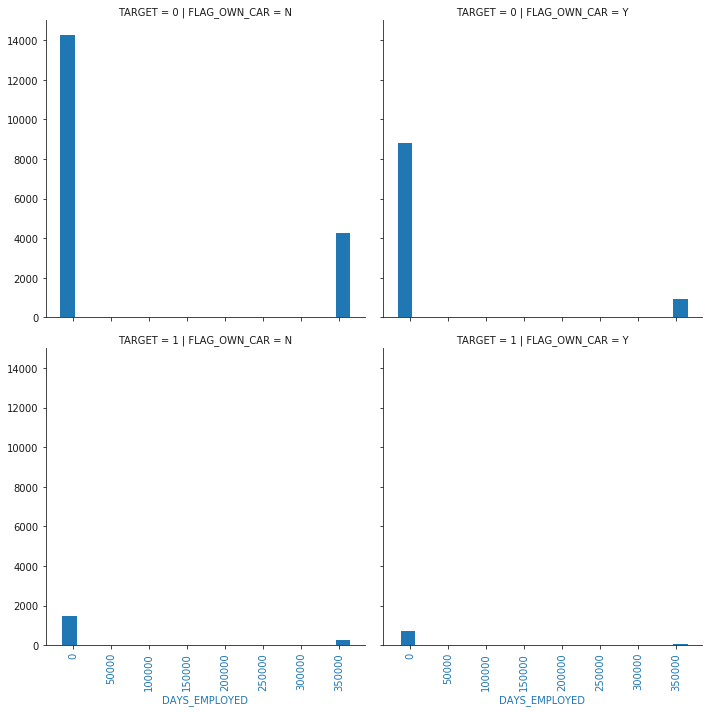

In [36]:
# Feature relationship with important numerical feats

from itertools import cycle, islice
for i in imp_num_feats:
    g = sns.FacetGrid(x_df, row="TARGET",  col=feature,size=5)
    g = g.map(plt.hist, i,bins=20)
    g.map(plt.xticks, rotation=90)
    g.map(plt.xlabel,i)

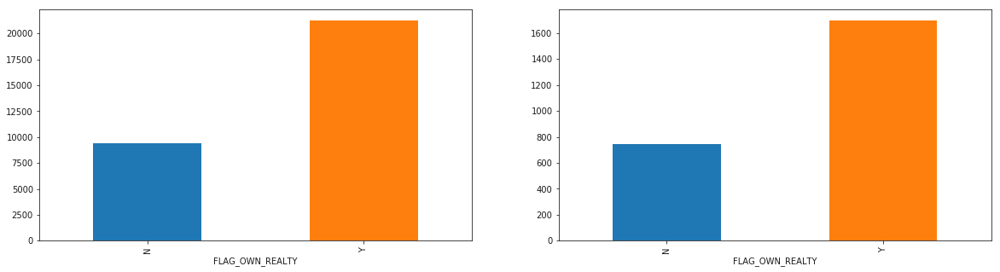

In [37]:
feature = 'FLAG_OWN_REALTY'
plt.figure(figsize=(20,5))
plt.subplot2grid((1,2),(0,0),rowspan=1,colspan=1)
x_df.groupby(feature).SK_ID_CURR.count().plot.bar()
plt.subplot2grid((1,2),(0,1),rowspan=1,colspan=1)
x_df[x_df['TARGET']==1].groupby(feature).SK_ID_CURR.count().plot.bar()
plt.show()

In [38]:
corr_thres = .1

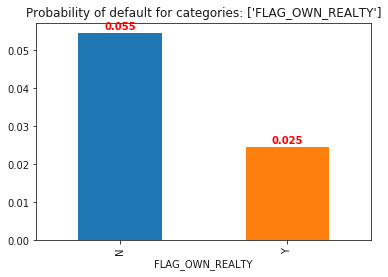

In [39]:
# Default ratio for the feature
lst = []
lst.append(feature)
f.default_ratio(x_df,['TARGET'],1,0,lst,.001)

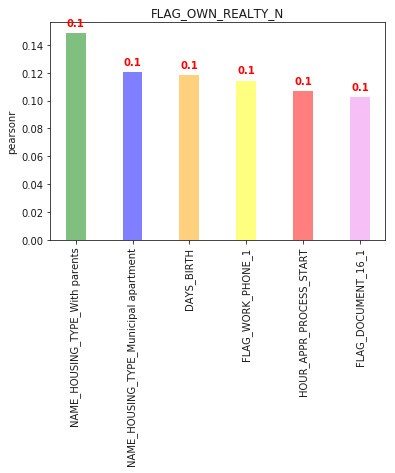

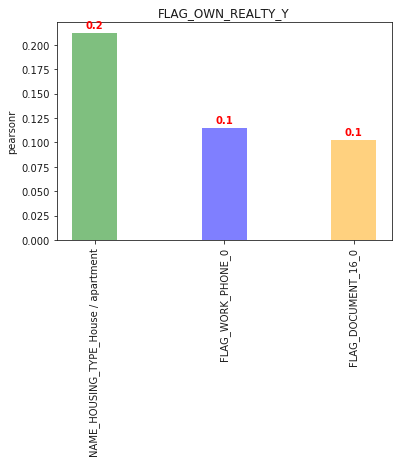

In [40]:
# Higher Correlations of all categories of feature with all other features

categories = x_corr.filter(like=feature,axis=0).index.tolist()

rng = np.arange(len(categories))
for i in categories:
    
    val= x_corr[i].sort_values(ascending=False)
    val = val[val.where((val>corr_thres) & (val!=1))>0]
    
    y_pos = np.arange(len(val.index))
    width = 0.35

    abc, ax1 = plt.subplots()
    rects1 = ax1.bar(y_pos-width/2, val, width, align='center', alpha=0.5,label=i,color = color_list)
    for v,c in enumerate(val):
        ax1.text(v-width/2, 
                c+.005, 
                round(c,1), 
                color='red', 
                fontweight='bold',
                horizontalalignment='center')
    
    ax1.set_ylabel('pearsonr')
    ax1.set_title(i)
    plt.xticks(rotation='vertical')
    ax1.set_xticks(y_pos-width/2)
    ax1.set_xticklabels(val.index)

TARGET  VS  FLAG_OWN_REALTY  VS  NAME_CONTRACT_TYPE


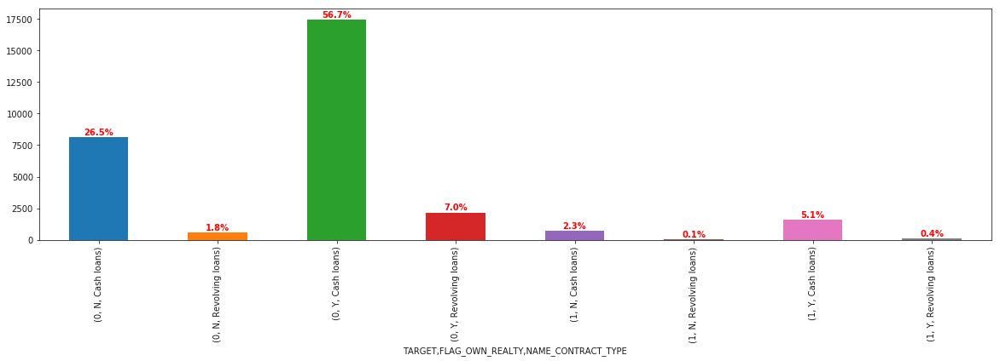

TARGET  VS  FLAG_OWN_REALTY  VS  CODE_GENDER


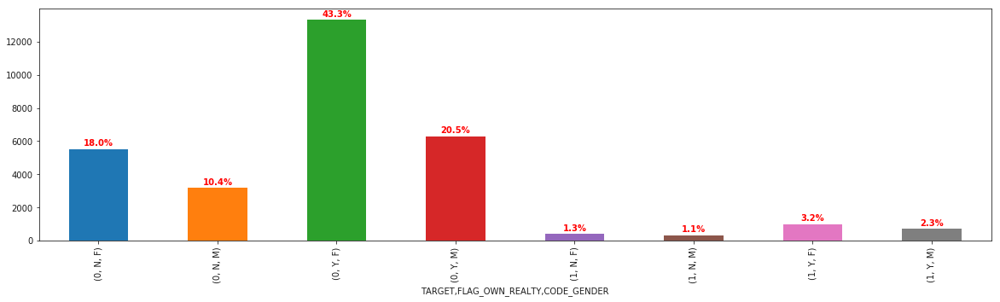

TARGET  VS  FLAG_OWN_REALTY  VS  FLAG_OWN_CAR


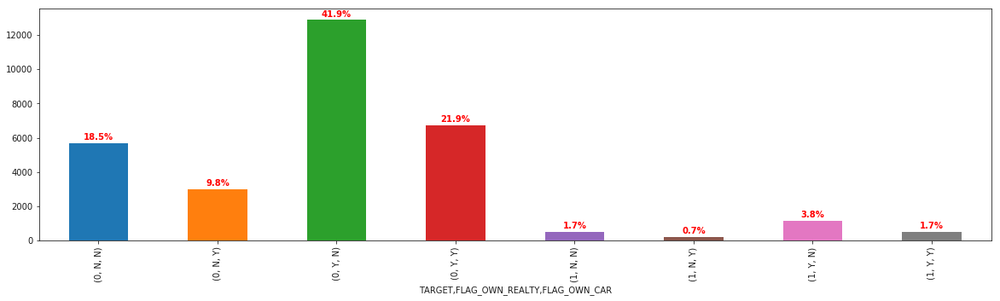

TARGET  VS  FLAG_OWN_REALTY  VS  CNT_CHILDREN


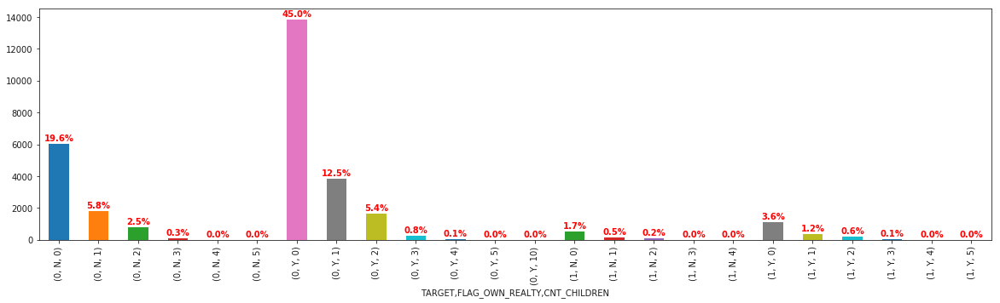

TARGET  VS  FLAG_OWN_REALTY  VS  NAME_INCOME_TYPE


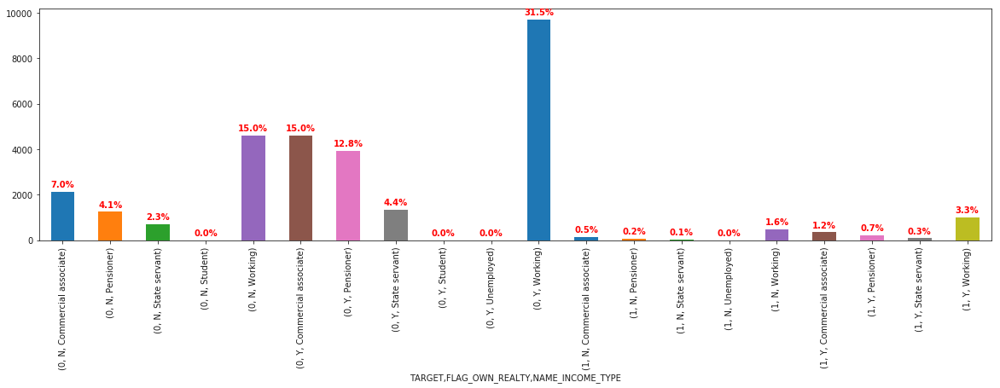

TARGET  VS  FLAG_OWN_REALTY  VS  NAME_EDUCATION_TYPE


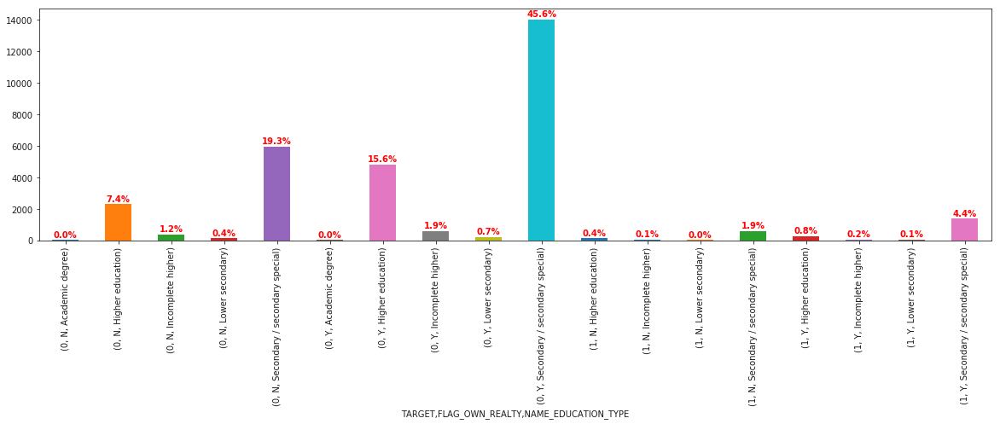

TARGET  VS  FLAG_OWN_REALTY  VS  NAME_FAMILY_STATUS


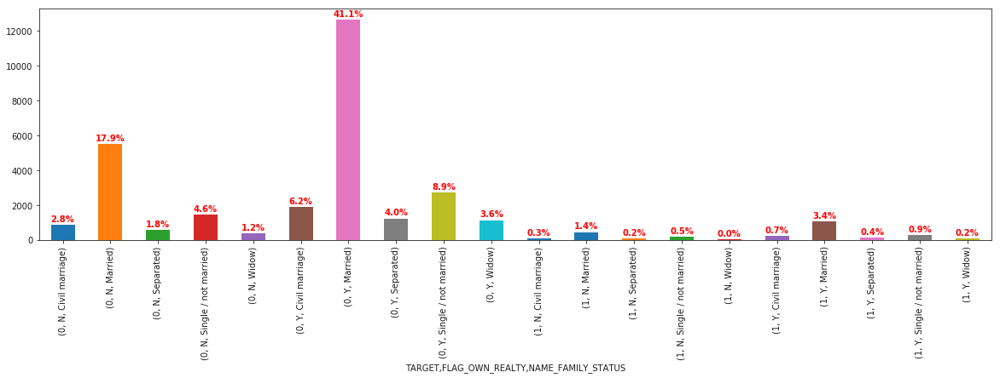

TARGET  VS  FLAG_OWN_REALTY  VS  NAME_HOUSING_TYPE


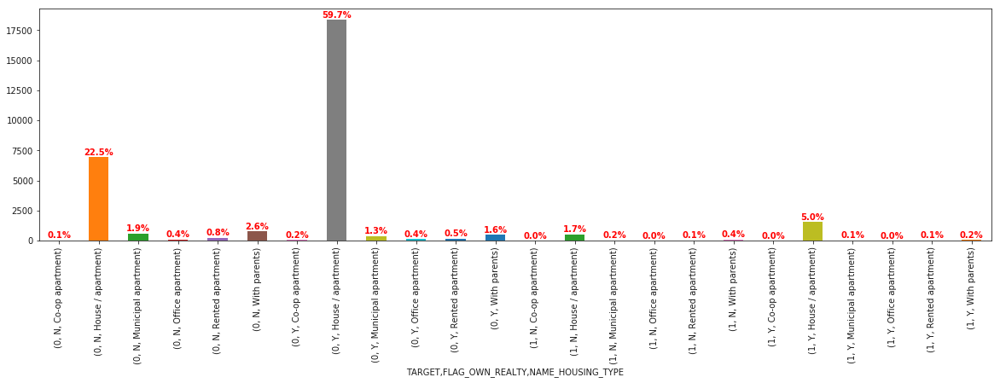

TARGET  VS  FLAG_OWN_REALTY  VS  CNT_FAM_MEMBERS


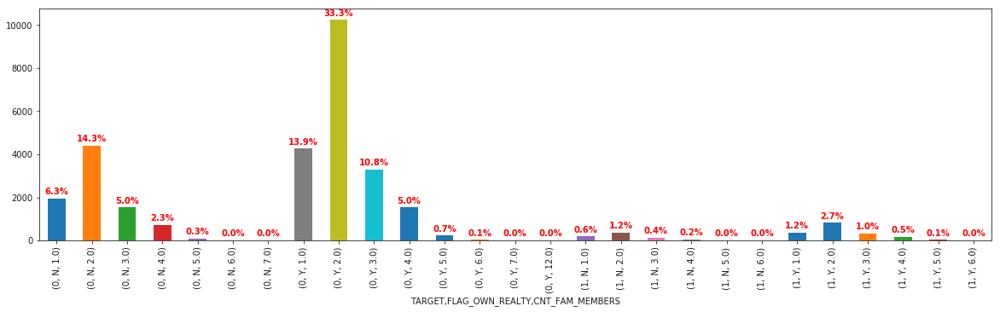

In [41]:
# Feature relationship with important categorical feats
for i in imp_cat_feats:
    if i != feature :
        print('TARGET',' VS ',feature,' VS ',i)
        width=.5
        plt.figure(figsize=(20,5))
        g = x_df.groupby(by = ['TARGET',feature,i])
        vc = g.SK_ID_CURR.count()
        ax = vc.plot.bar(width=width)
        
        for v,c in enumerate(vc):
            ax.text(v, 
                    c+200, 
                    '{}%'.format(round((c/x_df.shape[0])*100,1)), 
                    color='red', 
                    fontweight='bold',
                    horizontalalignment='center')
        plt.show()

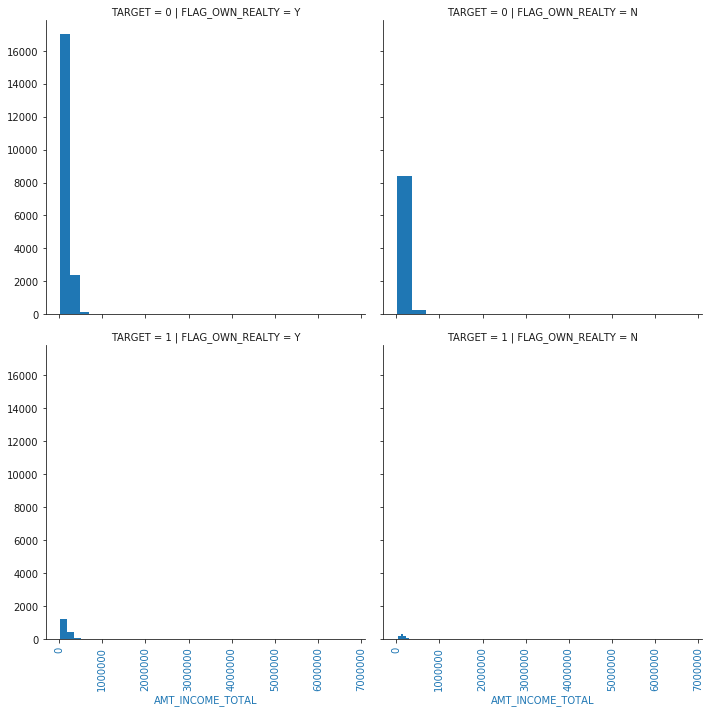

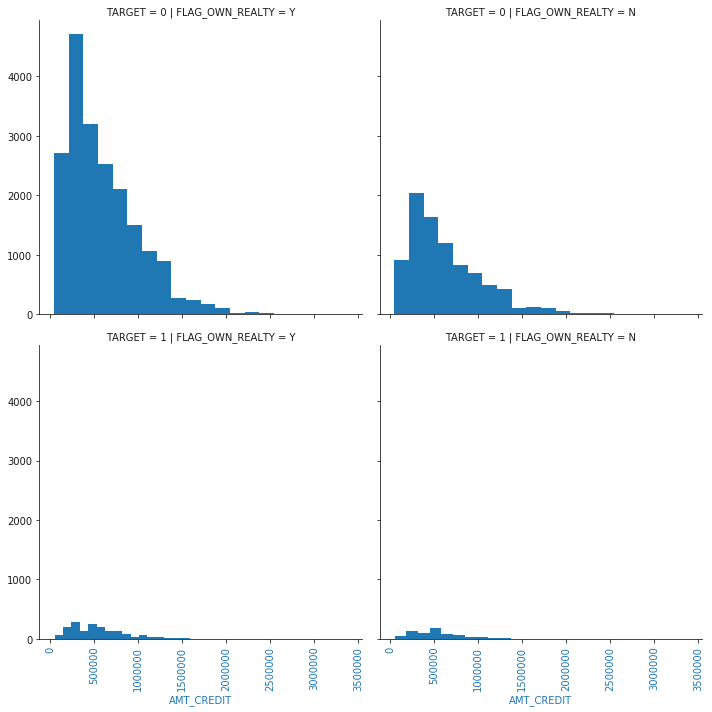

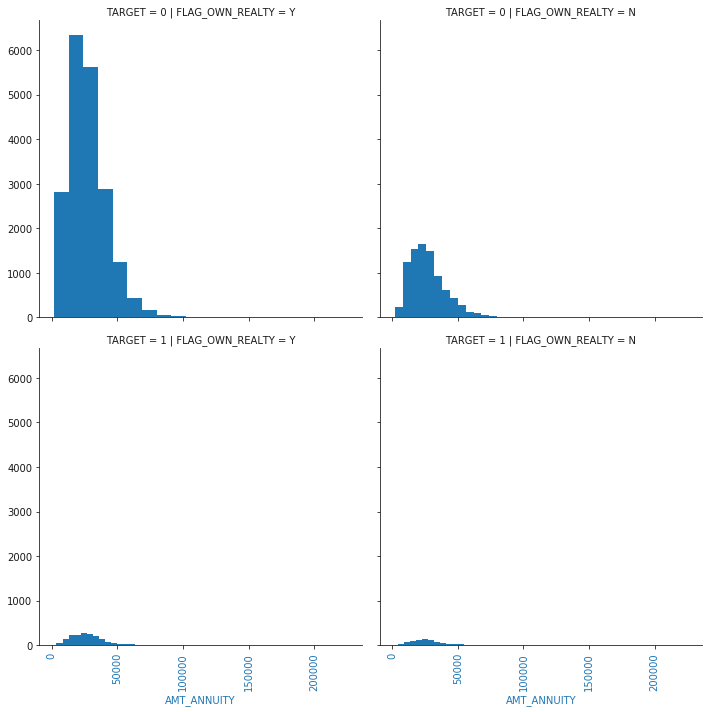

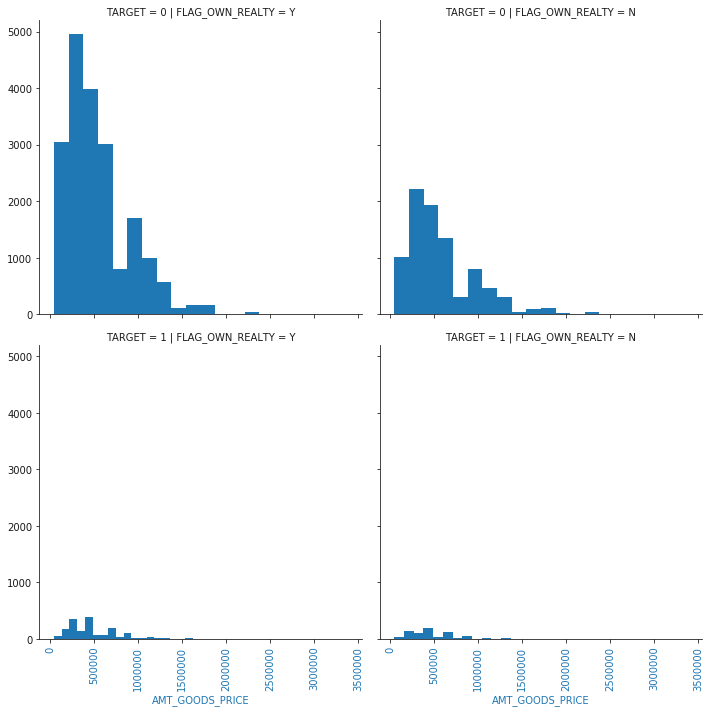

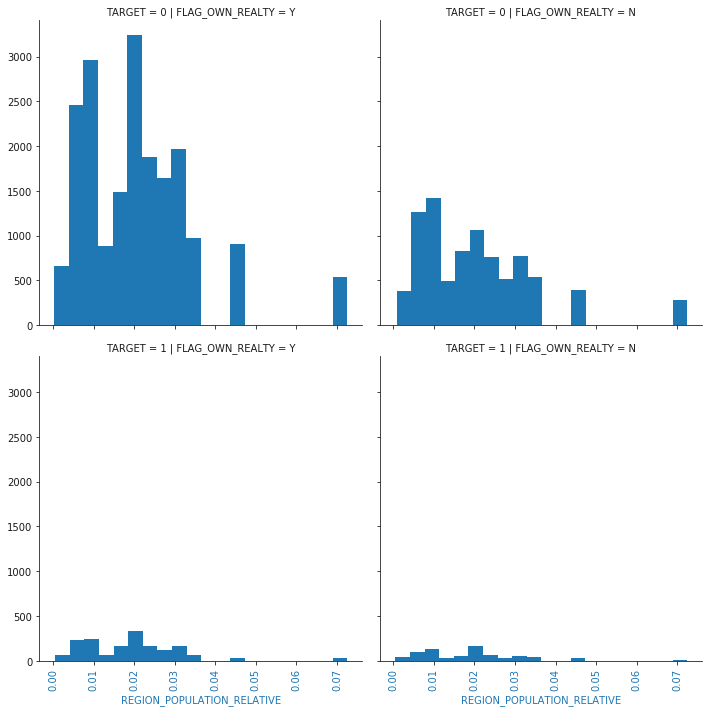

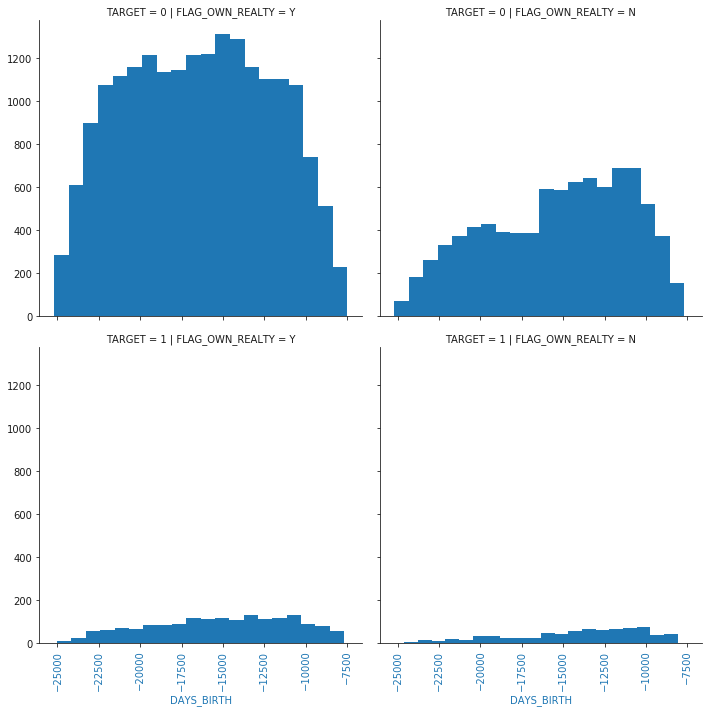

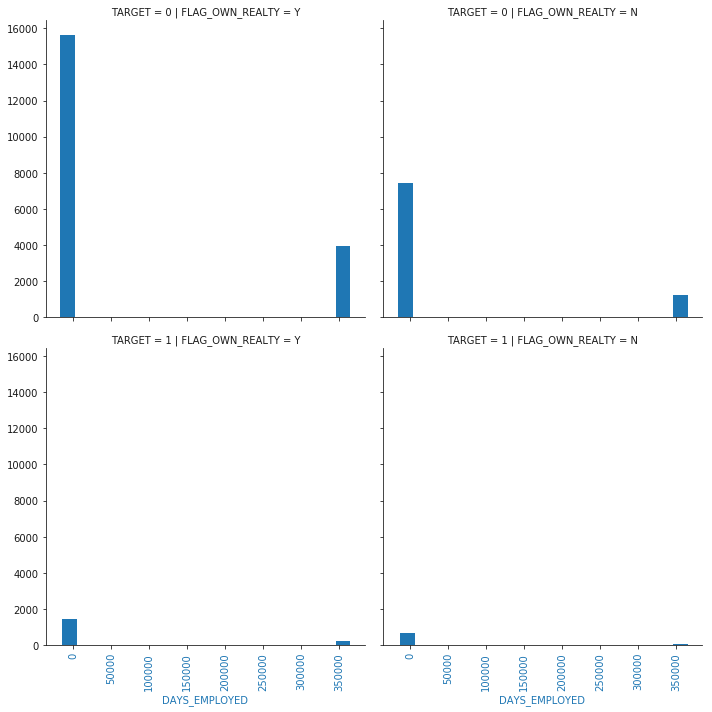

In [42]:
# Feature relationship with important numerical feats

from itertools import cycle, islice
for i in imp_num_feats:
    g = sns.FacetGrid(x_df, row="TARGET",  col=feature,size=5)
    g = g.map(plt.hist, i,bins=20)
    g.map(plt.xticks, rotation=90)
    g.map(plt.xlabel,i)

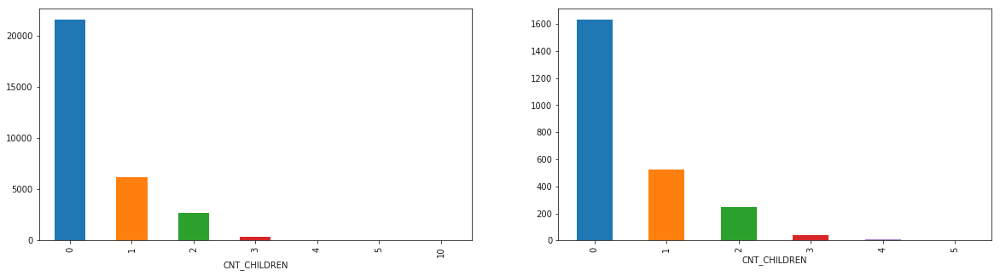

In [43]:
feature = 'CNT_CHILDREN'
plt.figure(figsize=(20,5))
plt.subplot2grid((1,2),(0,0),rowspan=1,colspan=1)
x_df.groupby(feature).SK_ID_CURR.count().plot.bar()
plt.subplot2grid((1,2),(0,1),rowspan=1,colspan=1)
x_df[x_df['TARGET']==1].groupby(feature).SK_ID_CURR.count().plot.bar()
plt.show()

In [44]:
corr_thres = .11.

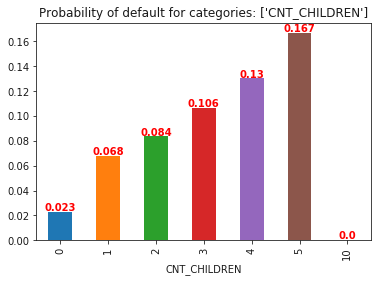

In [45]:
# Default ratio for the feature
lst = []
lst.append(feature)
f.default_ratio(x_df,['TARGET'],1,0,lst,.001)

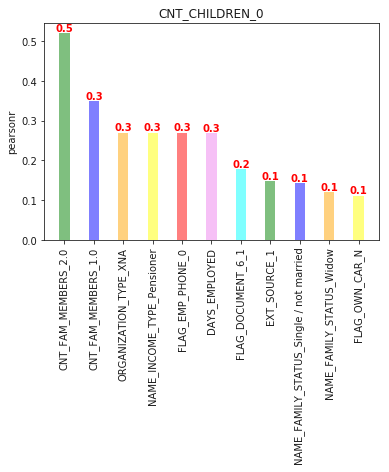

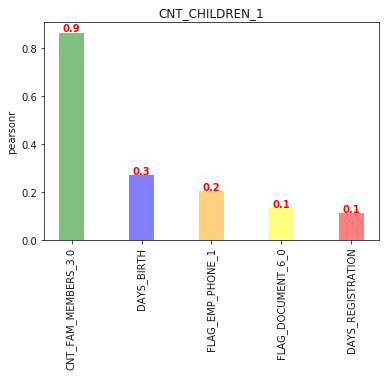

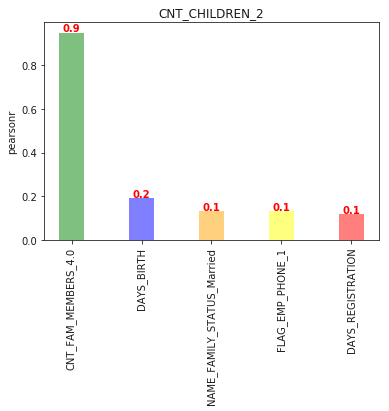

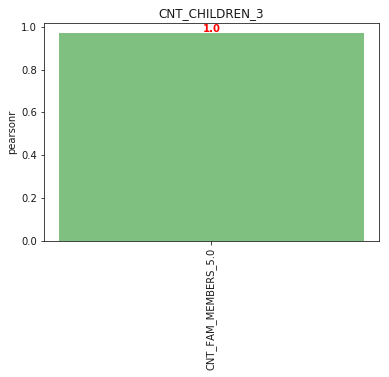

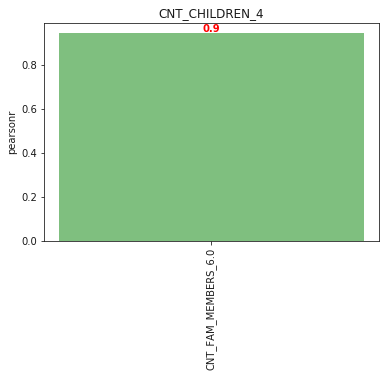

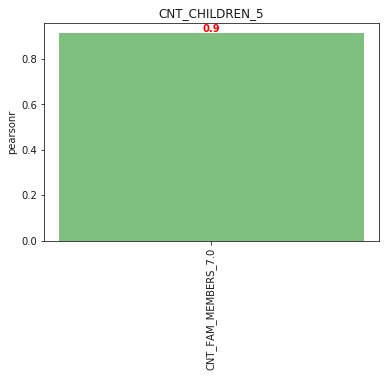

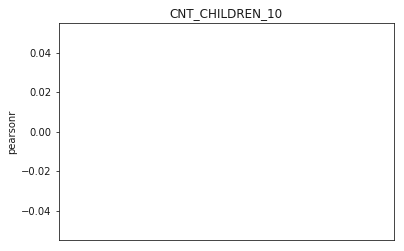

In [46]:
# Higher Correlations of all categories of feature with all other features

categories = x_corr.filter(like=feature,axis=0).index.tolist()

rng = np.arange(len(categories))
for i in categories:
    
    val= x_corr[i].sort_values(ascending=False)
    val = val[val.where((val>corr_thres) & (val!=1))>0]
    
    y_pos = np.arange(len(val.index))
    width = 0.35

    abc, ax1 = plt.subplots()
    rects1 = ax1.bar(y_pos-width/2, val, width, align='center', alpha=0.5,label=i,color = color_list)
    for v,c in enumerate(val):
        ax1.text(v-width/2, 
                c+.005, 
                round(c,1), 
                color='red', 
                fontweight='bold',
                horizontalalignment='center')
    
    ax1.set_ylabel('pearsonr')
    ax1.set_title(i)
    plt.xticks(rotation='vertical')
    ax1.set_xticks(y_pos-width/2)
    ax1.set_xticklabels(val.index)

CNT_CHILDREN  VS  NAME_CONTRACT_TYPE  VS TARGET


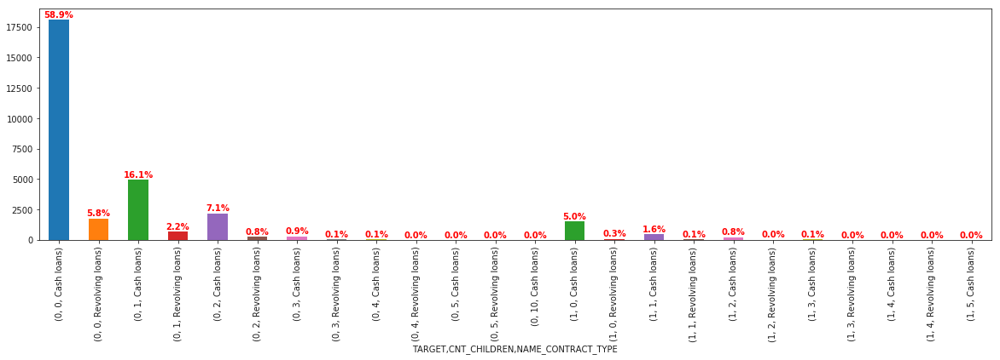

CNT_CHILDREN  VS  CODE_GENDER  VS TARGET


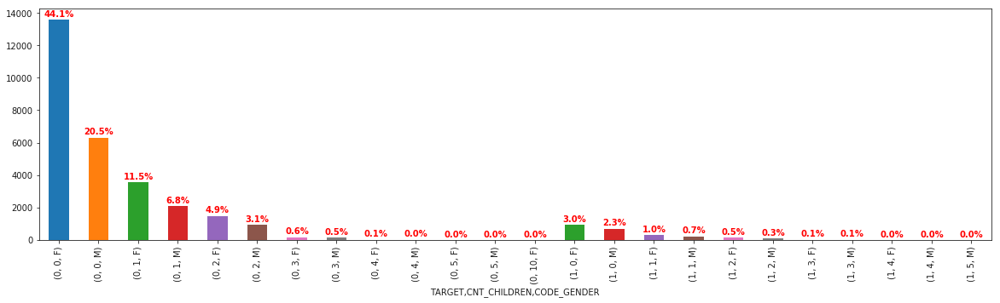

CNT_CHILDREN  VS  FLAG_OWN_CAR  VS TARGET


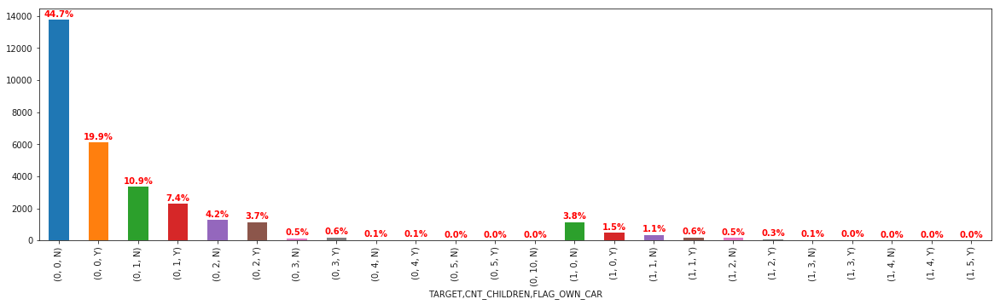

CNT_CHILDREN  VS  FLAG_OWN_REALTY  VS TARGET


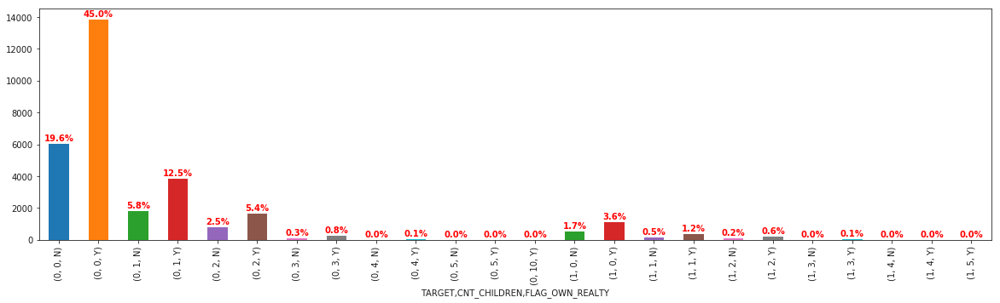

CNT_CHILDREN  VS  NAME_INCOME_TYPE  VS TARGET


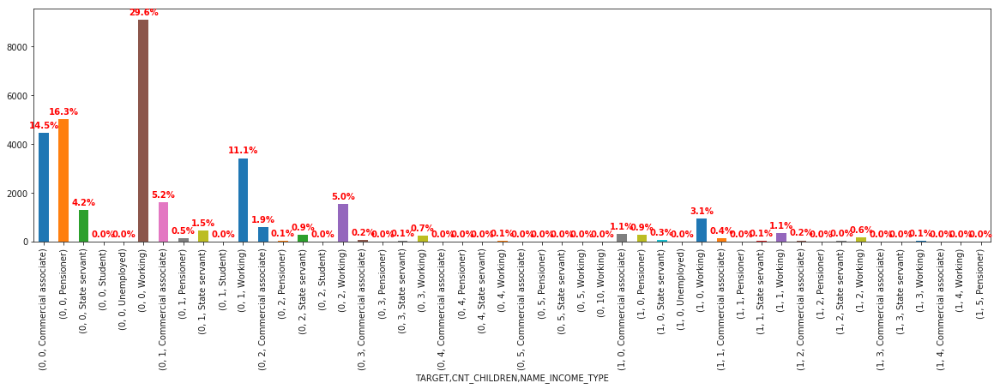

CNT_CHILDREN  VS  NAME_EDUCATION_TYPE  VS TARGET


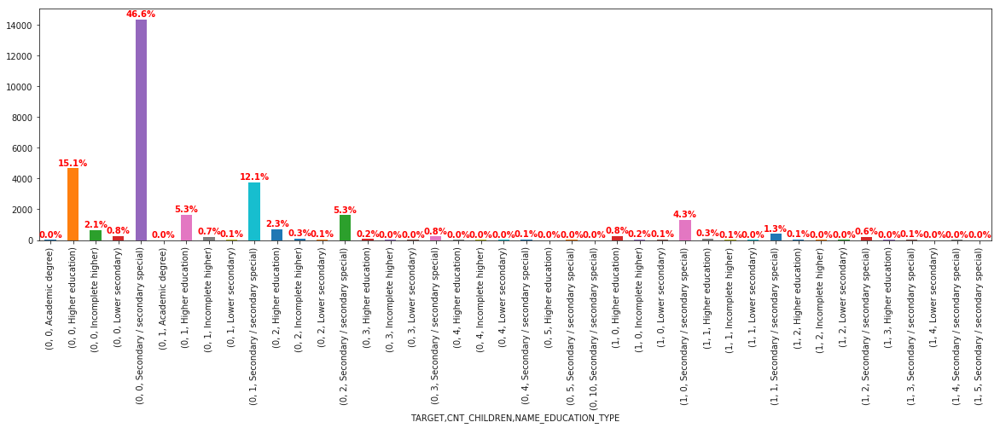

CNT_CHILDREN  VS  NAME_FAMILY_STATUS  VS TARGET


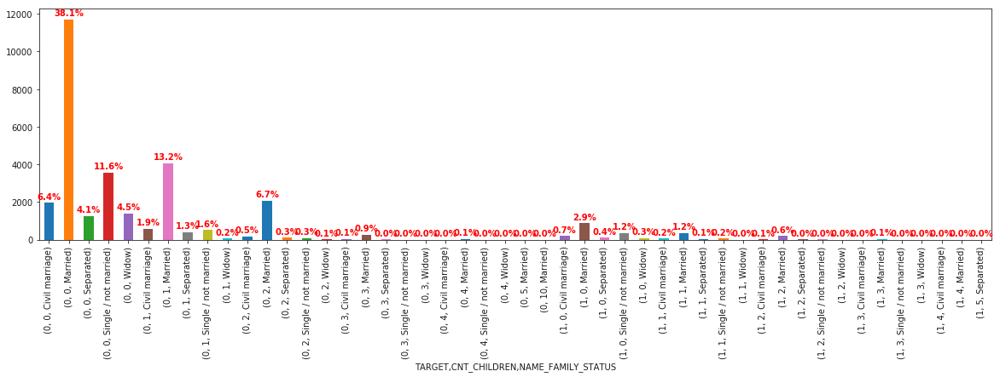

CNT_CHILDREN  VS  NAME_HOUSING_TYPE  VS TARGET


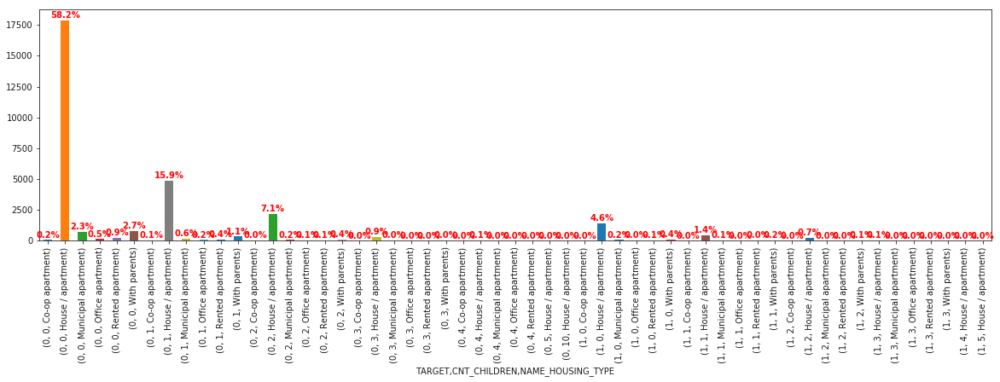

CNT_CHILDREN  VS  CNT_FAM_MEMBERS  VS TARGET


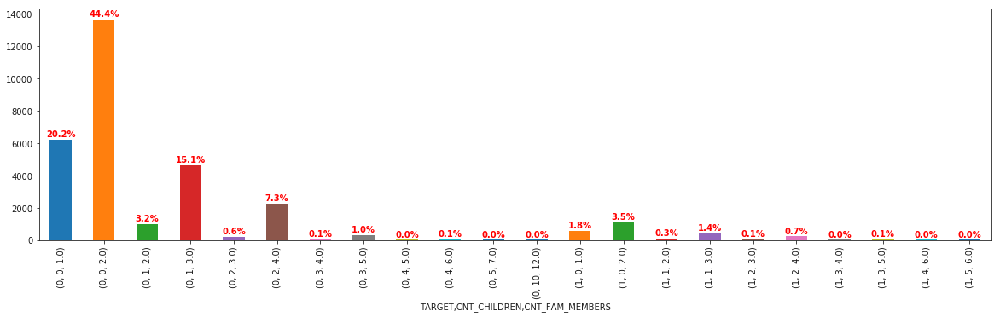

In [47]:
# Feature relationship with important categorical feats
for i in imp_cat_feats:
    if i != feature :
        print(feature," VS ",i, " VS TARGET")
        width=.5
        plt.figure(figsize=(20,5))
        g = x_df.groupby(by = ['TARGET',feature,i])
        vc = g.SK_ID_CURR.count()
        ax = vc.plot.bar(width=width)
        
        for v,c in enumerate(vc):
            ax.text(v, 
                    c+200, 
                    '{}%'.format(round((c/x_df.shape[0])*100,1)), 
                    color='red', 
                    fontweight='bold',
                    horizontalalignment='center')
        plt.show()

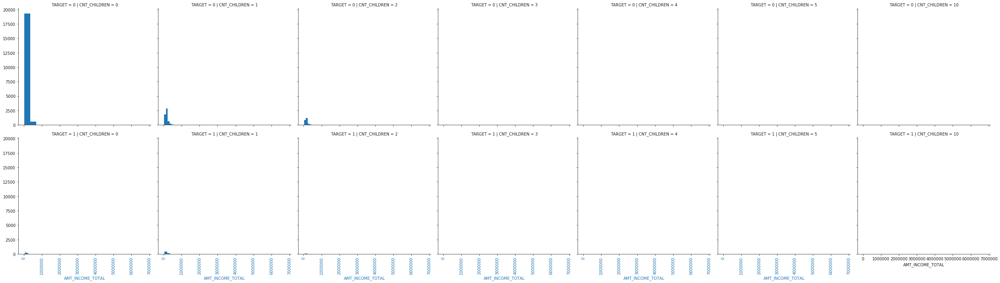

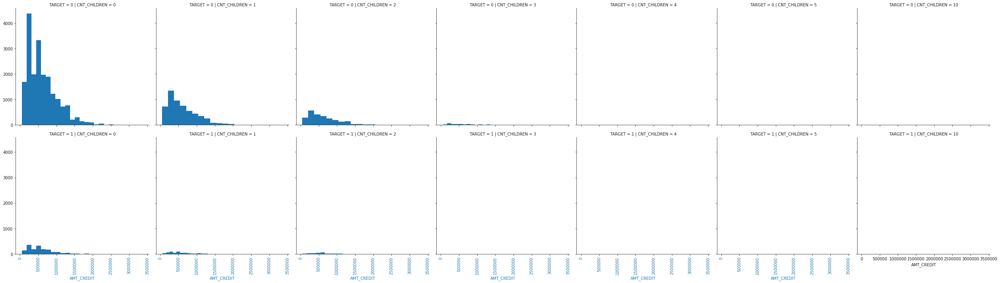

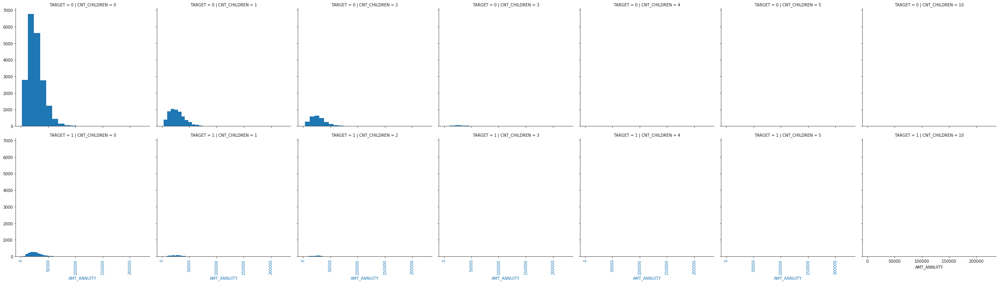

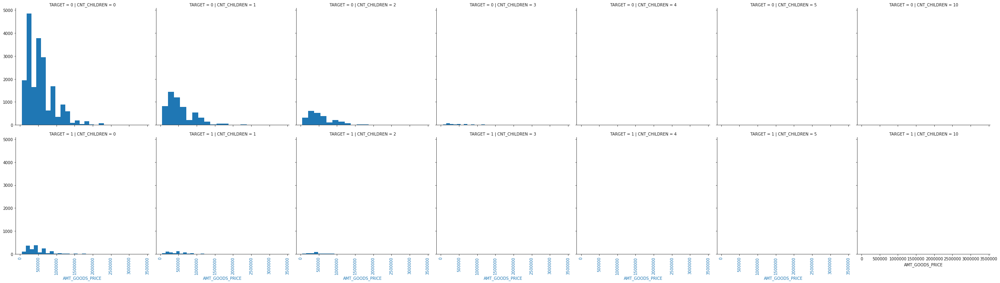

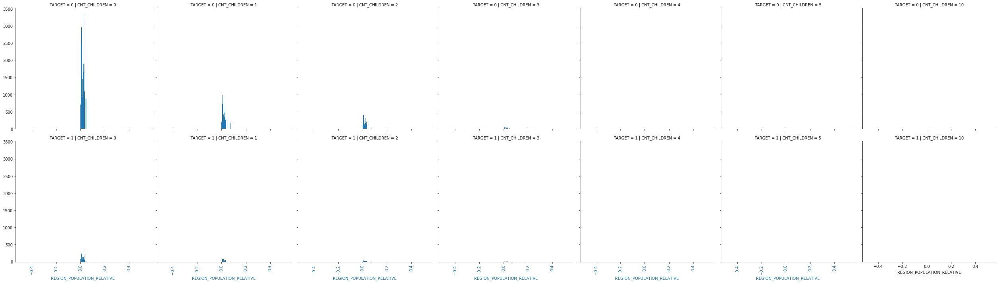

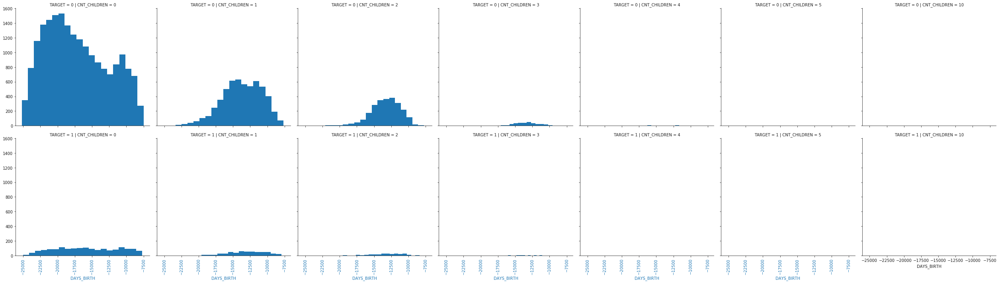

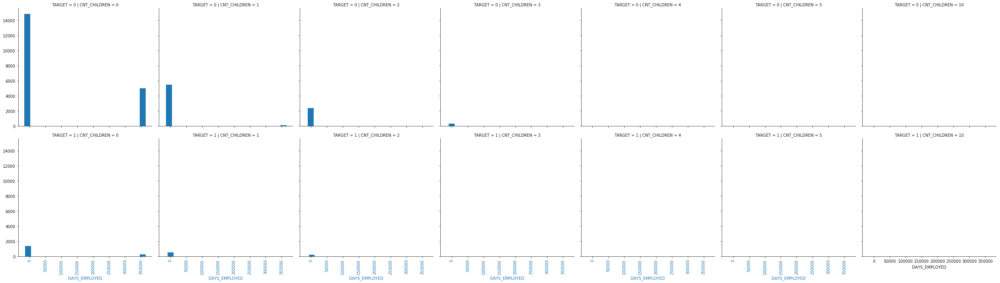

In [48]:
# Feature relationship with important numerical feats

from itertools import cycle, islice
for i in imp_num_feats:
    g = sns.FacetGrid(x_df, row="TARGET",  col=feature,size=5)
    g = g.map(plt.hist, i,bins=20)
    g.map(plt.xticks, rotation=90)
    g.map(plt.xlabel,i)

In [8]:
feature = 'AMT_INCOME_TOTAL'

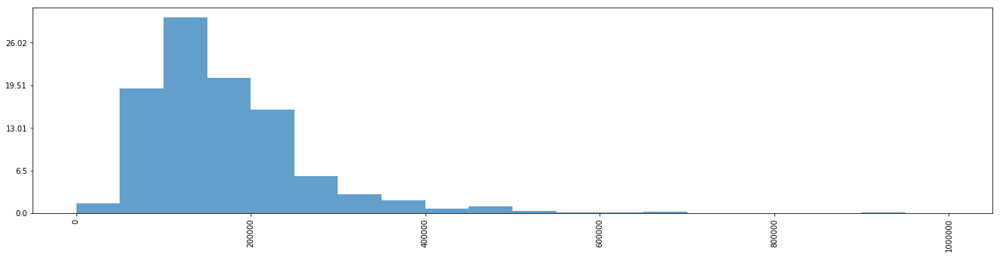

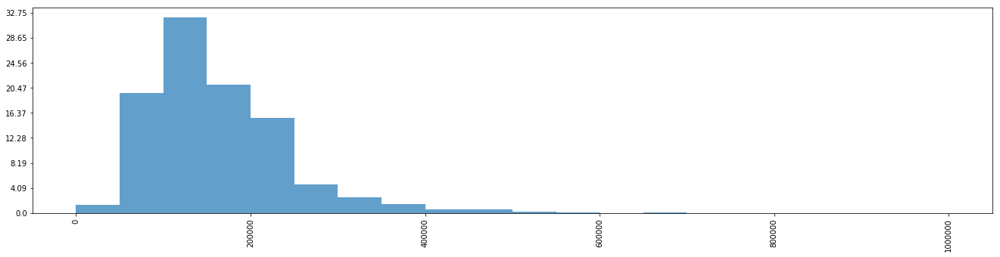

In [16]:
plt.figure(figsize=(50,5))
plt.subplot2grid((1,2),(0,0),rowspan=1,colspan=1)
#f.plot_bar_bins(x_df,feature,0,1000000,10000)
f.hist_perc(x_df,feature,20,0,1000000)
plt.show()

plt.figure(figsize=(50,5))
plt.subplot2grid((1,2),(0,1),rowspan=1,colspan=1)
f.hist_perc(x_df[x_df['TARGET']==1],feature,20,0,1000000)
plt.show()

In [17]:
# Higher Correlations of all categories of feature with all other features

categories = x_corr.filter(like=feature,axis=0).index.tolist()

rng = np.arange(len(categories))
for i in categories:
    
    val= x_corr[i].sort_values(ascending=False)
    val = val[val.where((val>corr_thres) & (val!=1))>0]
    
    y_pos = np.arange(len(val.index))
    width = 0.35

    abc, ax1 = plt.subplots()
    rects1 = ax1.bar(y_pos-width/2, val, width, align='center', alpha=0.5,label=i,color = color_list)
    for v,c in enumerate(val):
        ax1.text(v-width/2, 
                c+.005, 
                round(c,1), 
                color='red', 
                fontweight='bold',
                horizontalalignment='center')
    
    ax1.set_ylabel('pearsonr')
    ax1.set_title(i)
    plt.xticks(rotation='vertical')
    ax1.set_xticks(y_pos-width/2)
    ax1.set_xticklabels(val.index)

NameError: name 'x_corr' is not defined

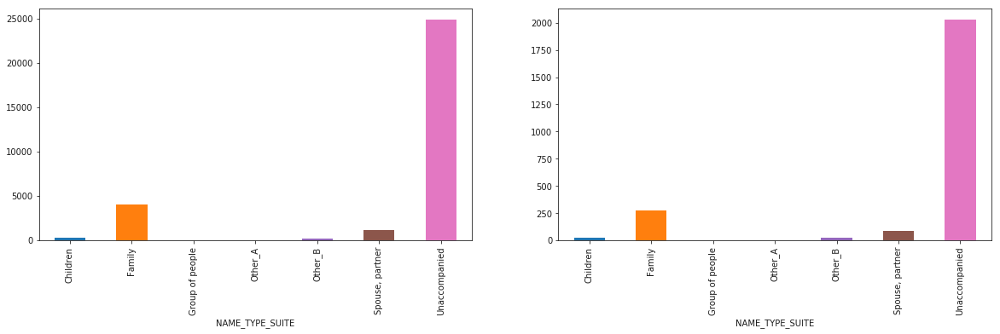

In [49]:
feature = 'NAME_TYPE_SUITE'
plt.figure(figsize=(20,5))
plt.subplot2grid((1,2),(0,0),rowspan=1,colspan=1)
x_df.groupby(feature).SK_ID_CURR.count().plot.bar()
plt.subplot2grid((1,2),(0,1),rowspan=1,colspan=1)
x_df[x_df['TARGET']==1].groupby(feature).SK_ID_CURR.count().plot.bar()
plt.show()

In [50]:
corr_thres = .1

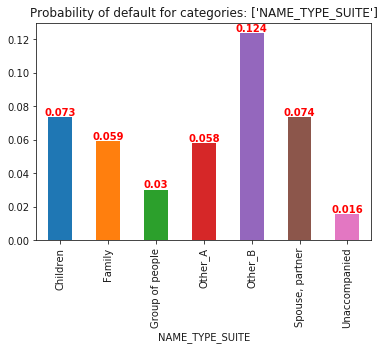

In [51]:
# Default ratio for the feature
lst = []
lst.append(feature)
f.default_ratio(x_df,['TARGET'],1,0,lst,.001)

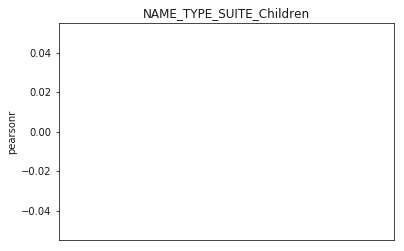

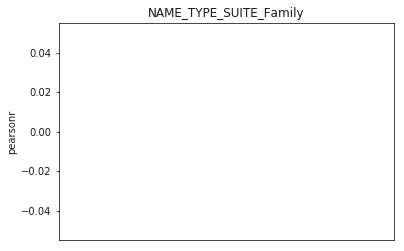

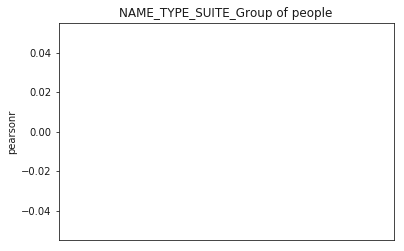

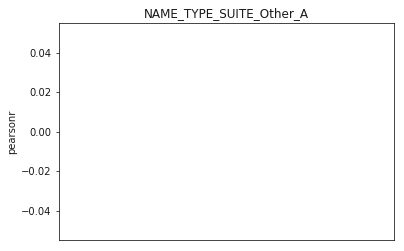

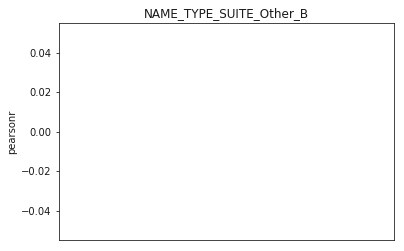

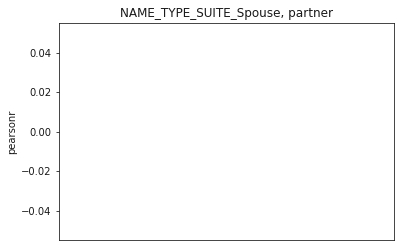

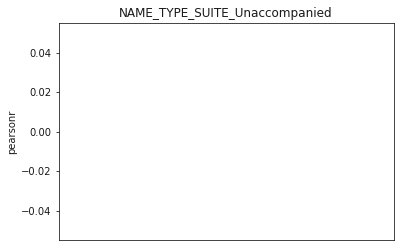

In [52]:
# Higher Correlations of all categories of feature with all other features

categories = x_corr.filter(like=feature,axis=0).index.tolist()

rng = np.arange(len(categories))
for i in categories:
    
    val= x_corr[i].sort_values(ascending=False)
    val = val[val.where((val>corr_thres) & (val!=1))>0]
    
    y_pos = np.arange(len(val.index))
    width = 0.35

    abc, ax1 = plt.subplots()
    rects1 = ax1.bar(y_pos-width/2, val, width, align='center', alpha=0.5,label=i,color = color_list)
    for v,c in enumerate(val):
        ax1.text(v-width/2, 
                c+.005, 
                round(c,1), 
                color='red', 
                fontweight='bold',
                horizontalalignment='center')
    
    ax1.set_ylabel('pearsonr')
    ax1.set_title(i)
    plt.xticks(rotation='vertical')
    ax1.set_xticks(y_pos-width/2)
    ax1.set_xticklabels(val.index)

TARGET  VS  NAME_TYPE_SUITE  VS  NAME_CONTRACT_TYPE


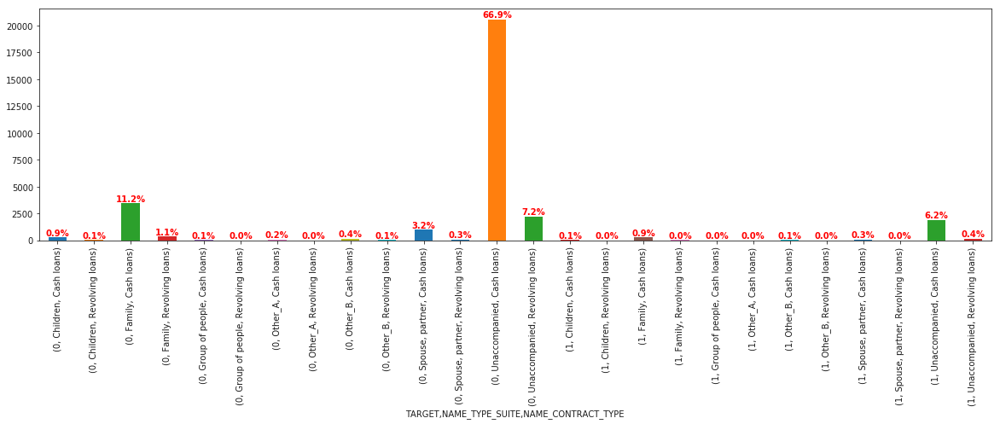

TARGET  VS  NAME_TYPE_SUITE  VS  CODE_GENDER


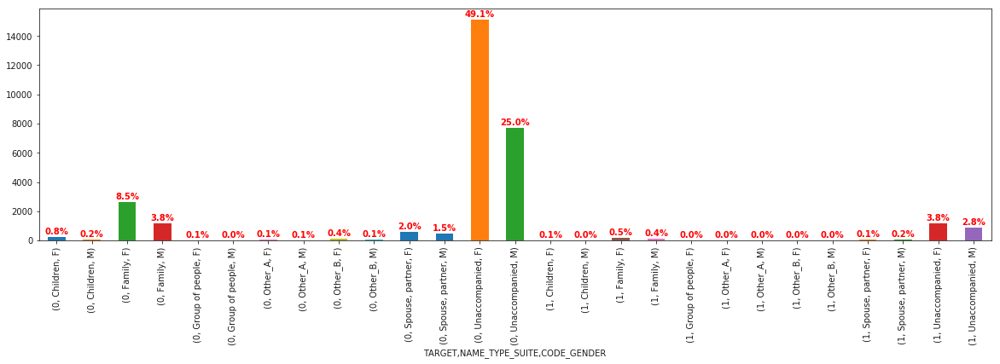

TARGET  VS  NAME_TYPE_SUITE  VS  FLAG_OWN_CAR


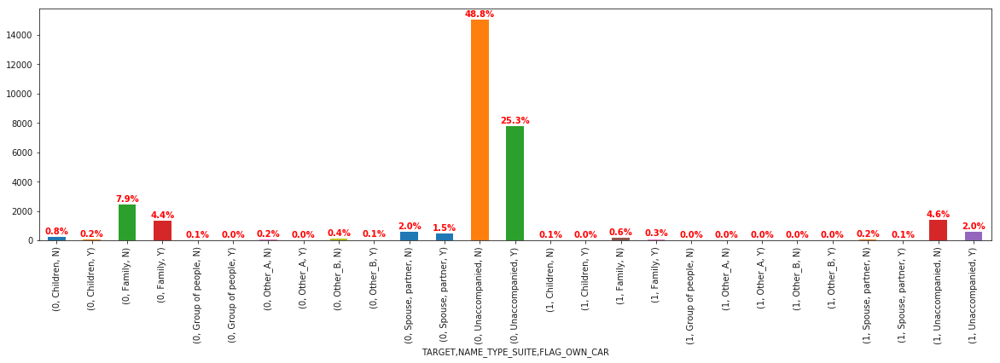

TARGET  VS  NAME_TYPE_SUITE  VS  FLAG_OWN_REALTY


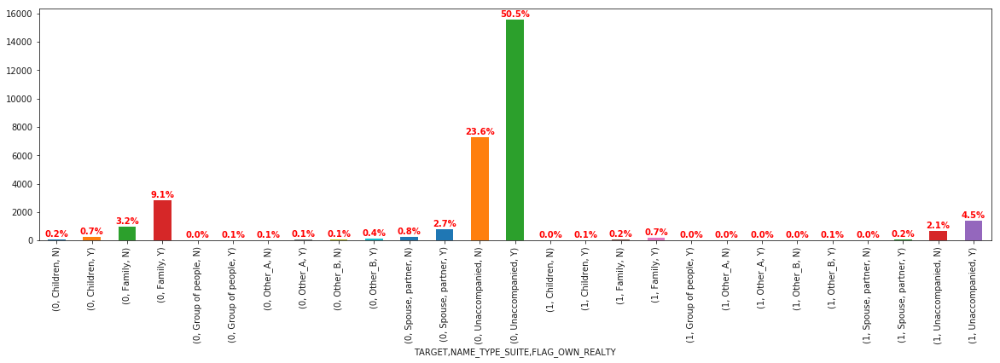

TARGET  VS  NAME_TYPE_SUITE  VS  CNT_CHILDREN


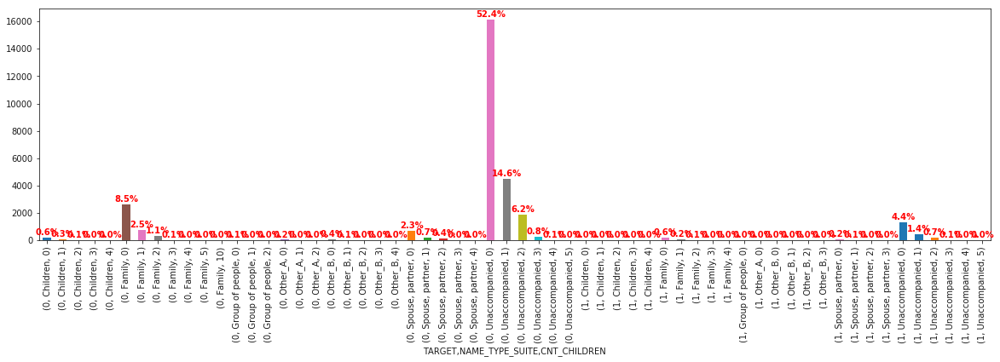

TARGET  VS  NAME_TYPE_SUITE  VS  NAME_INCOME_TYPE


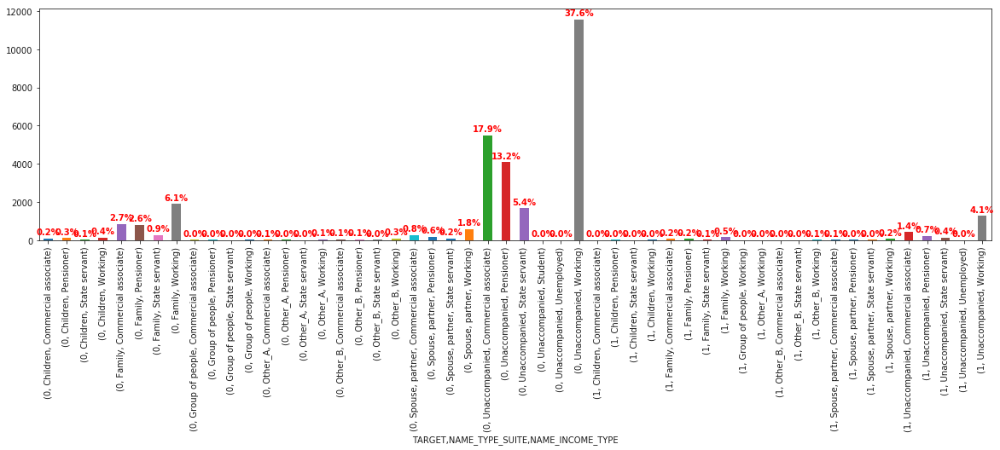

TARGET  VS  NAME_TYPE_SUITE  VS  NAME_EDUCATION_TYPE


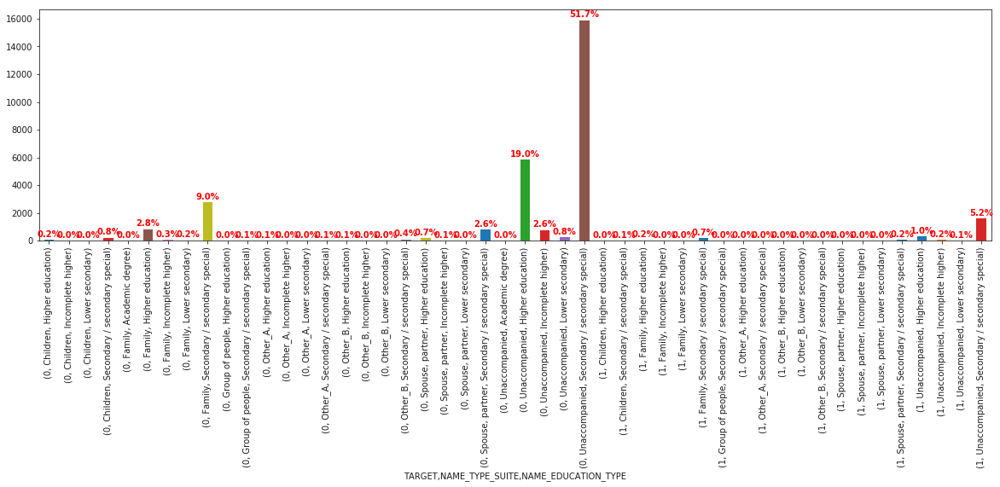

TARGET  VS  NAME_TYPE_SUITE  VS  NAME_FAMILY_STATUS


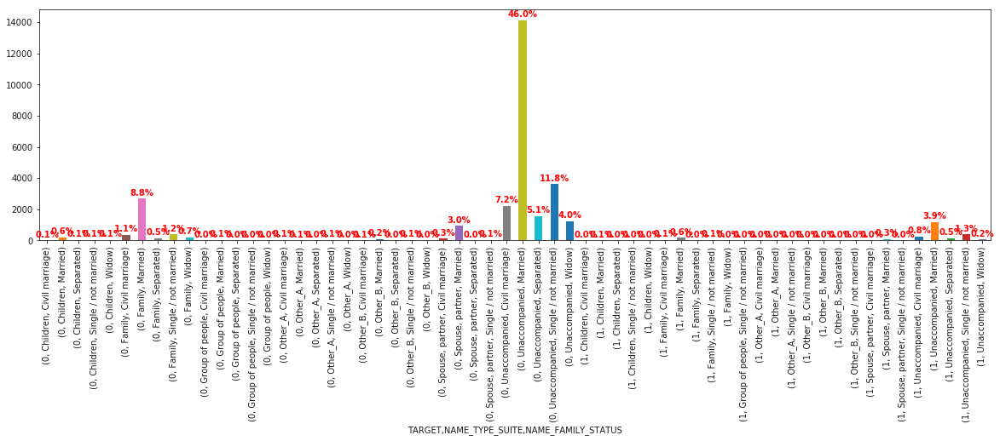

TARGET  VS  NAME_TYPE_SUITE  VS  NAME_HOUSING_TYPE


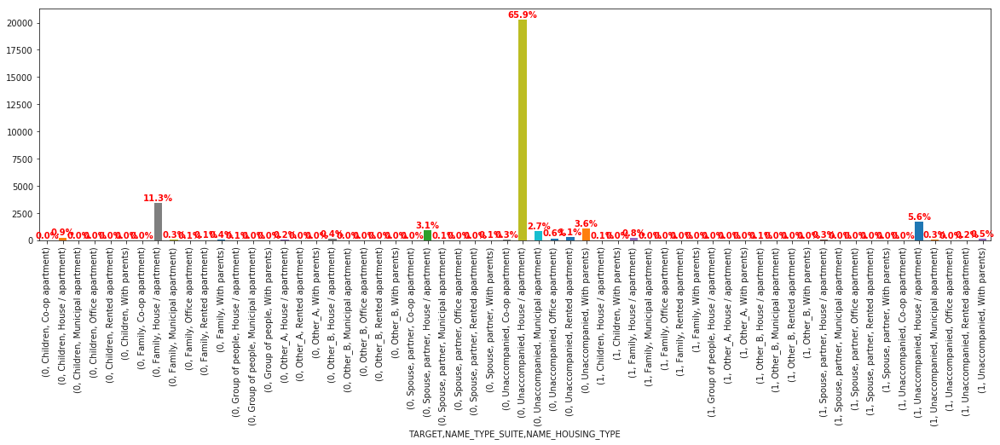

TARGET  VS  NAME_TYPE_SUITE  VS  CNT_FAM_MEMBERS


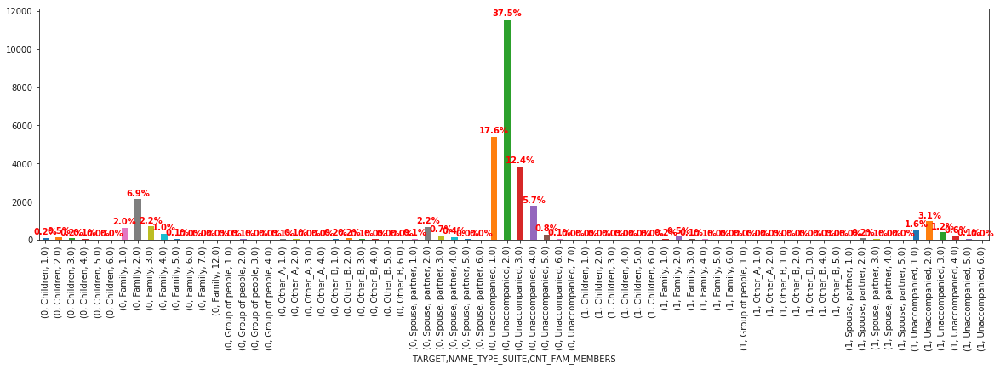

In [53]:
# Feature relationship with important categorical feats
for i in imp_cat_feats:
    if i != feature :
        print('TARGET',' VS ',feature,' VS ',i)
        width=.5
        plt.figure(figsize=(20,5))
        g = x_df.groupby(by = ['TARGET',feature,i])
        vc = g.SK_ID_CURR.count()
        ax = vc.plot.bar(width=width)
        
        for v,c in enumerate(vc):
            ax.text(v, 
                    c+200, 
                    '{}%'.format(round((c/x_df.shape[0])*100,1)), 
                    color='red', 
                    fontweight='bold',
                    horizontalalignment='center')
        plt.show()

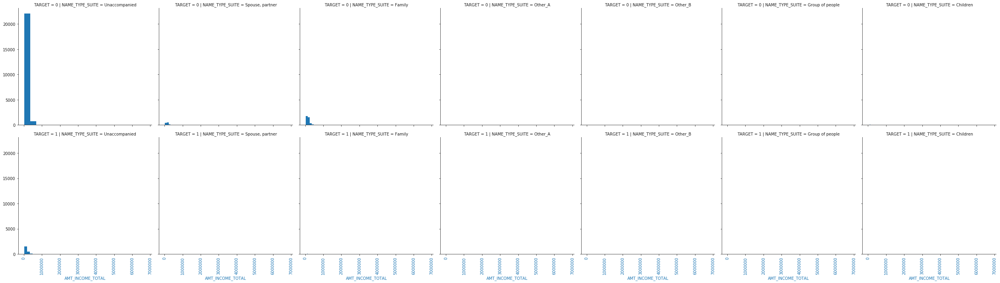

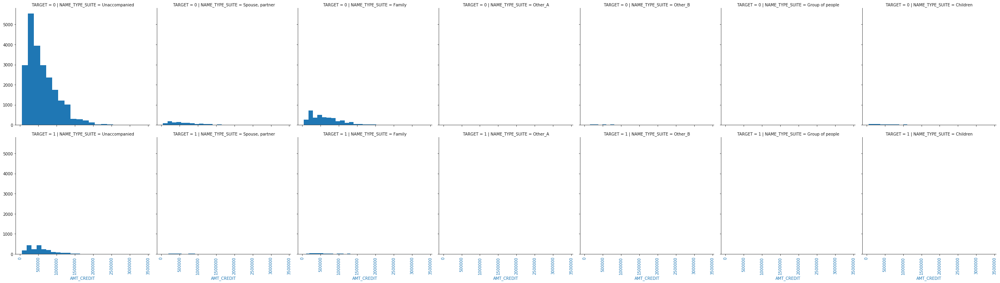

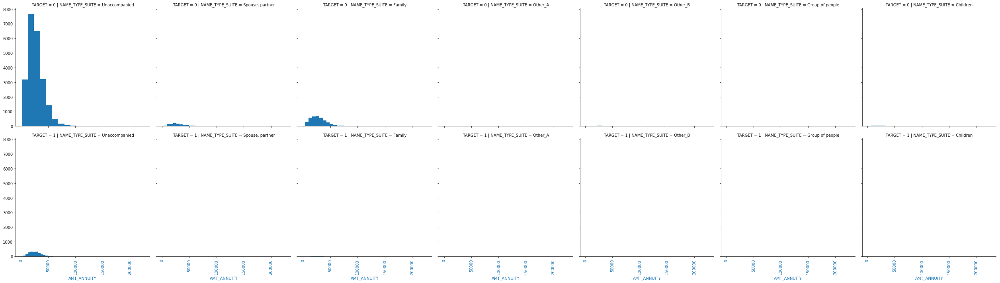

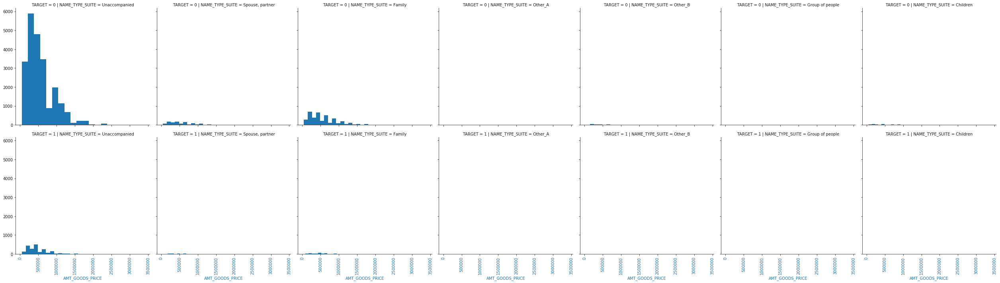

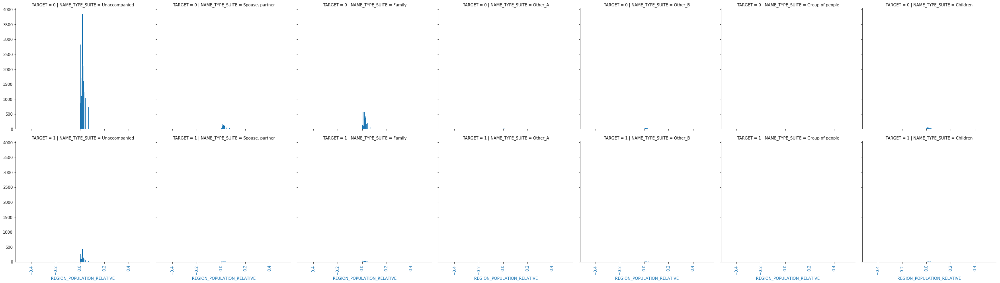

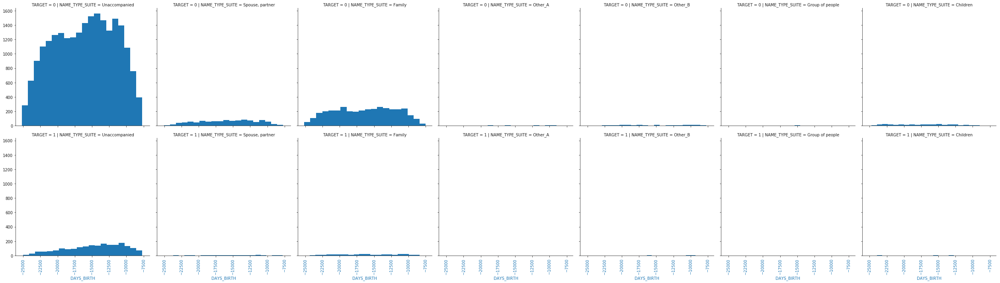

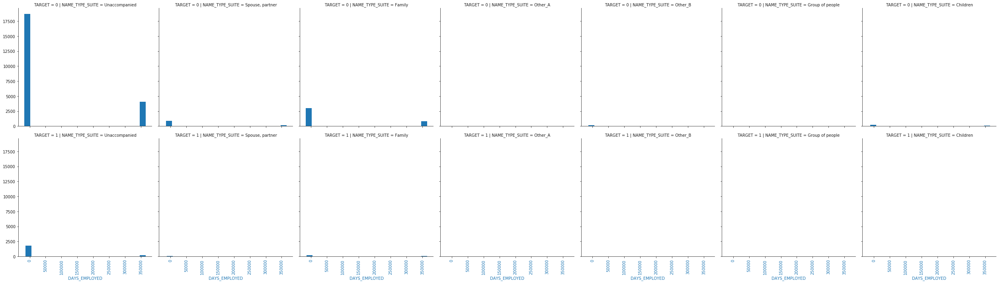

In [54]:
# Feature relationship with important numerical feats

from itertools import cycle, islice
for i in imp_num_feats:
    g = sns.FacetGrid(x_df, row="TARGET",  col=feature,size=5)
    g = g.map(plt.hist, i,bins=20)
    g.map(plt.xticks, rotation=90)
    g.map(plt.xlabel,i)

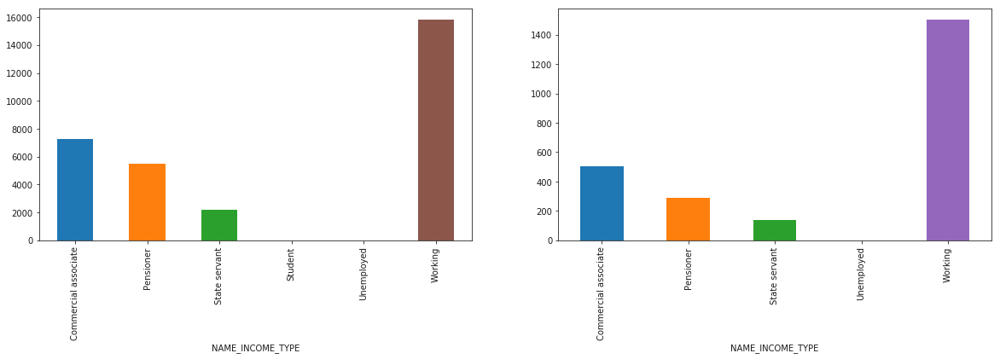

In [55]:
feature = 'NAME_INCOME_TYPE'
plt.figure(figsize=(20,5))
plt.subplot2grid((1,2),(0,0),rowspan=1,colspan=1)
x_df.groupby(feature).SK_ID_CURR.count().plot.bar()
plt.subplot2grid((1,2),(0,1),rowspan=1,colspan=1)
x_df[x_df['TARGET']==1].groupby(feature).SK_ID_CURR.count().plot.bar()
plt.show()

In [56]:
corr_thres = .1

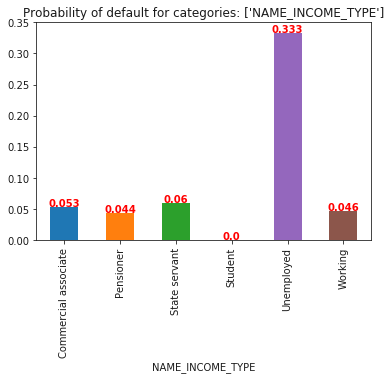

In [57]:
# Default ratio for the feature
lst = []
lst.append(feature)
f.default_ratio(x_df,['TARGET'],1,0,lst,.001)

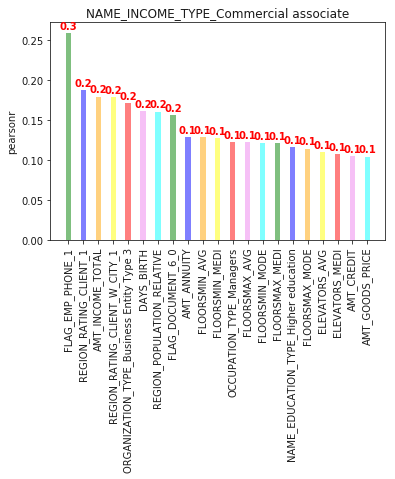

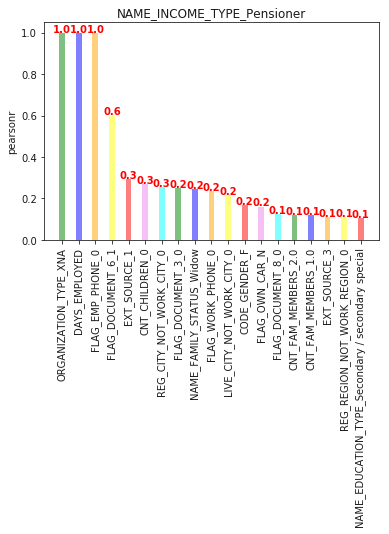

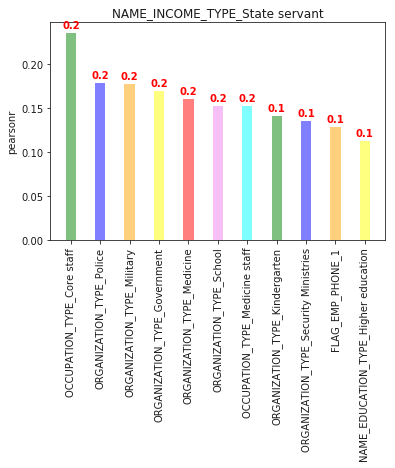

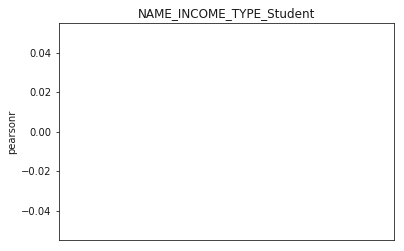

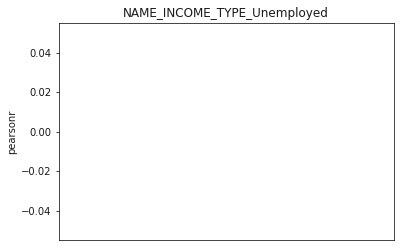

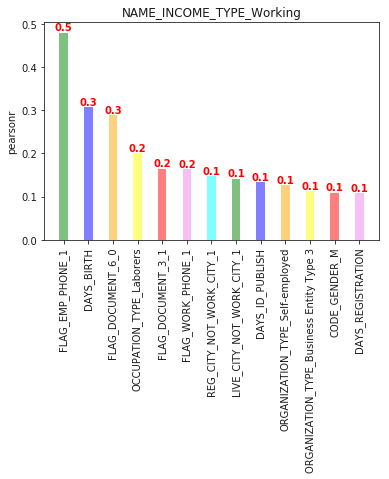

In [58]:
# Higher Correlations of all categories of feature with all other features

categories = x_corr.filter(like=feature,axis=0).index.tolist()

rng = np.arange(len(categories))
for i in categories:
    
    val= x_corr[i].sort_values(ascending=False)
    val = val[val.where((val>corr_thres) & (val!=1))>0]
    
    y_pos = np.arange(len(val.index))
    width = 0.35

    abc, ax1 = plt.subplots()
    rects1 = ax1.bar(y_pos-width/2, val, width, align='center', alpha=0.5,label=i,color = color_list)
    for v,c in enumerate(val):
        ax1.text(v-width/2, 
                c+.005, 
                round(c,1), 
                color='red', 
                fontweight='bold',
                horizontalalignment='center')
    
    ax1.set_ylabel('pearsonr')
    ax1.set_title(i)
    plt.xticks(rotation='vertical')
    ax1.set_xticks(y_pos-width/2)
    ax1.set_xticklabels(val.index)

NAME_INCOME_TYPE  VS  NAME_CONTRACT_TYPE  VS TARGET


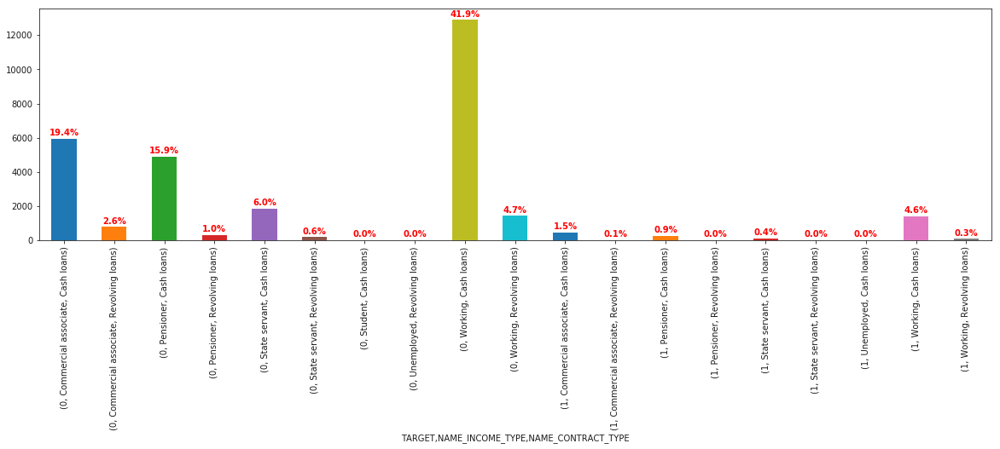

NAME_INCOME_TYPE  VS  CODE_GENDER  VS TARGET


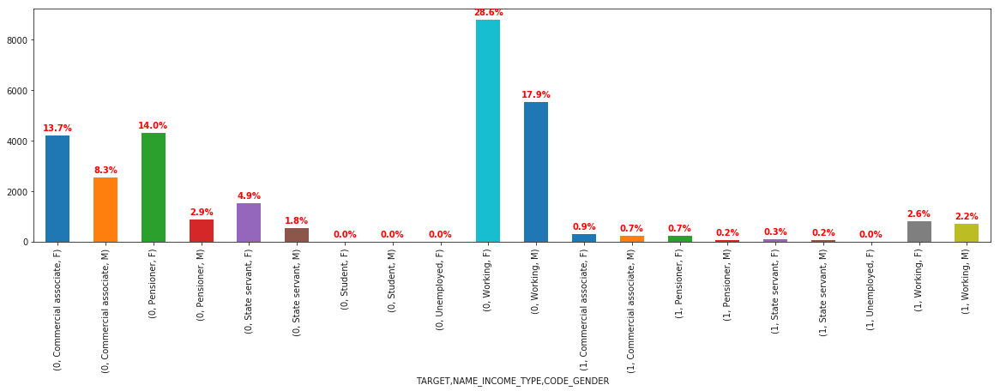

NAME_INCOME_TYPE  VS  FLAG_OWN_CAR  VS TARGET


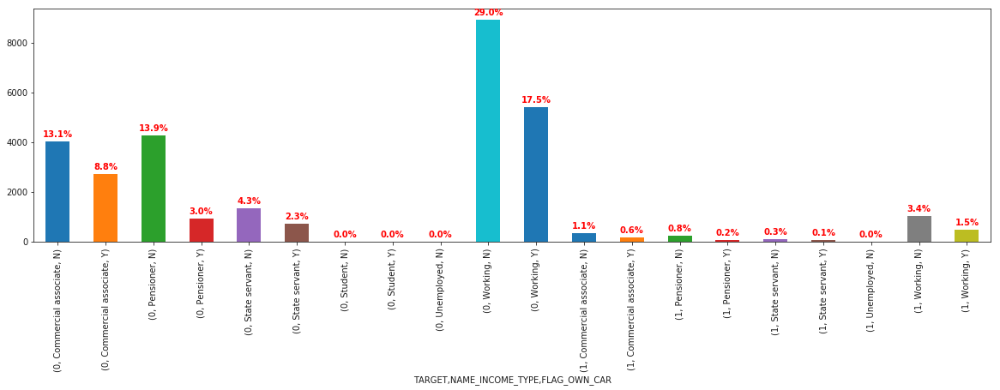

NAME_INCOME_TYPE  VS  FLAG_OWN_REALTY  VS TARGET


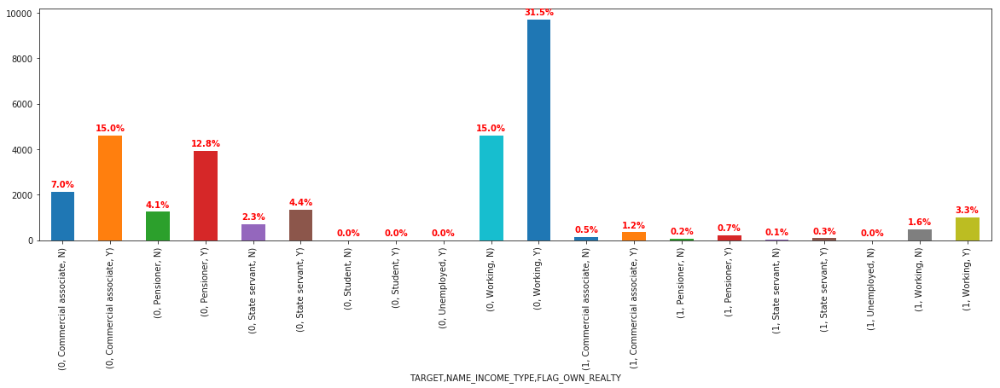

NAME_INCOME_TYPE  VS  CNT_CHILDREN  VS TARGET


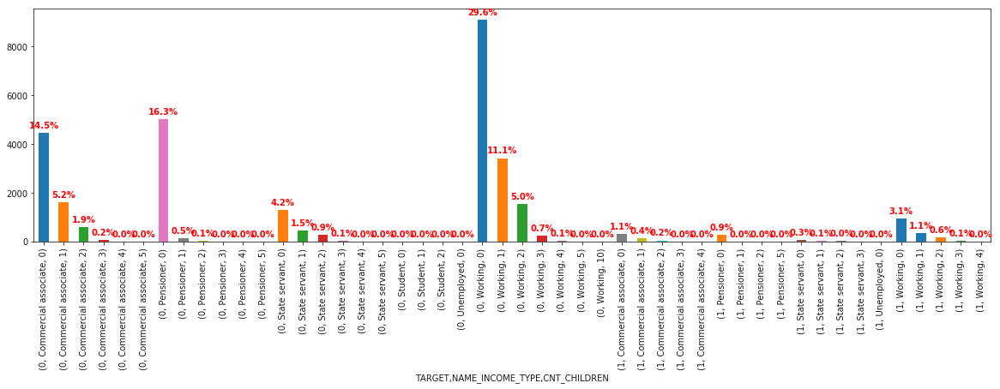

NAME_INCOME_TYPE  VS  NAME_EDUCATION_TYPE  VS TARGET


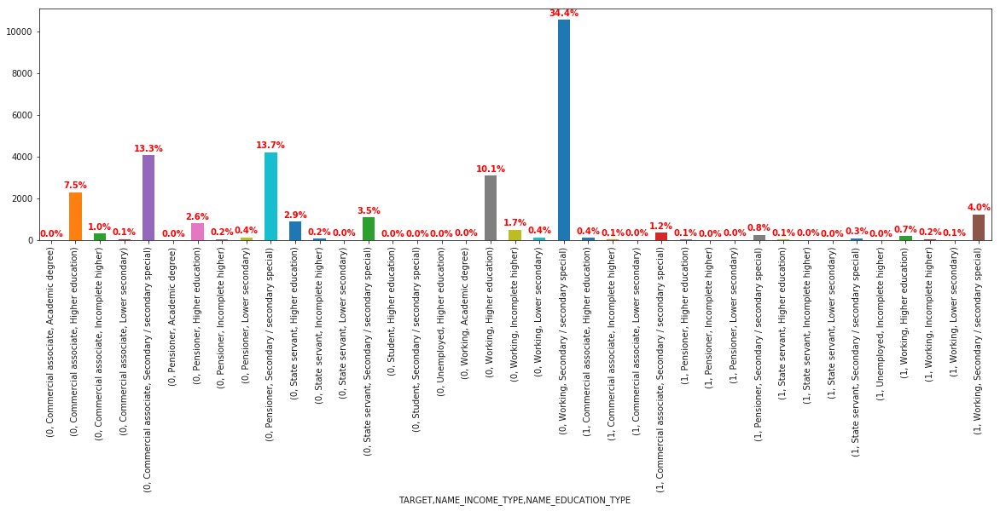

NAME_INCOME_TYPE  VS  NAME_FAMILY_STATUS  VS TARGET


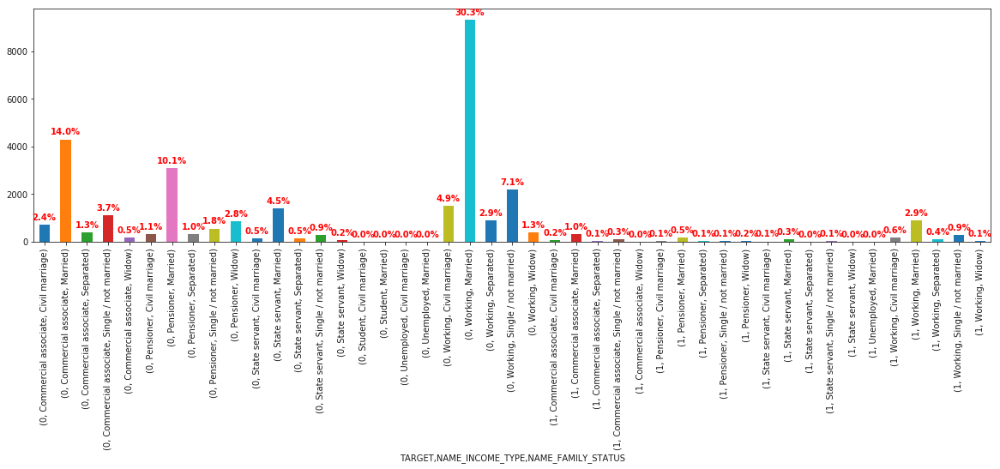

NAME_INCOME_TYPE  VS  NAME_HOUSING_TYPE  VS TARGET


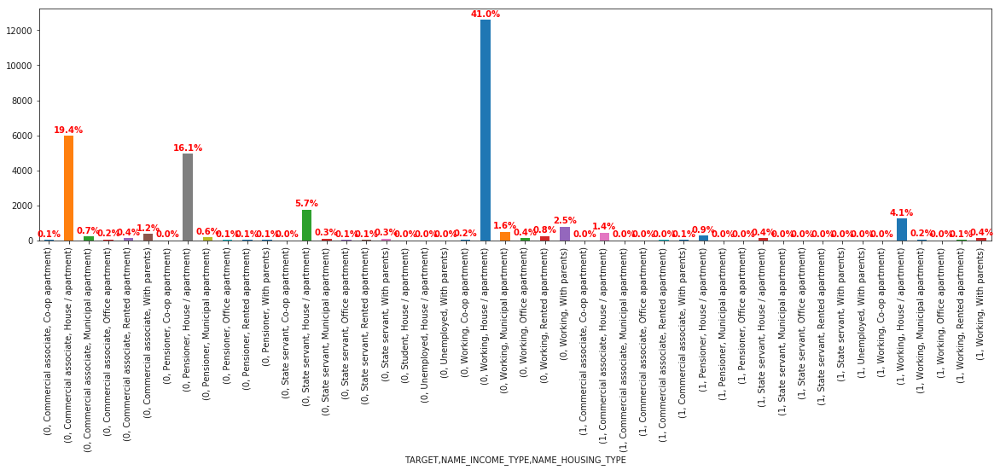

NAME_INCOME_TYPE  VS  CNT_FAM_MEMBERS  VS TARGET


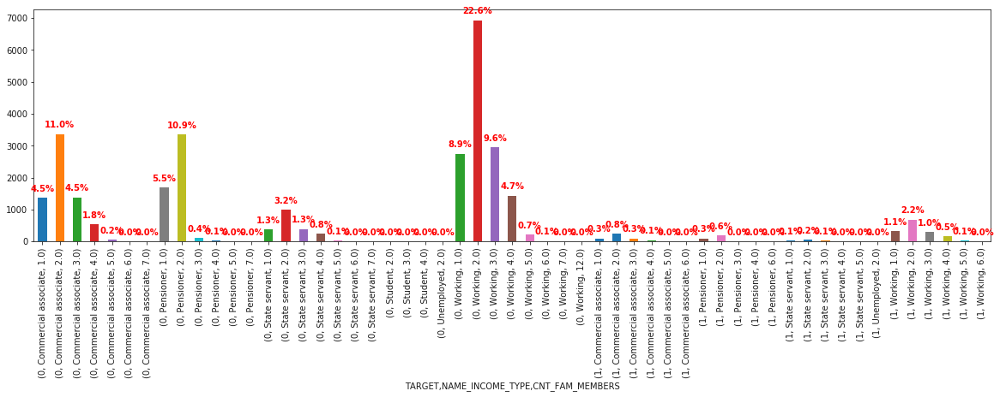

In [59]:
# Feature relationship with important categorical feats
for i in imp_cat_feats:
    if i != feature :
        print(feature," VS ",i, " VS TARGET")
        width=.5
        plt.figure(figsize=(20,5))
        g = x_df.groupby(by = ['TARGET',feature,i])
        vc = g.SK_ID_CURR.count()
        ax = vc.plot.bar(width=width)
        
        for v,c in enumerate(vc):
            ax.text(v, 
                    c+200, 
                    '{}%'.format(round((c/x_df.shape[0])*100,1)), 
                    color='red', 
                    fontweight='bold',
                    horizontalalignment='center')
        plt.show()

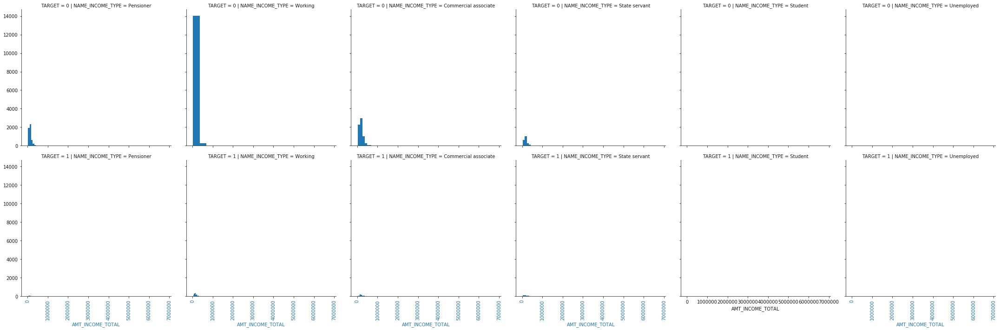

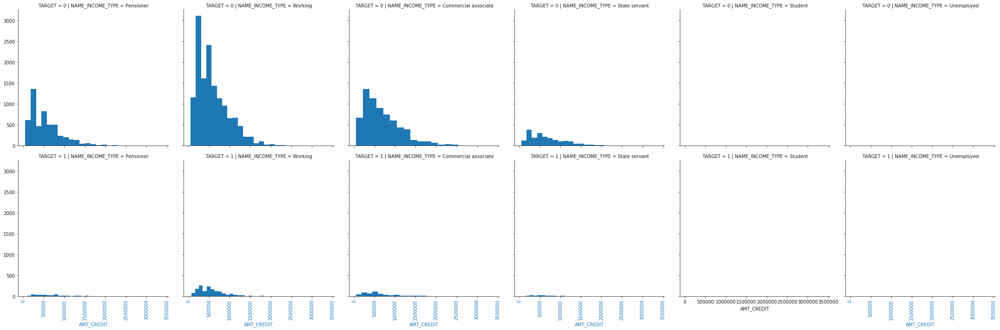

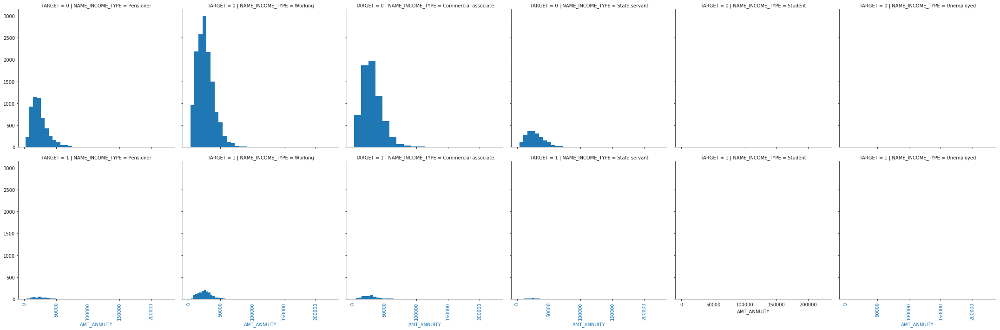

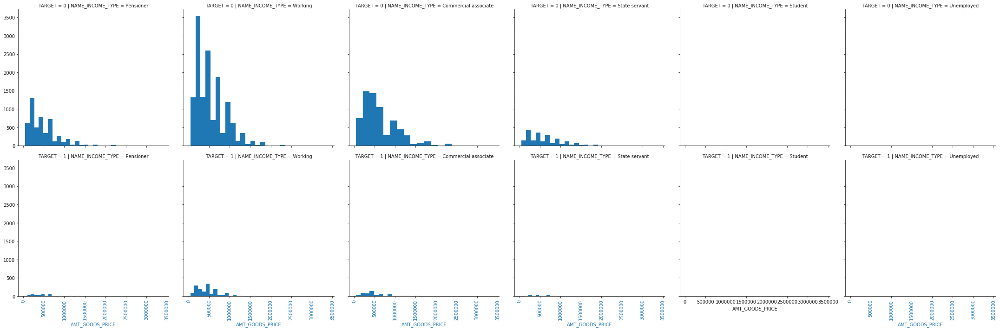

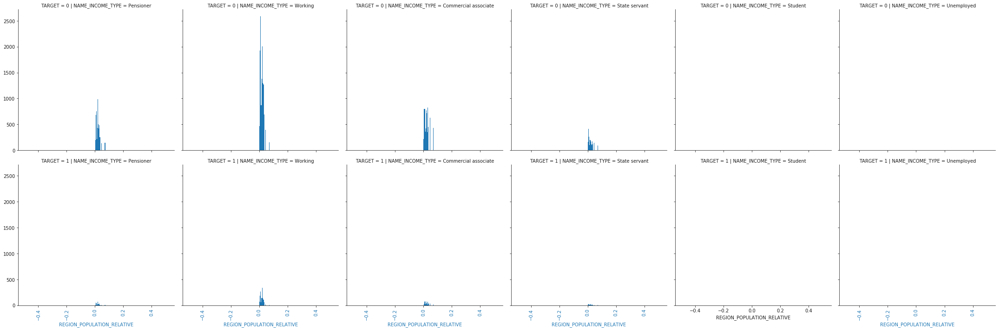

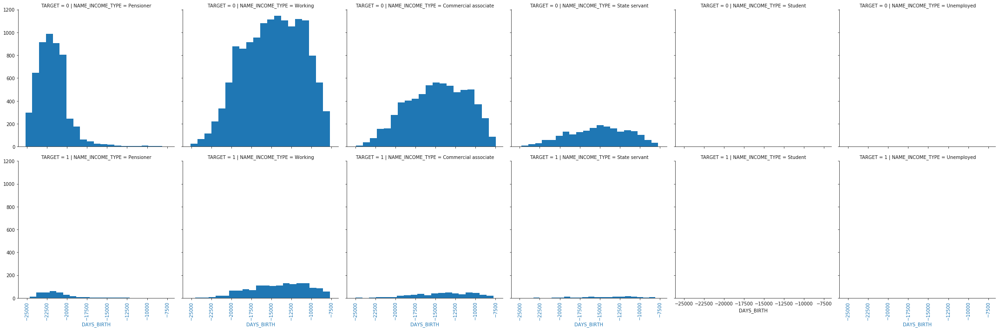

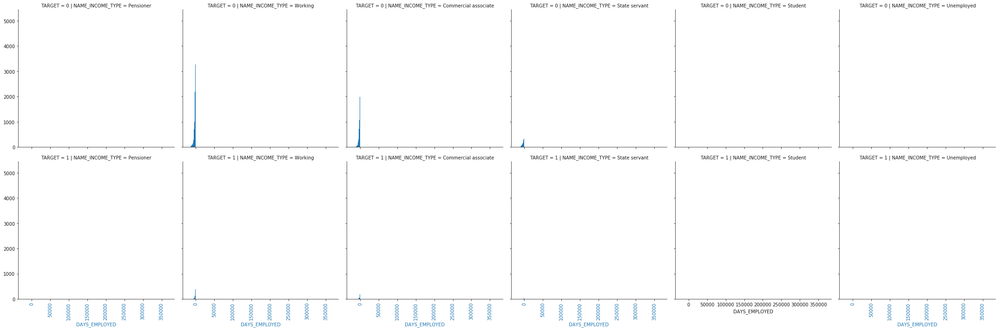

In [60]:
# Feature relationship with important numerical feats

from itertools import cycle, islice
for i in imp_num_feats:
    g = sns.FacetGrid(x_df, row="TARGET",  col=feature,size=5)
    g = g.map(plt.hist, i,bins=20)
    g.map(plt.xticks, rotation=90)
    g.map(plt.xlabel,i)

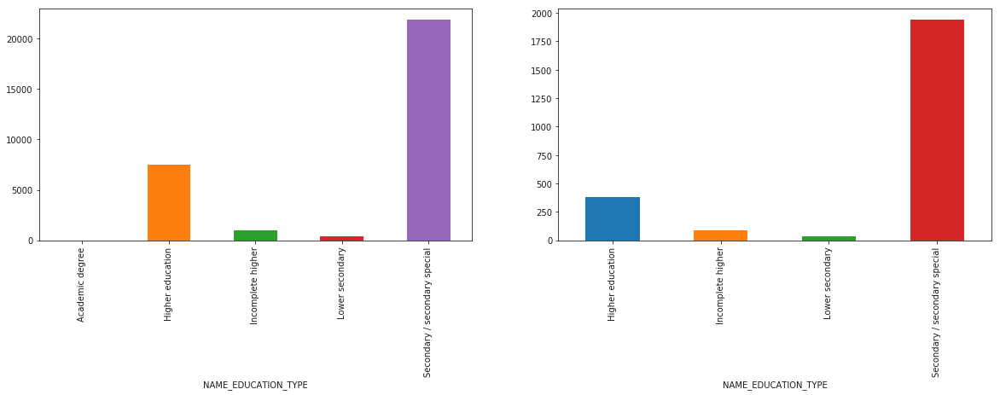

In [61]:
feature = 'NAME_EDUCATION_TYPE'
plt.figure(figsize=(20,5))
plt.subplot2grid((1,2),(0,0),rowspan=1,colspan=1)
x_df.groupby(feature).SK_ID_CURR.count().plot.bar()
plt.subplot2grid((1,2),(0,1),rowspan=1,colspan=1)
x_df[x_df['TARGET']==1].groupby(feature).SK_ID_CURR.count().plot.bar()
plt.show()

In [62]:
corr_thres = .1

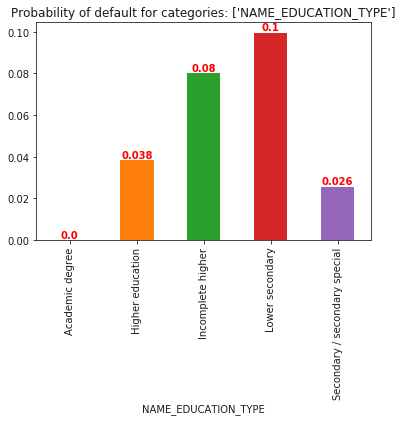

In [63]:
# Default ratio for the feature corrected by sample weight of category. 
lst = []
lst.append(feature)
f.default_ratio(x_df,['TARGET'],1,0,lst,.001)

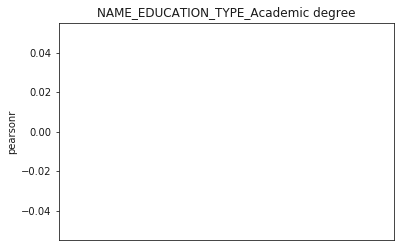

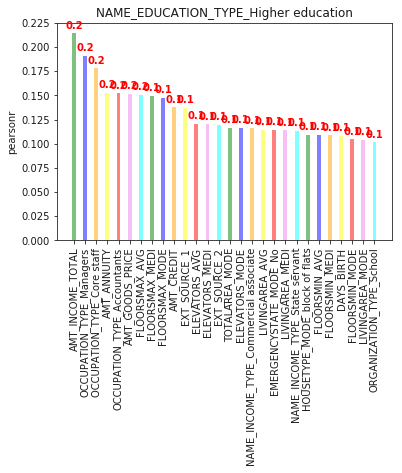

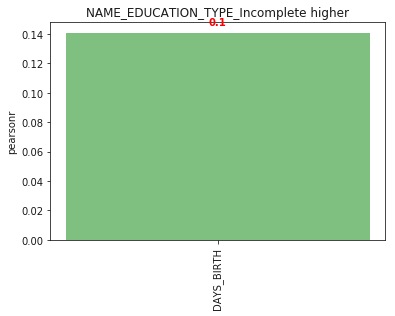

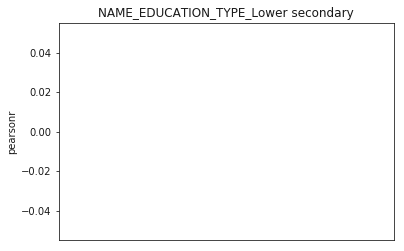

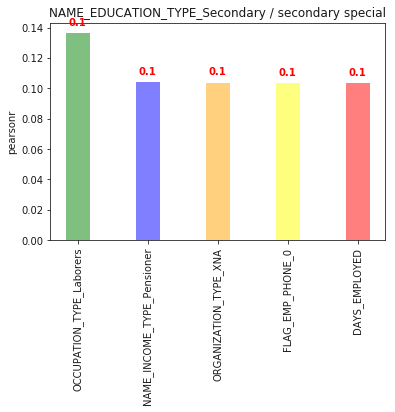

In [64]:
# Higher Correlations of all categories of feature with all other features

categories = x_corr.filter(like=feature,axis=0).index.tolist()

rng = np.arange(len(categories))
for i in categories:
    
    val= x_corr[i].sort_values(ascending=False)
    val = val[val.where((val>corr_thres) & (val!=1))>0]
    
    y_pos = np.arange(len(val.index))
    width = 0.35

    abc, ax1 = plt.subplots()
    rects1 = ax1.bar(y_pos-width/2, val, width, align='center', alpha=0.5,label=i,color = color_list)
    for v,c in enumerate(val):
        ax1.text(v-width/2, 
                c+.005, 
                round(c,1), 
                color='red', 
                fontweight='bold',
                horizontalalignment='center')
    
    ax1.set_ylabel('pearsonr')
    ax1.set_title(i)
    plt.xticks(rotation='vertical')
    ax1.set_xticks(y_pos-width/2)
    ax1.set_xticklabels(val.index)

NAME_EDUCATION_TYPE  VS  NAME_CONTRACT_TYPE  VS TARGET


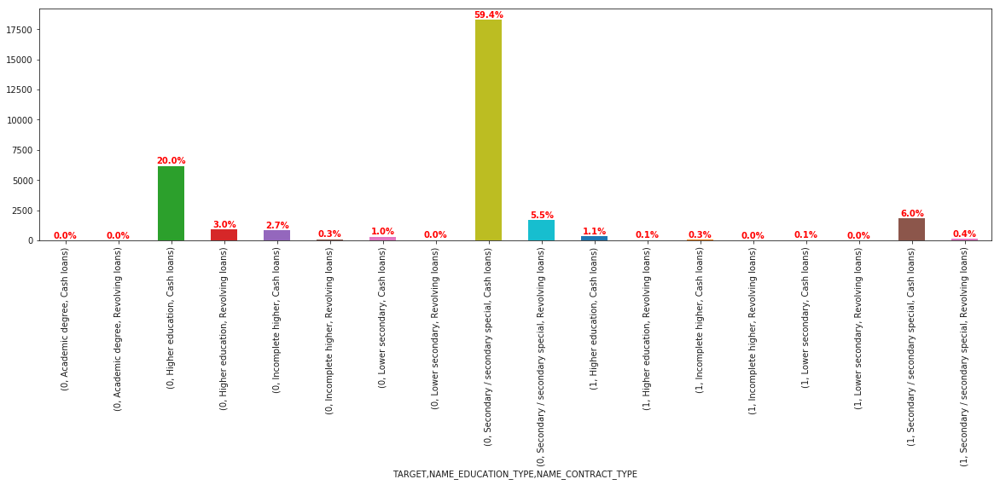

NAME_EDUCATION_TYPE  VS  CODE_GENDER  VS TARGET


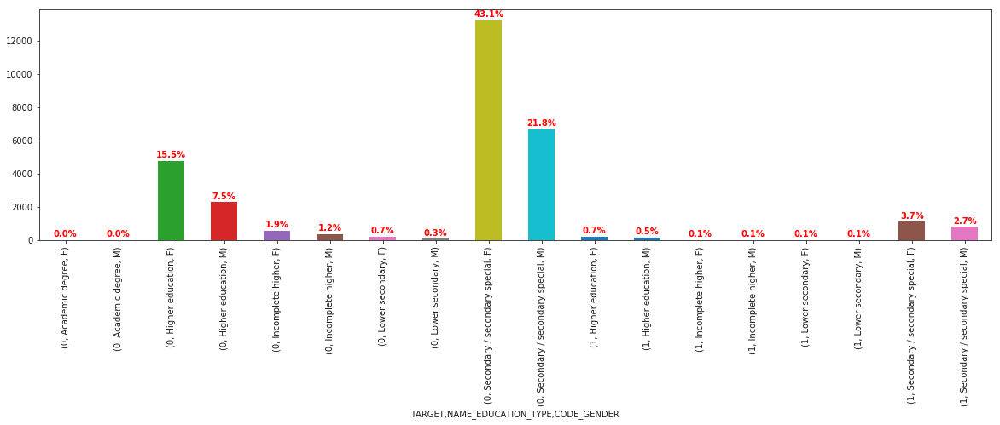

NAME_EDUCATION_TYPE  VS  FLAG_OWN_CAR  VS TARGET


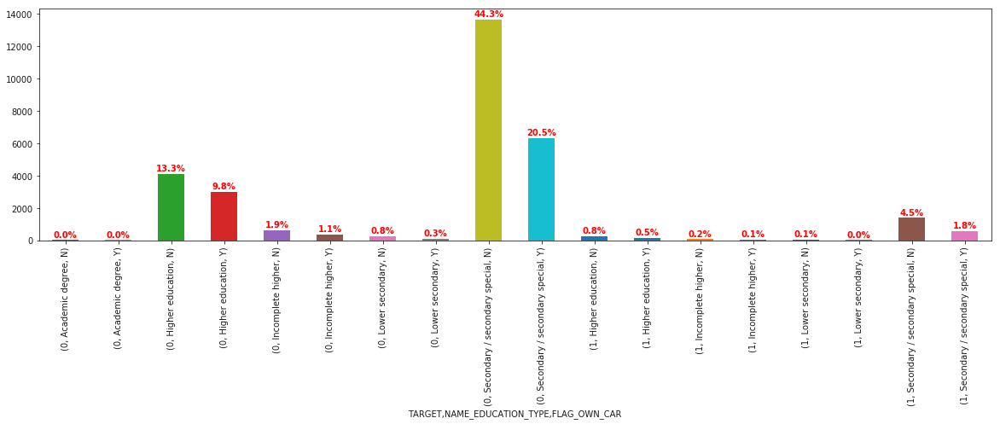

NAME_EDUCATION_TYPE  VS  FLAG_OWN_REALTY  VS TARGET


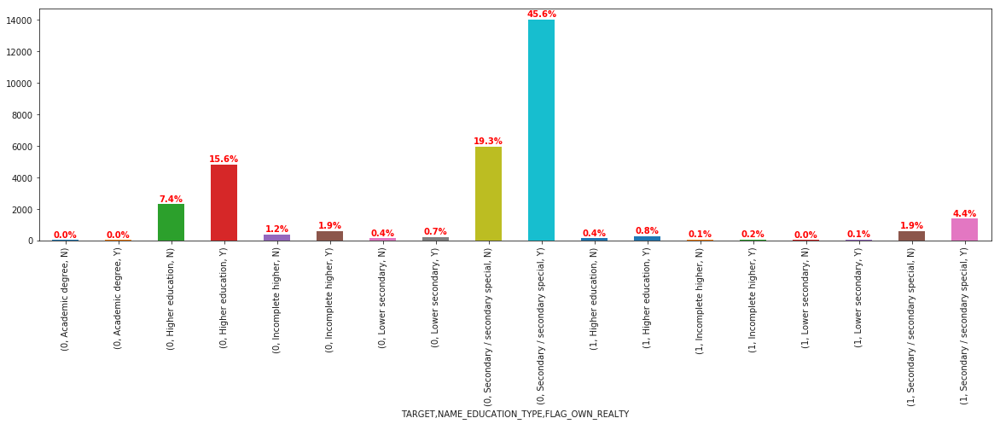

NAME_EDUCATION_TYPE  VS  CNT_CHILDREN  VS TARGET


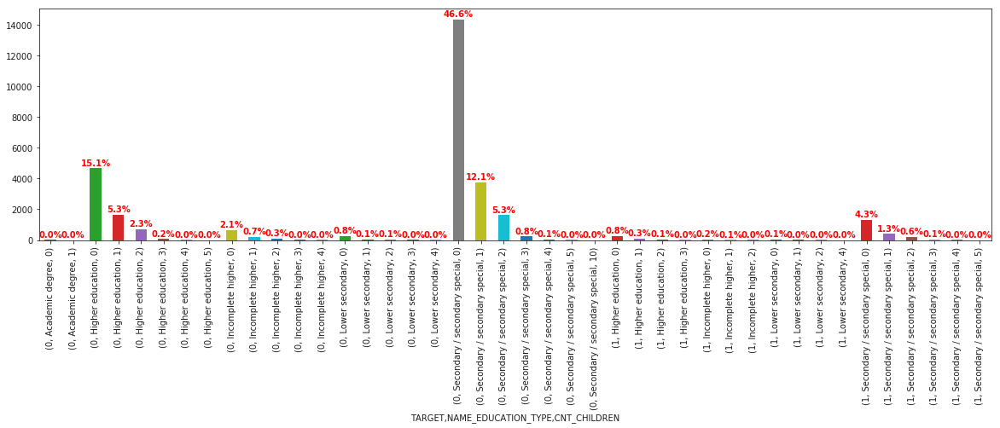

NAME_EDUCATION_TYPE  VS  NAME_INCOME_TYPE  VS TARGET


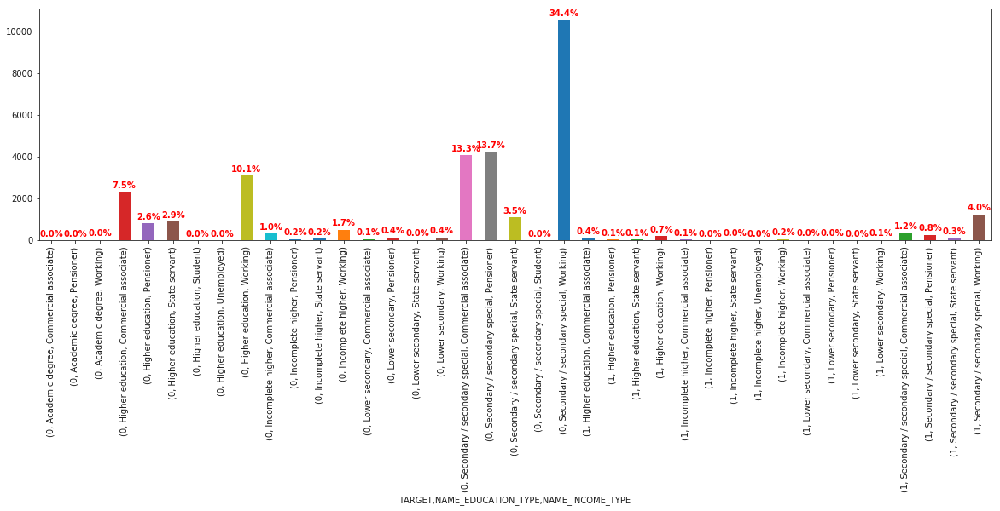

NAME_EDUCATION_TYPE  VS  NAME_FAMILY_STATUS  VS TARGET


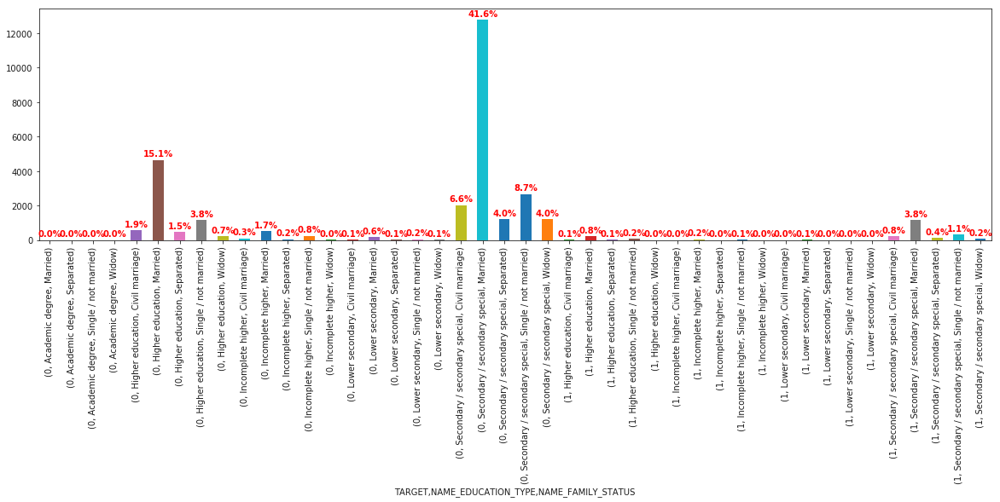

NAME_EDUCATION_TYPE  VS  NAME_HOUSING_TYPE  VS TARGET


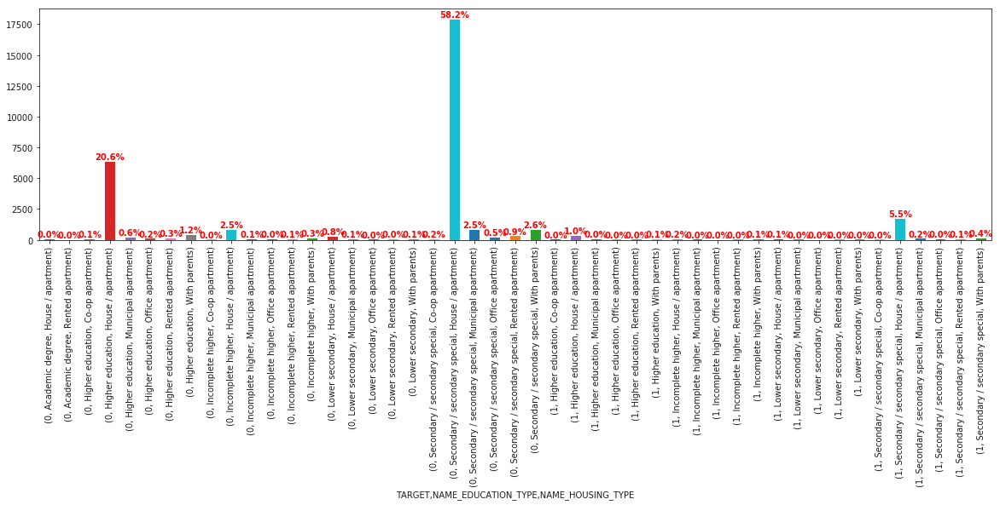

NAME_EDUCATION_TYPE  VS  CNT_FAM_MEMBERS  VS TARGET


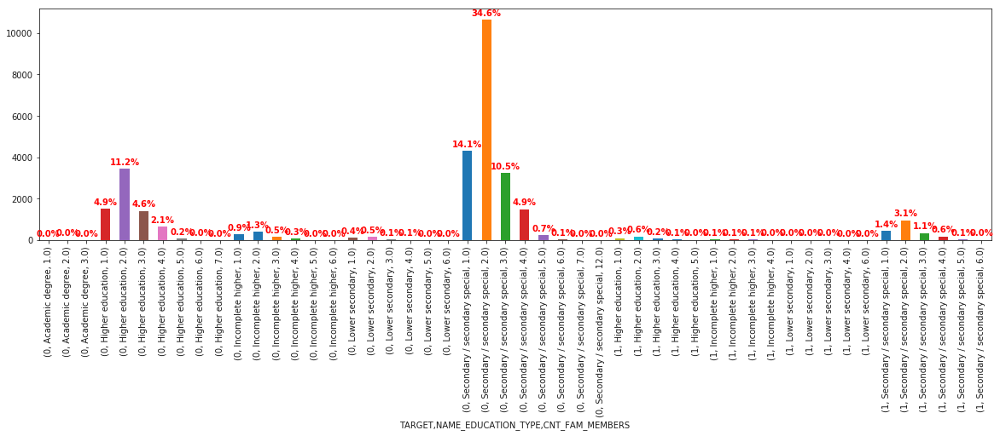

In [65]:
# Feature relationship with important categorical feats
for i in imp_cat_feats:
    if i != feature :
        print(feature," VS ",i, " VS TARGET")
        width=.5
        plt.figure(figsize=(20,5))
        g = x_df.groupby(by = ['TARGET',feature,i])
        vc = g.SK_ID_CURR.count()
        ax = vc.plot.bar(width=width)
        
        for v,c in enumerate(vc):
            ax.text(v, 
                    c+200, 
                    '{}%'.format(round((c/x_df.shape[0])*100,1)), 
                    color='red', 
                    fontweight='bold',
                    horizontalalignment='center')
        plt.show()

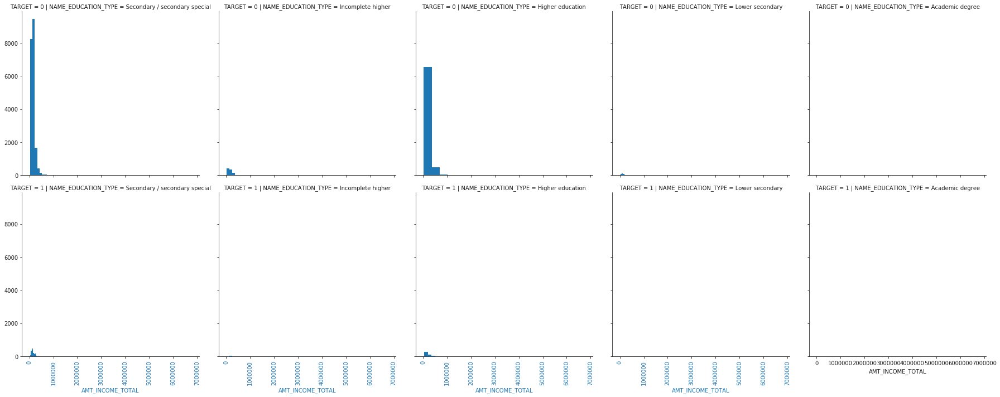

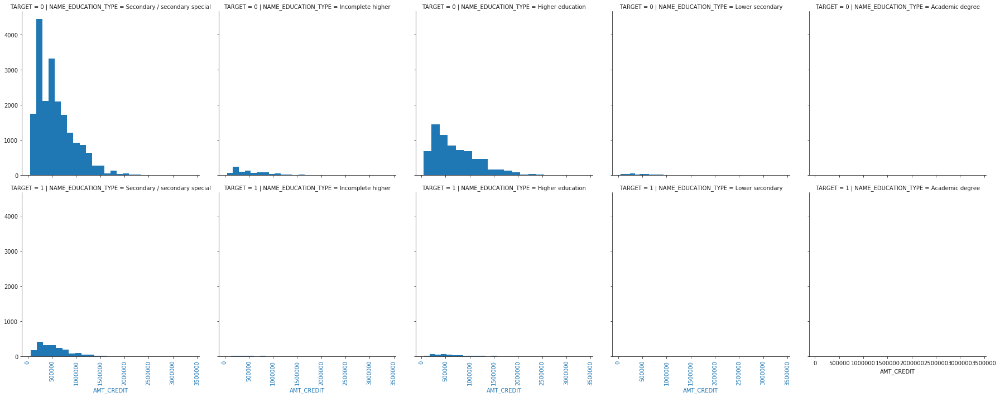

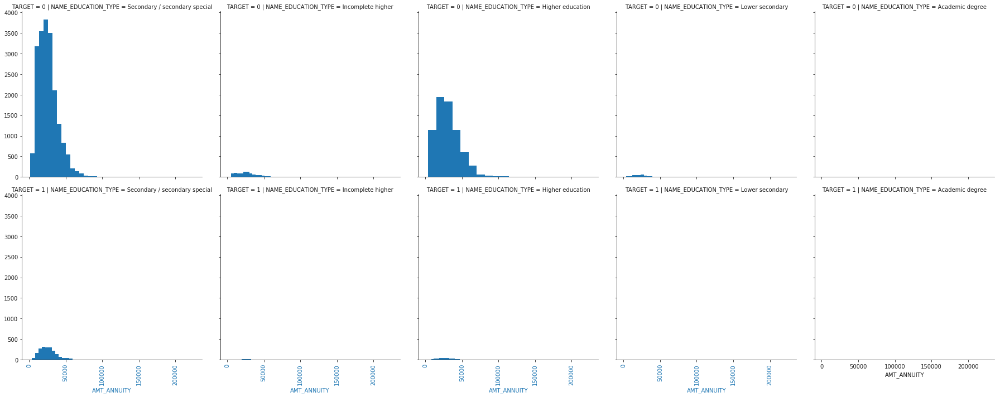

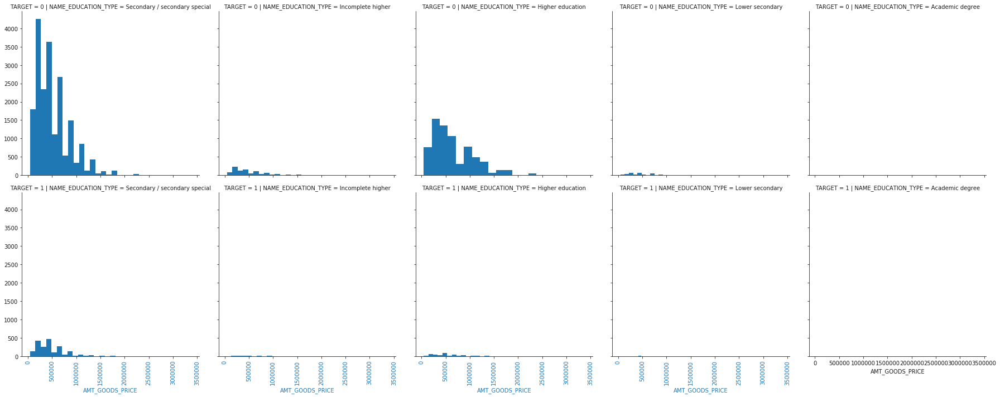

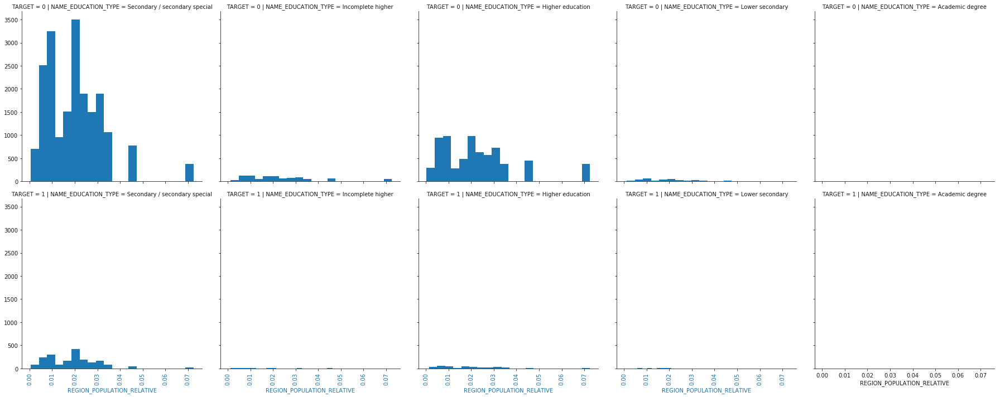

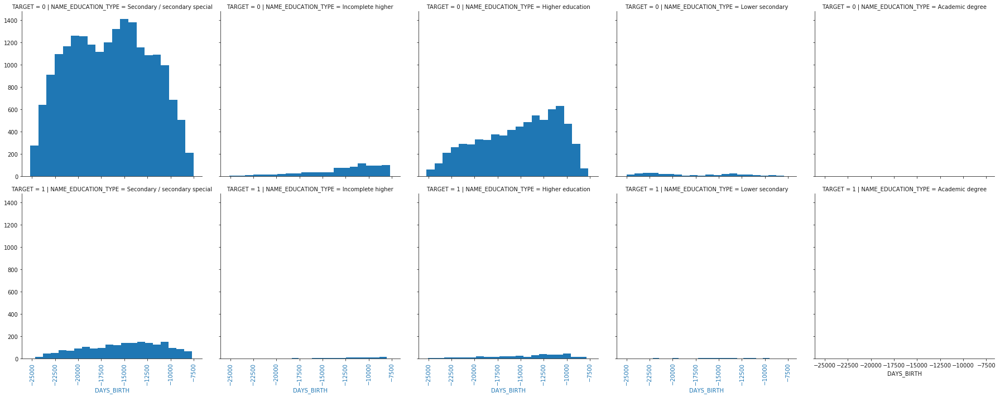

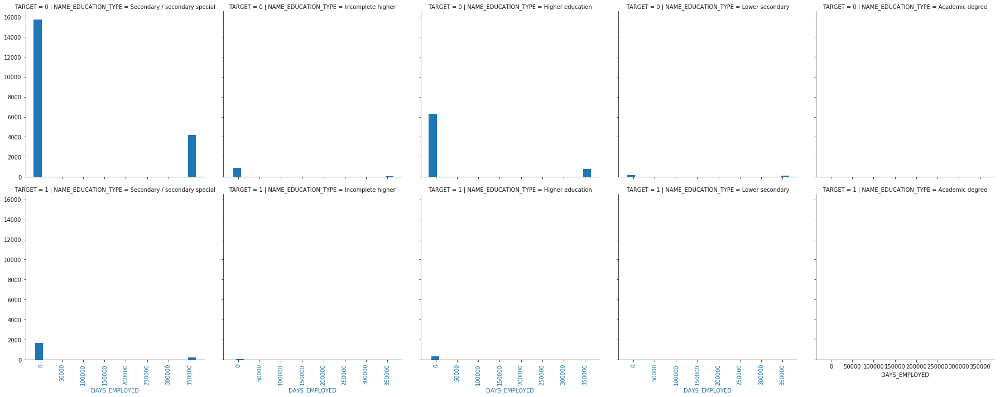

In [66]:
# Feature relationship with important numerical feats

from itertools import cycle, islice
for i in imp_num_feats:
    g = sns.FacetGrid(x_df, row="TARGET",  col=feature,size=5)
    g = g.map(plt.hist, i,bins=20)
    g.map(plt.xticks, rotation=90)
    g.map(plt.xlabel,i)

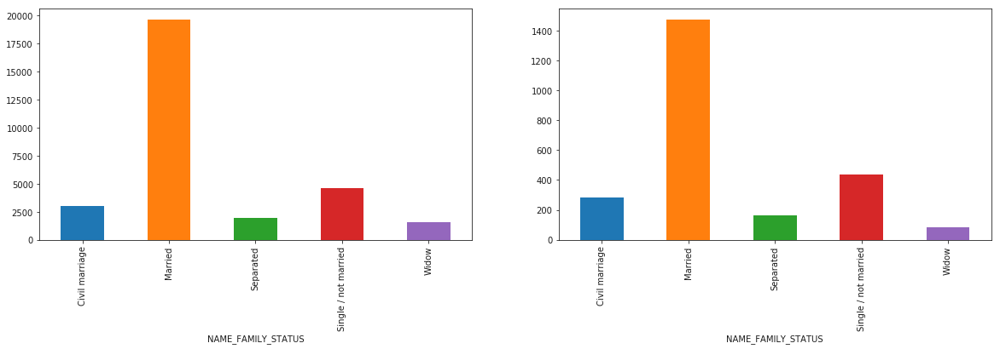

In [73]:
feature = 'NAME_FAMILY_STATUS'
plt.figure(figsize=(20,5))
plt.subplot2grid((1,2),(0,0),rowspan=1,colspan=1)
x_df.groupby(feature).SK_ID_CURR.count().plot.bar()
plt.subplot2grid((1,2),(0,1),rowspan=1,colspan=1)
x_df[x_df['TARGET']==1].groupby(feature).SK_ID_CURR.count().plot.bar()
plt.show()

In [74]:
corr_thres = .1

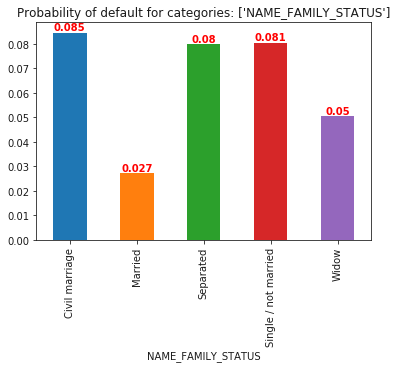

In [75]:
# Default ratio for the feature corrected by sample weight of category. 
lst = []
lst.append(feature)
f.default_ratio(x_df,['TARGET'],1,0,lst,.001)

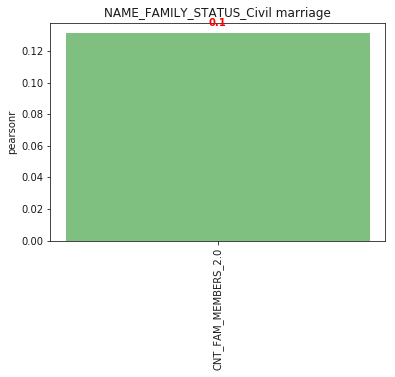

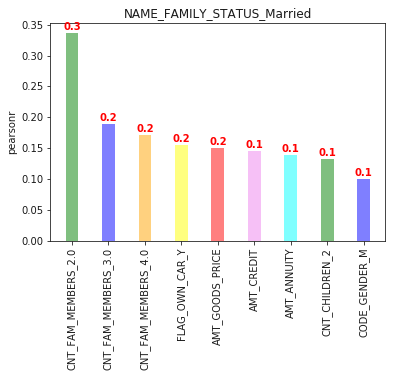

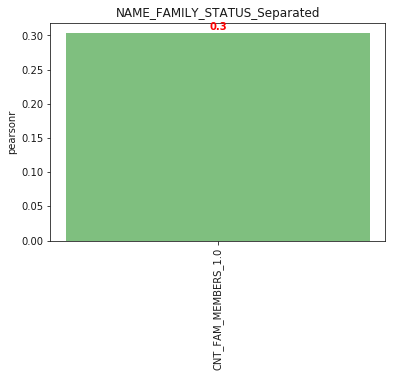

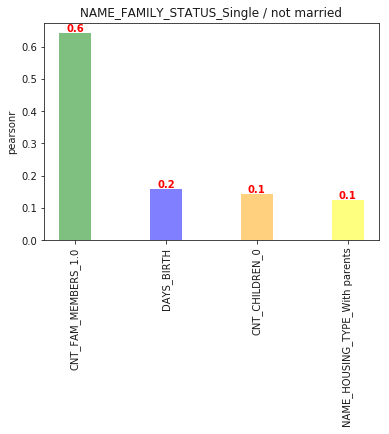

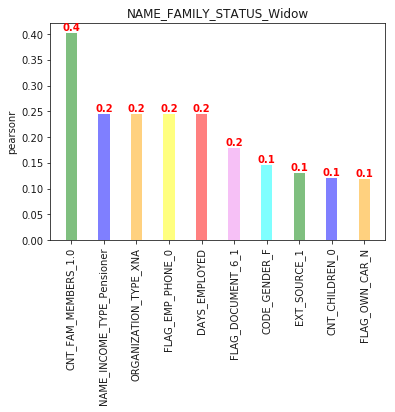

In [76]:
# Higher Correlations of all categories of feature with all other features

categories = x_corr.filter(like=feature,axis=0).index.tolist()

rng = np.arange(len(categories))
for i in categories:
    
    val= x_corr[i].sort_values(ascending=False)
    val = val[val.where((val>corr_thres) & (val!=1))>0]
    
    y_pos = np.arange(len(val.index))
    width = 0.35

    abc, ax1 = plt.subplots()
    rects1 = ax1.bar(y_pos-width/2, val, width, align='center', alpha=0.5,label=i,color = color_list)
    for v,c in enumerate(val):
        ax1.text(v-width/2, 
                c+.005, 
                round(c,1), 
                color='red', 
                fontweight='bold',
                horizontalalignment='center')
    
    ax1.set_ylabel('pearsonr')
    ax1.set_title(i)
    plt.xticks(rotation='vertical')
    ax1.set_xticks(y_pos-width/2)
    ax1.set_xticklabels(val.index)

NAME_FAMILY_STATUS  VS  NAME_CONTRACT_TYPE  VS TARGET


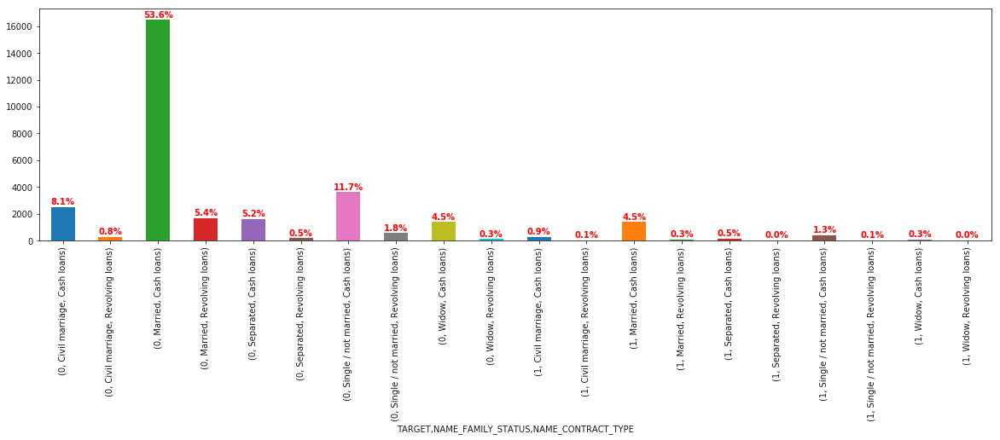

NAME_FAMILY_STATUS  VS  CODE_GENDER  VS TARGET


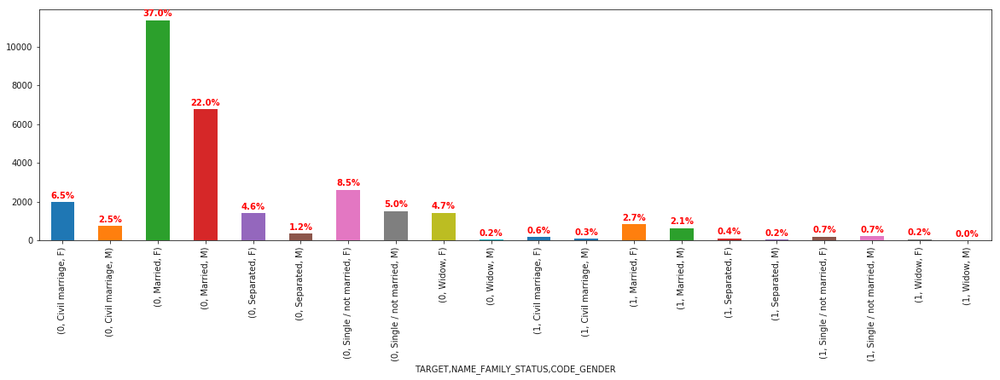

NAME_FAMILY_STATUS  VS  FLAG_OWN_CAR  VS TARGET


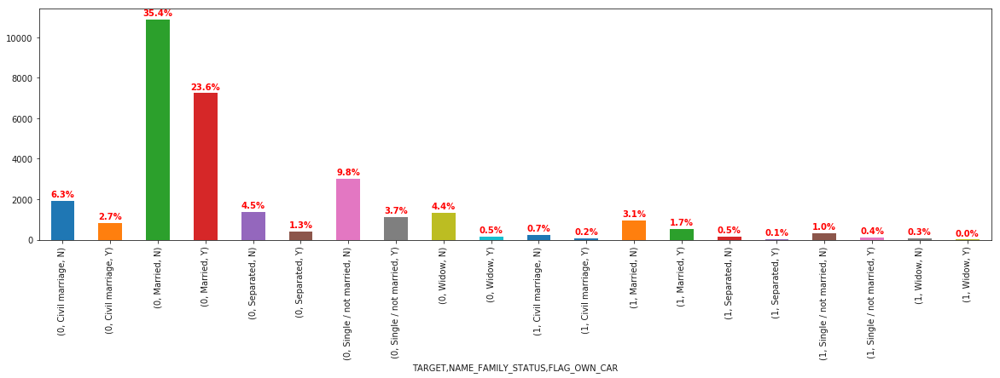

NAME_FAMILY_STATUS  VS  FLAG_OWN_REALTY  VS TARGET


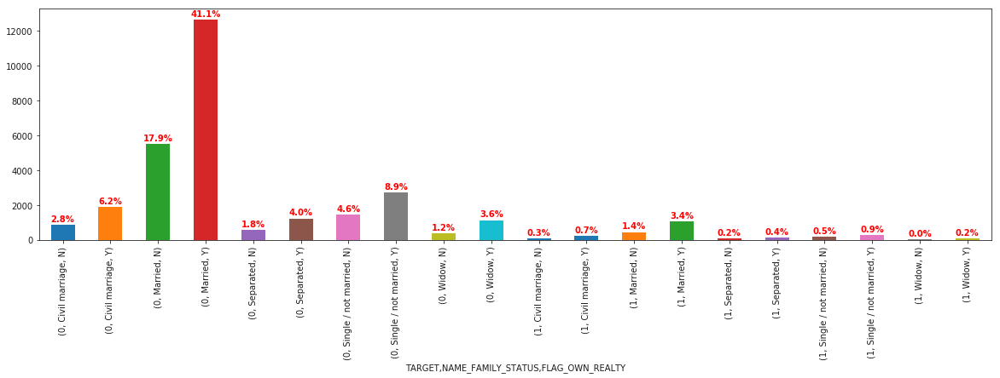

NAME_FAMILY_STATUS  VS  CNT_CHILDREN  VS TARGET


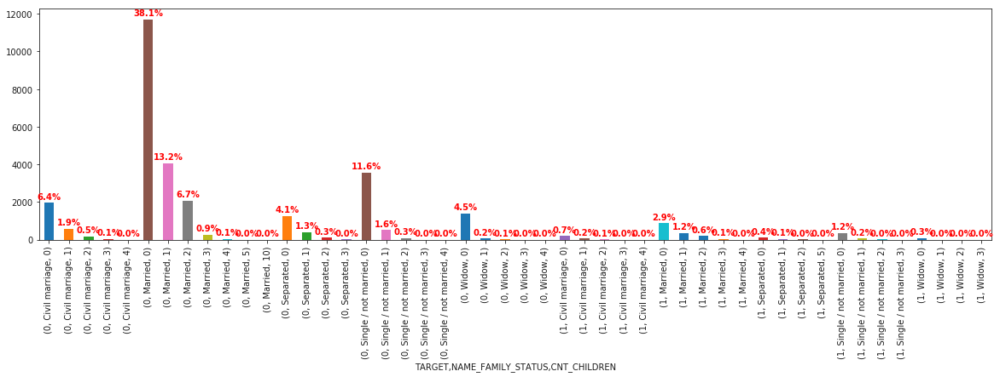

NAME_FAMILY_STATUS  VS  NAME_INCOME_TYPE  VS TARGET


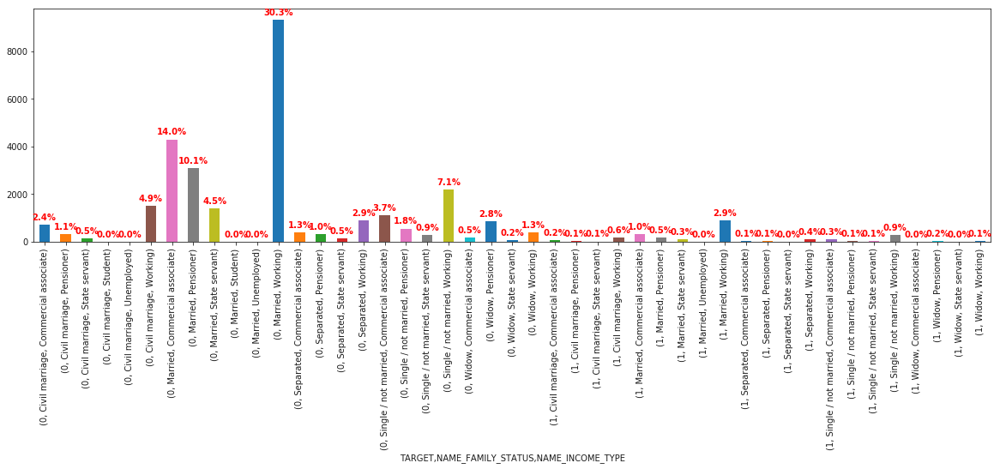

NAME_FAMILY_STATUS  VS  NAME_EDUCATION_TYPE  VS TARGET


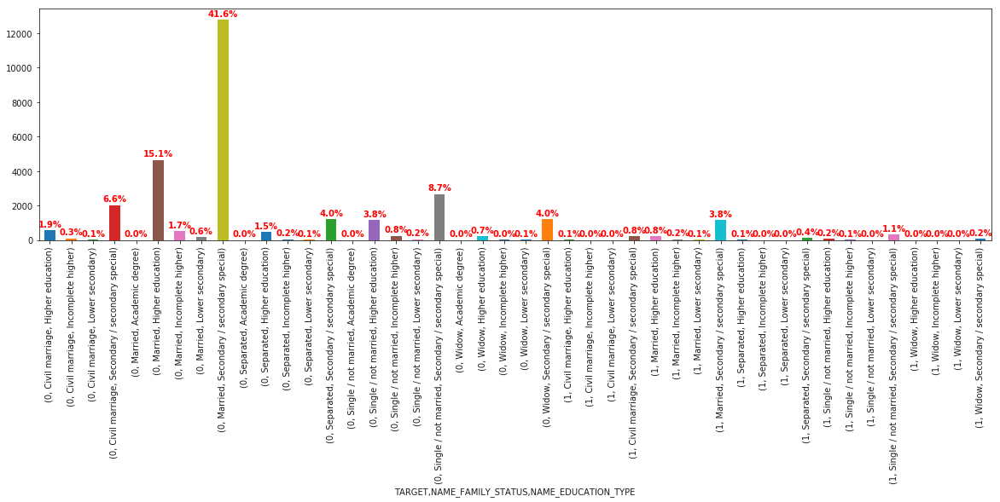

NAME_FAMILY_STATUS  VS  NAME_HOUSING_TYPE  VS TARGET


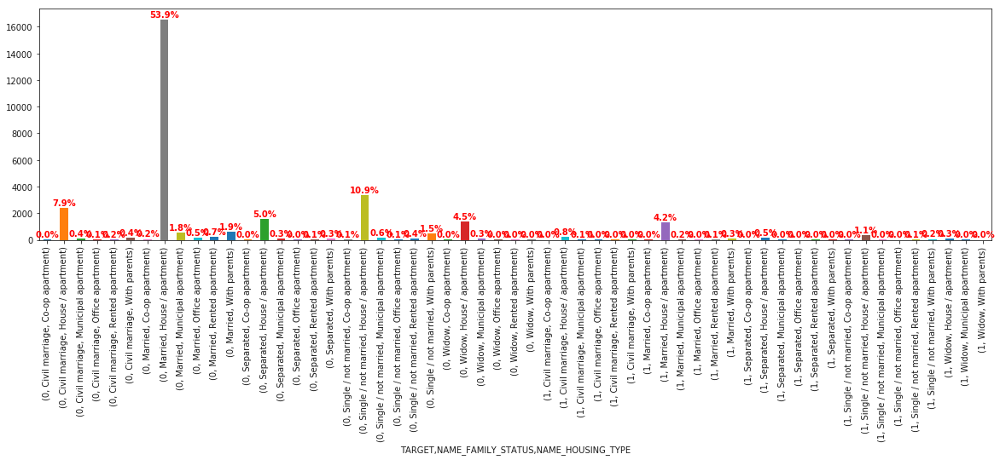

NAME_FAMILY_STATUS  VS  CNT_FAM_MEMBERS  VS TARGET


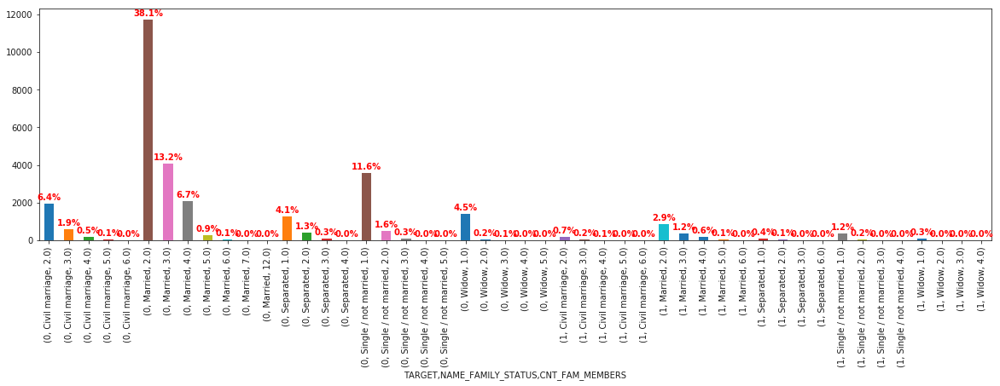

In [77]:
# Feature relationship with important categorical feats
for i in imp_cat_feats:
    if i != feature :
        print(feature," VS ",i, " VS TARGET")
        width=.5
        plt.figure(figsize=(20,5))
        g = x_df.groupby(by = ['TARGET',feature,i])
        vc = g.SK_ID_CURR.count()
        ax = vc.plot.bar(width=width)
        
        for v,c in enumerate(vc):
            ax.text(v, 
                    c+200, 
                    '{}%'.format(round((c/x_df.shape[0])*100,1)), 
                    color='red', 
                    fontweight='bold',
                    horizontalalignment='center')
        plt.show()

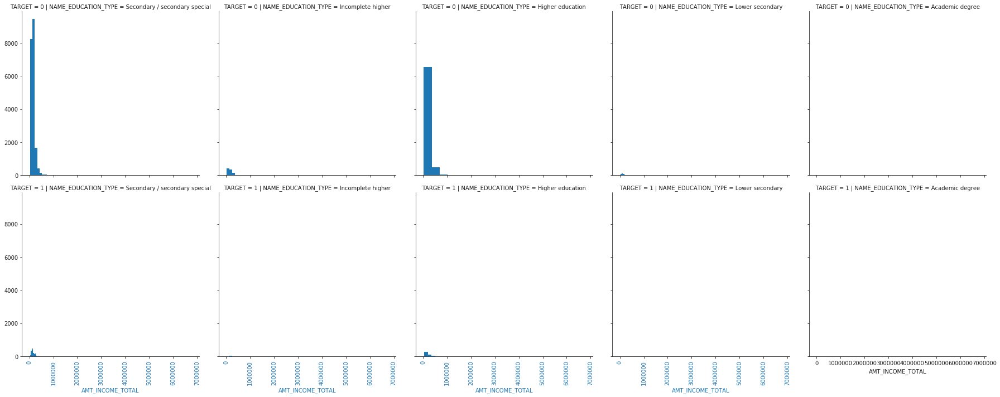

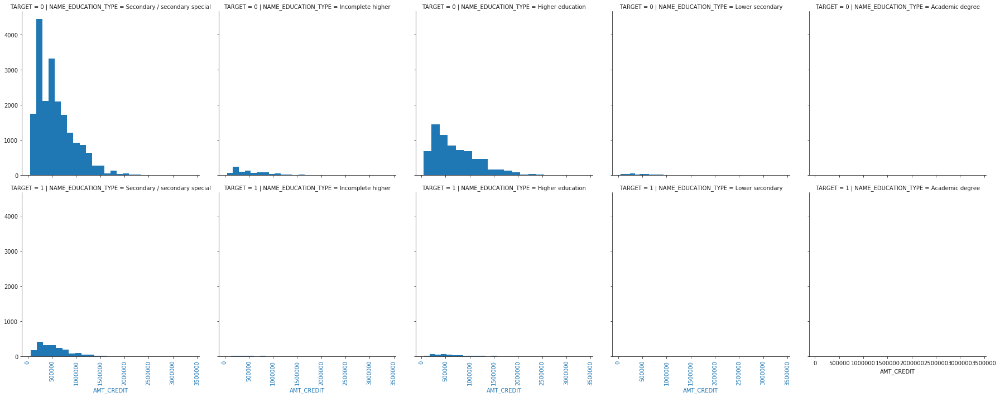

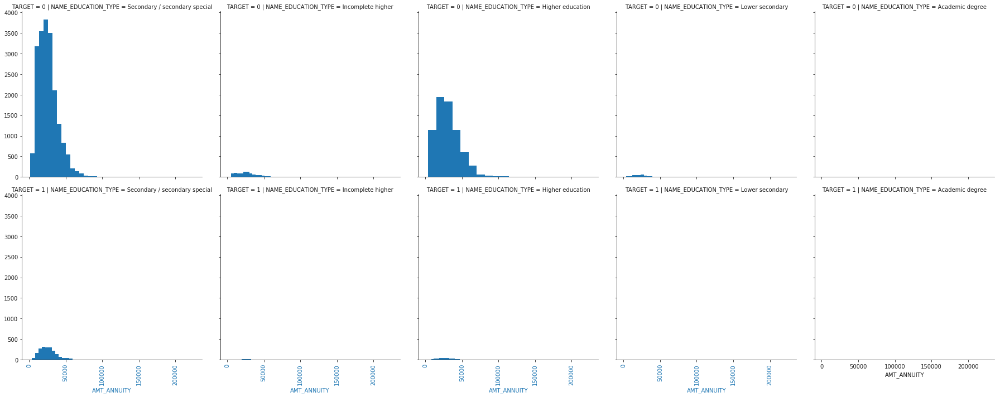

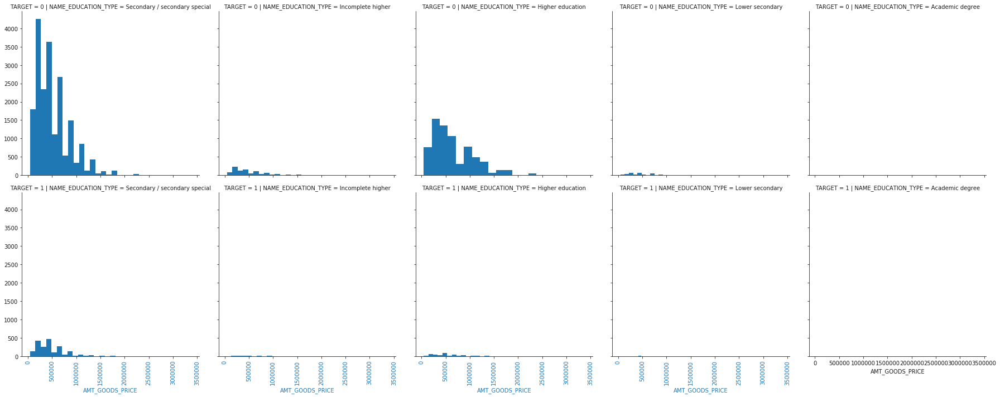

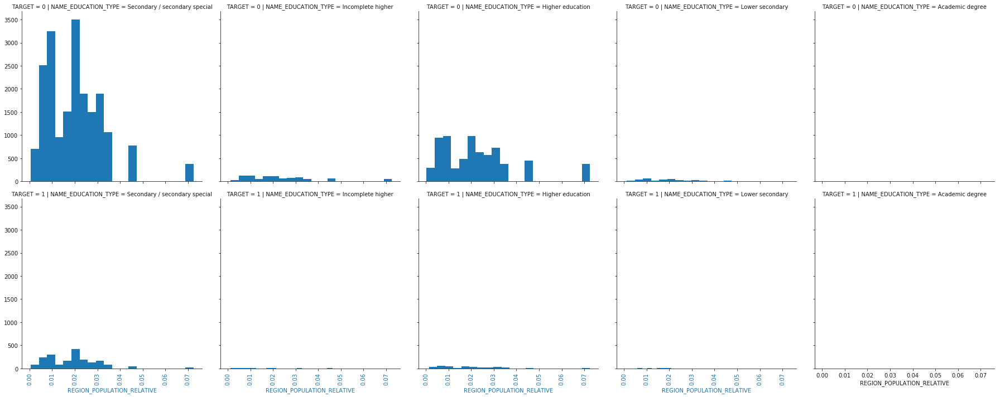

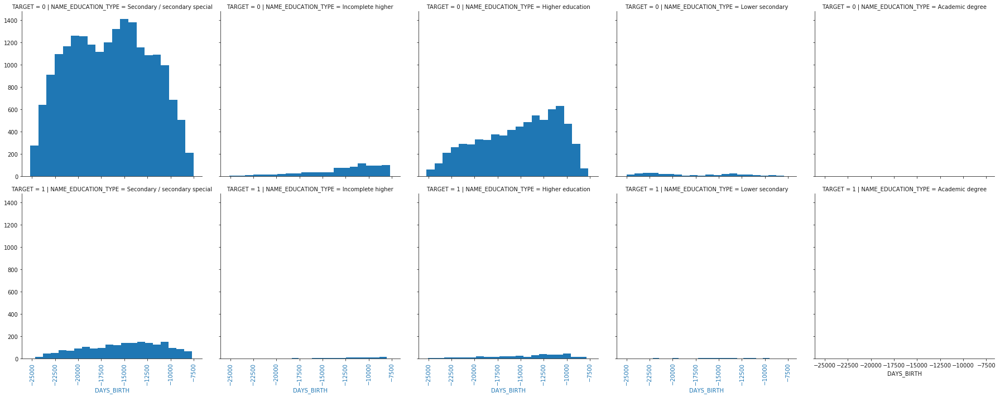

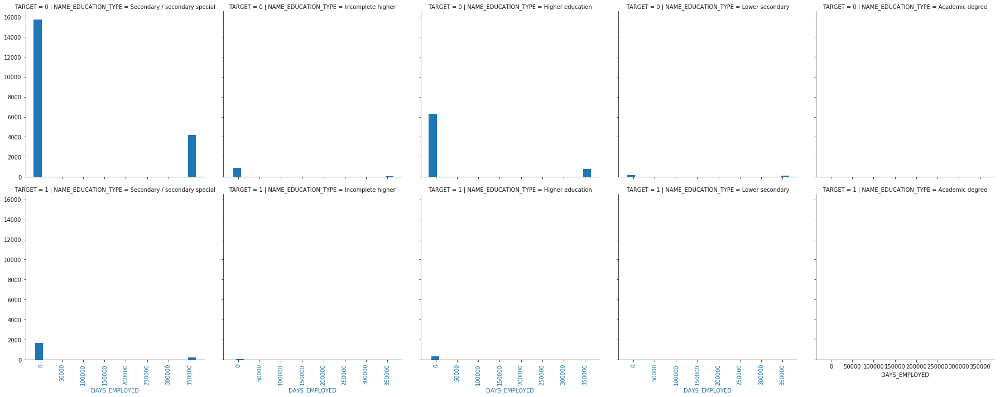

In [66]:
# Feature relationship with important numerical feats

from itertools import cycle, islice
for i in imp_num_feats:
    g = sns.FacetGrid(x_df, row="TARGET",  col=feature,size=5)
    g = g.map(plt.hist, i,bins=20)
    g.map(plt.xticks, rotation=90)
    g.map(plt.xlabel,i)

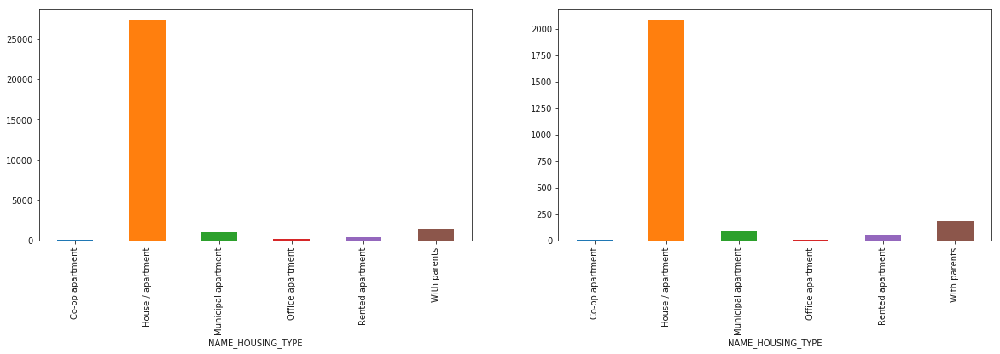

In [78]:
feature = 'NAME_HOUSING_TYPE'
plt.figure(figsize=(20,5))
plt.subplot2grid((1,2),(0,0),rowspan=1,colspan=1)
x_df.groupby(feature).SK_ID_CURR.count().plot.bar()
plt.subplot2grid((1,2),(0,1),rowspan=1,colspan=1)
x_df[x_df['TARGET']==1].groupby(feature).SK_ID_CURR.count().plot.bar()
plt.show()

In [79]:
corr_thres = .1

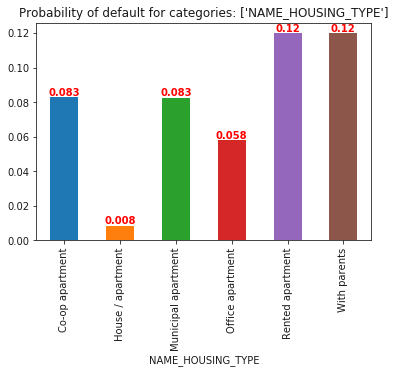

In [80]:
# Default ratio for the feature corrected by sample weight of category. 
lst = []
lst.append(feature)
f.default_ratio(x_df,['TARGET'],1,0,lst,.001)

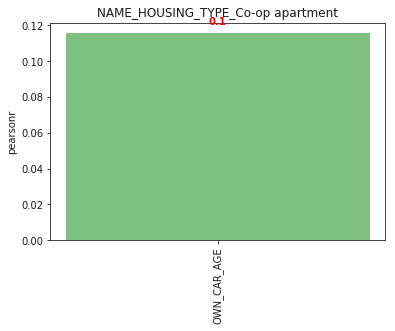

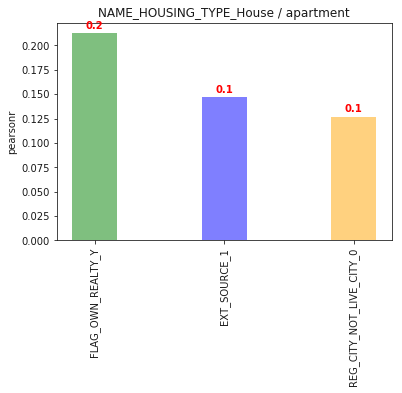

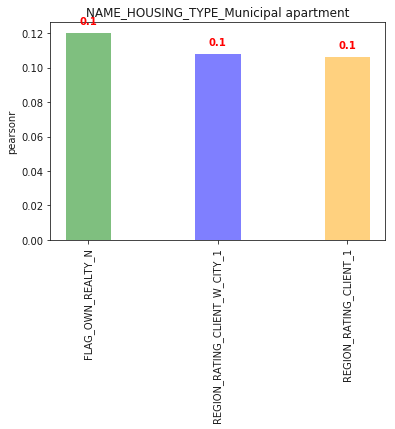

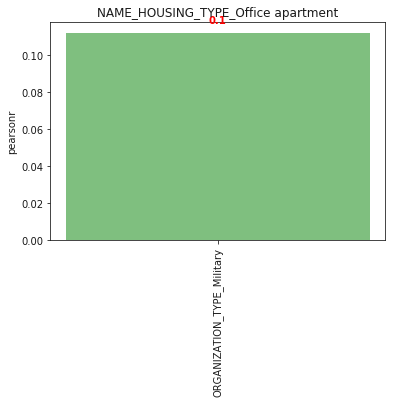

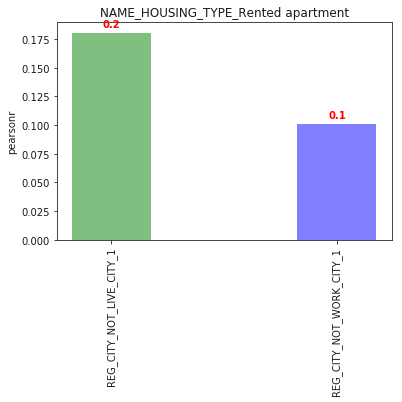

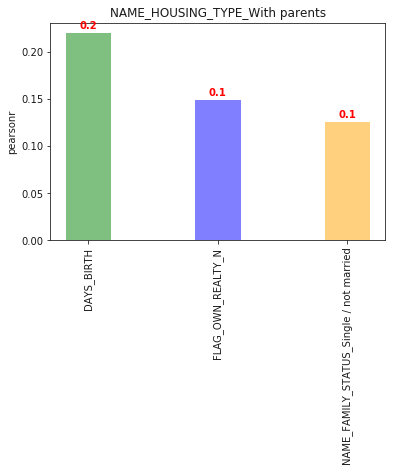

In [81]:
# Higher Correlations of all categories of feature with all other features

categories = x_corr.filter(like=feature,axis=0).index.tolist()

rng = np.arange(len(categories))
for i in categories:
    
    val= x_corr[i].sort_values(ascending=False)
    val = val[val.where((val>corr_thres) & (val!=1))>0]
    
    y_pos = np.arange(len(val.index))
    width = 0.35

    abc, ax1 = plt.subplots()
    rects1 = ax1.bar(y_pos-width/2, val, width, align='center', alpha=0.5,label=i,color = color_list)
    for v,c in enumerate(val):
        ax1.text(v-width/2, 
                c+.005, 
                round(c,1), 
                color='red', 
                fontweight='bold',
                horizontalalignment='center')
    
    ax1.set_ylabel('pearsonr')
    ax1.set_title(i)
    plt.xticks(rotation='vertical')
    ax1.set_xticks(y_pos-width/2)
    ax1.set_xticklabels(val.index)

NAME_HOUSING_TYPE  VS  NAME_CONTRACT_TYPE  VS TARGET


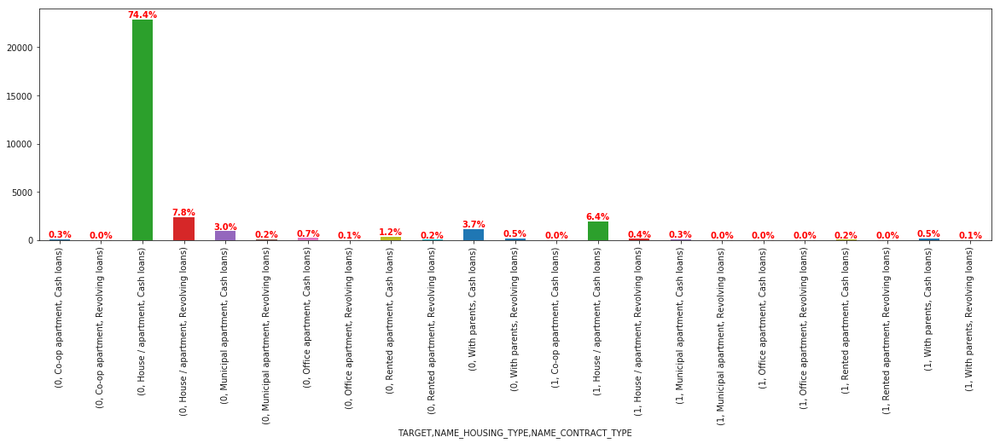

NAME_HOUSING_TYPE  VS  CODE_GENDER  VS TARGET


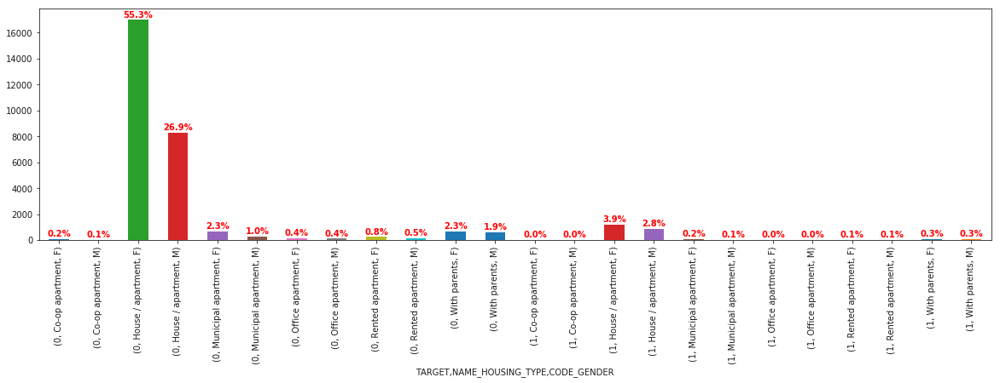

NAME_HOUSING_TYPE  VS  FLAG_OWN_CAR  VS TARGET


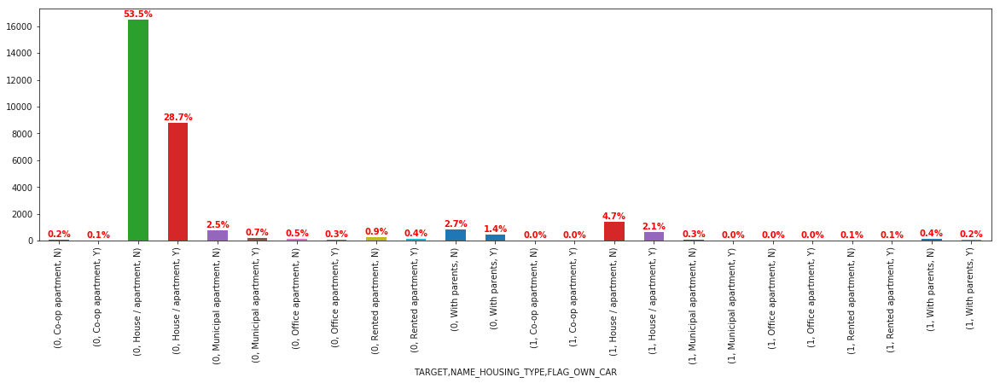

NAME_HOUSING_TYPE  VS  FLAG_OWN_REALTY  VS TARGET


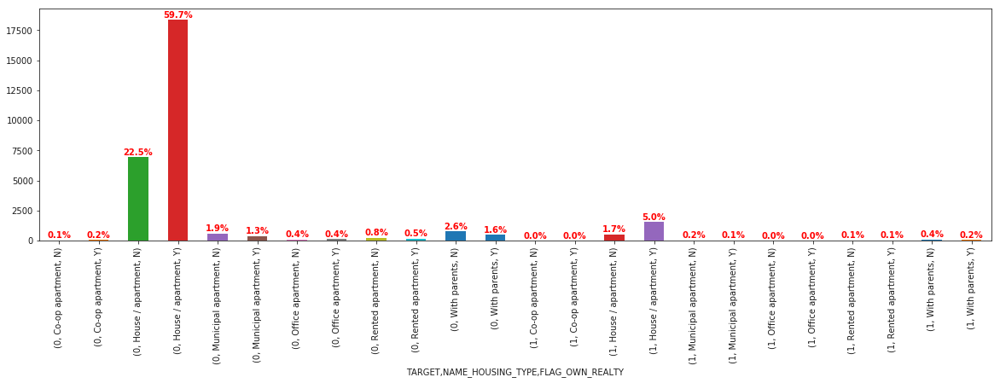

NAME_HOUSING_TYPE  VS  CNT_CHILDREN  VS TARGET


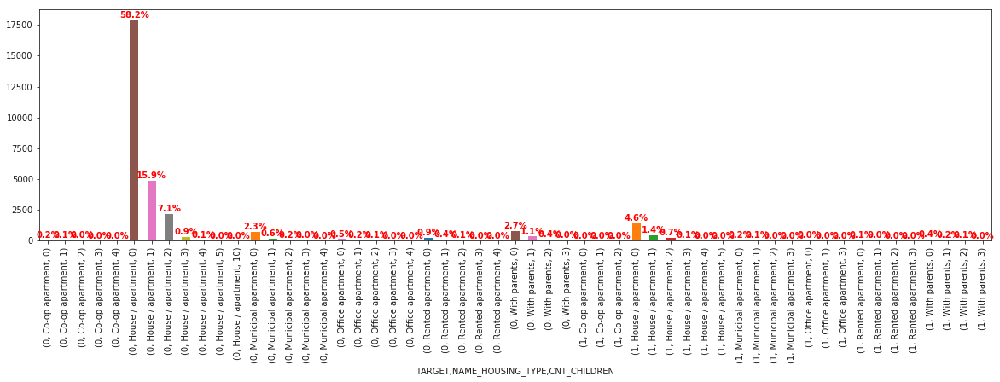

NAME_HOUSING_TYPE  VS  NAME_INCOME_TYPE  VS TARGET


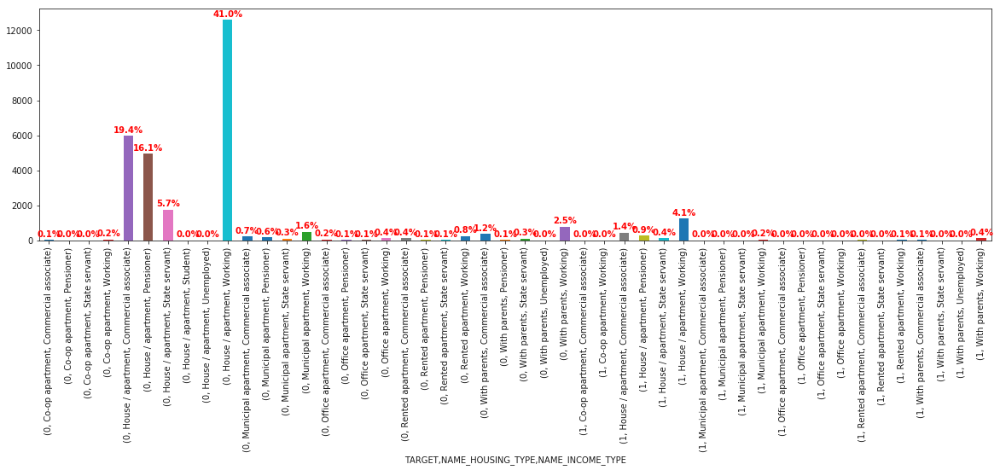

NAME_HOUSING_TYPE  VS  NAME_EDUCATION_TYPE  VS TARGET


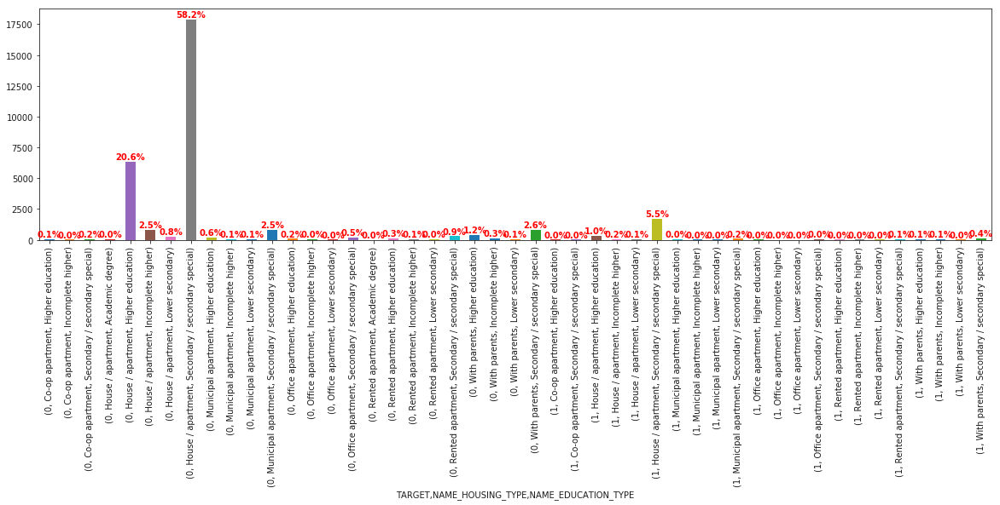

NAME_HOUSING_TYPE  VS  NAME_FAMILY_STATUS  VS TARGET


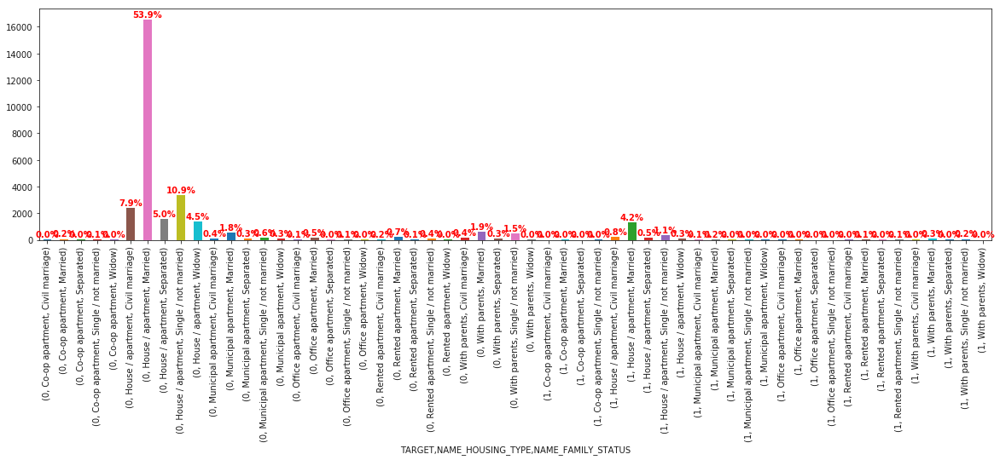

NAME_HOUSING_TYPE  VS  CNT_FAM_MEMBERS  VS TARGET


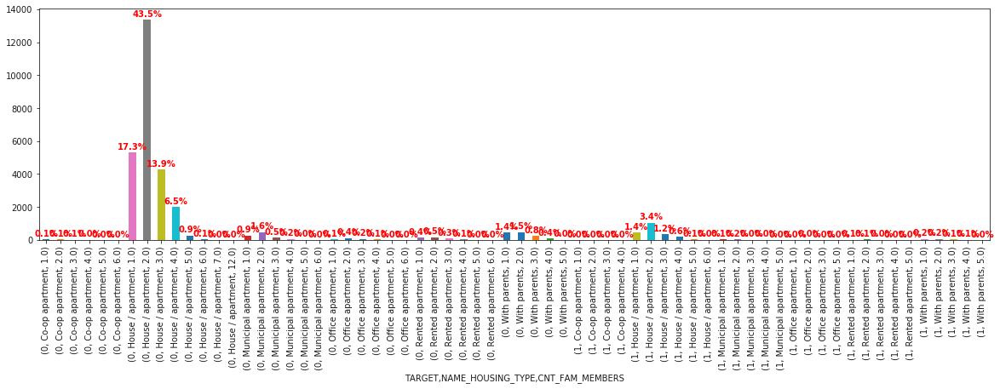

In [82]:
# Feature relationship with important categorical feats
for i in imp_cat_feats:
    if i != feature :
        print(feature," VS ",i, " VS TARGET")
        width=.5
        plt.figure(figsize=(20,5))
        g = x_df.groupby(by = ['TARGET',feature,i])
        vc = g.SK_ID_CURR.count()
        ax = vc.plot.bar(width=width)
        
        for v,c in enumerate(vc):
            ax.text(v, 
                    c+200, 
                    '{}%'.format(round((c/x_df.shape[0])*100,1)), 
                    color='red', 
                    fontweight='bold',
                    horizontalalignment='center')
        plt.show()

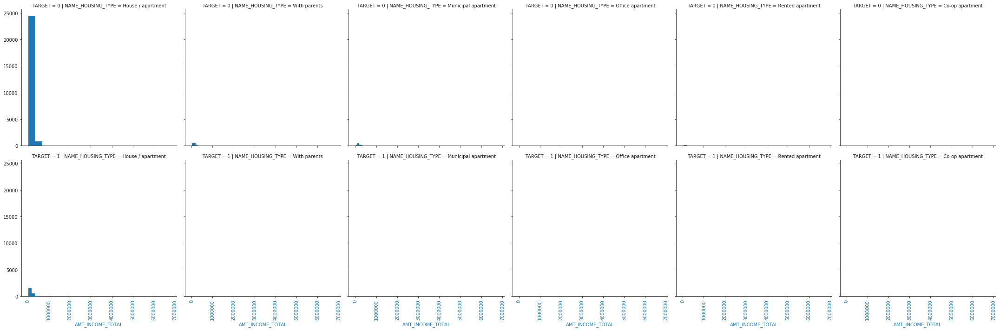

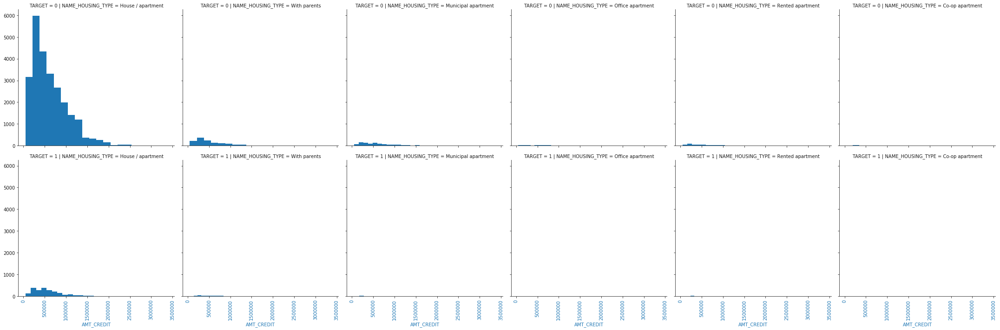

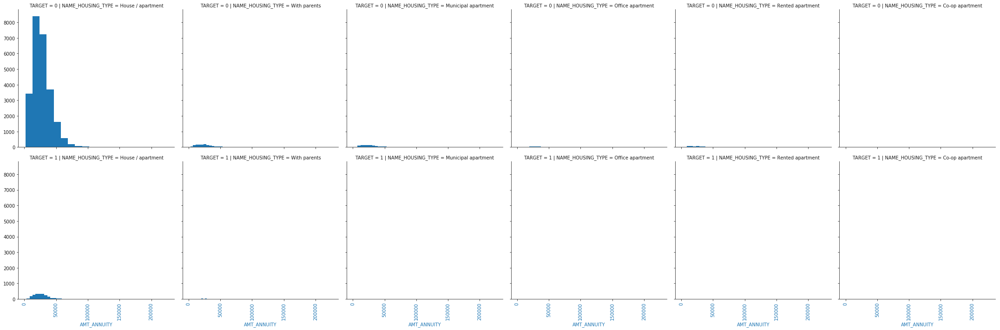

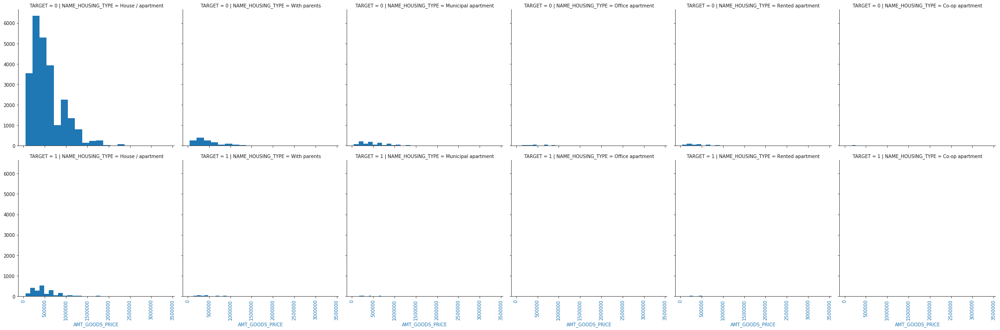

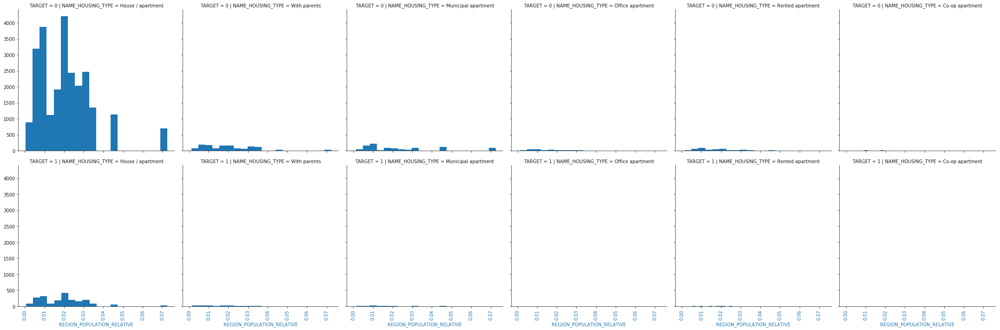

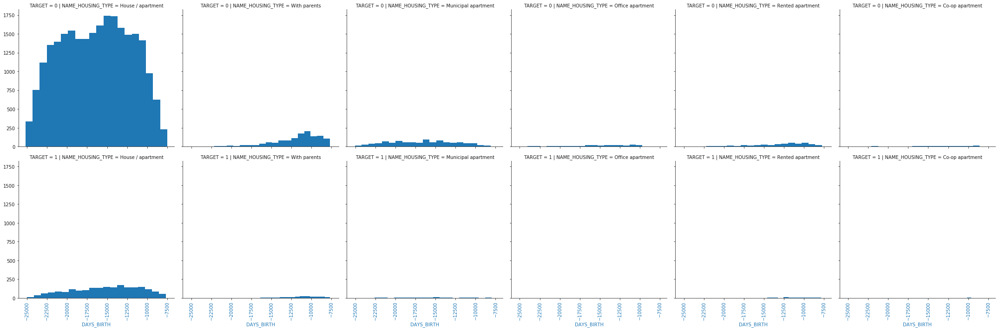

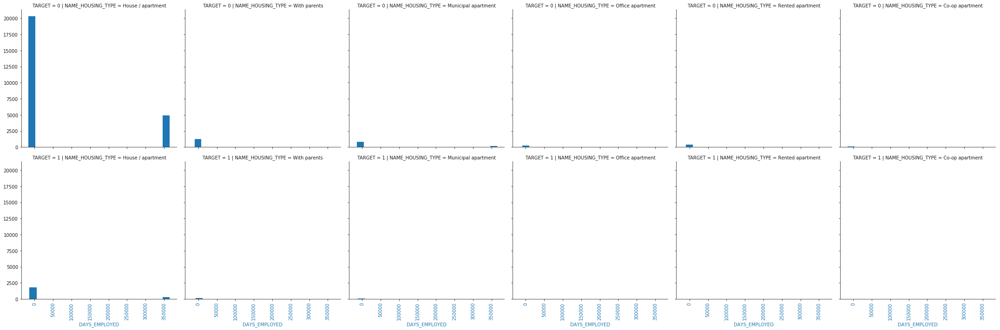

In [83]:
# Feature relationship with important numerical feats

from itertools import cycle, islice
for i in imp_num_feats:
    g = sns.FacetGrid(x_df, row="TARGET",  col=feature,size=5)
    g = g.map(plt.hist, i,bins=20)
    g.map(plt.xticks, rotation=90)
    g.map(plt.xlabel,i)

##### Observations:CODE_GENDER
1. The Male population in the dataset is significantly more than Female Population,Male:Female = 50% 
2. Male defaulting ratio is 10:7 higher than female defaulting ratio even when Female are twice to males in the dataset.
3. Default ratio is high with single/Not married as compared and lowest with Married candiates.Seems like increase in liability lowers the chances of default.
3. The attribute does not seem to be significantly correlated any of the other features.Hence there is not distinct behavior on the basis of GENDER found in the dataset. However, this is on the basis of against whose name the loan is taken and not the person paying for the loan.

##### FLAG_OWN_CAR

##### Observations:FLAG_OWN_CAR
1. The Car holding people are half as much of the non Car holding people in the dataset 
2. No significant observation on this distinction over target variable.
3. The people holding reality but no car have a sinificantly high defaulting ratio.However we cannot see it as a significant breakthrough as the people holding reality but no car are twice as much to People not holding reality and no car or people holding reality and car both

##### Observations:FLAG_OWN_CAR
1. The Realty holding people are half as much of the non Realty holding people in the dataset 
2. No significant observation on this distinction over target variable.
3. The people holding reality but no car have a sinificantly high defaulting ratio.However we cannot see it as a significant breakthrough as the people holding reality but no car are twice as much to People not holding reality but no car or people holding reality and car both

##### Observations:CNT_CHILDREN
1. The cases with no children are more than twice as compared to the observations with children
2. The default ratio is marginally increasing with increasing number of Children but the number of observations are becoming lesser.
3. No significant correlation is observed other than CNT_FAMILY_MEMBERS
4. Default ratio is significantly high in case of more CNT_CHILDREN and OWN REALTY and CAR.This establishes that the higher spending liabilities and Cost of Living increases the chances of default on loan.

##### Observations: AMT_INCOME_TOTAL
1. At least 50% values lie between 1L - 2L Income range
2. No significant difference is observed between the default candidates wrt the attribute
3. The distribution is right skewed with outliers for higher income range > 3L
4. The attribute is somewhat correlated with AMT_ANNUITY,AMT_GOODS_PRICE,AMT_CREDIT
5. The LOAN2INCOMERATIO is correlated with AMT_CREDIT and AMT_GOODS_PRICE. Moreover, the loan to income ratio is relatively higher for defaulters but it could be due to unbalanced dataset.
6. The high income group does not necessarily requested high credit amount.
7. Defaulters are mostly observed with low income group <1000000.
8. Most of the defaulters lie between 20-30 loan to Income Ratio group

##### AMT_CREDIT

In [67]:
# Values
x_df.AMT_CREDIT.isna().sum()

0

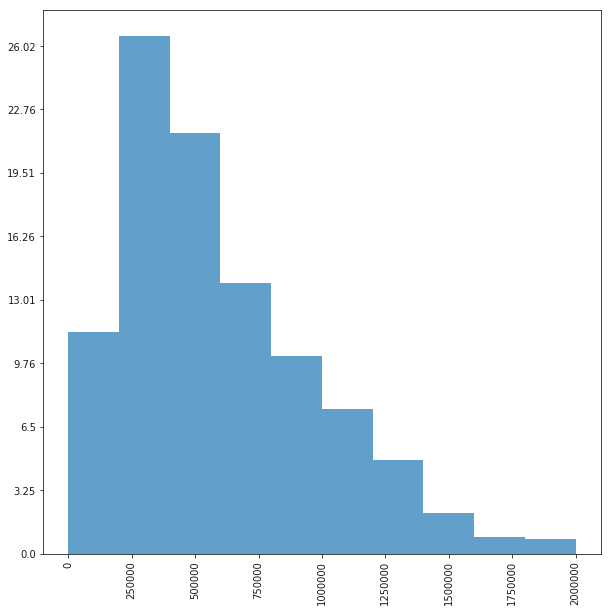

In [68]:
plt.figure(figsize=(10,10))
f.hist_perc(x_df,'AMT_CREDIT', 10, 0,2000000)


In [69]:
print('Data below 1000000:',x_df.iloc[x_df[x_df['AMT_CREDIT']<1000000].index].count()[1]/x_df.shape[0]*100)
print('Data below 1500000:',x_df.iloc[x_df[x_df['AMT_CREDIT']<1500000].index].count()[1]/x_df.shape[0]*100)


Data below 1000000: 83.3761503690937
Data below 1500000: 96.3675978016975


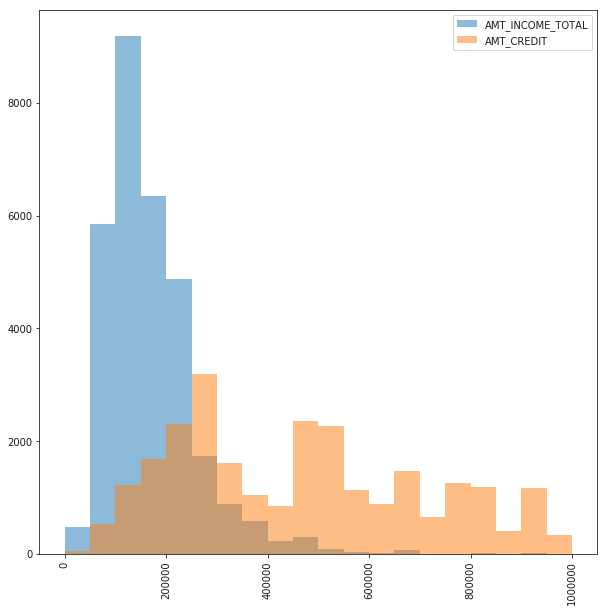

In [70]:
f.hist_compare(x_df,['AMT_INCOME_TOTAL','AMT_CREDIT'],20,0,1000000,False)

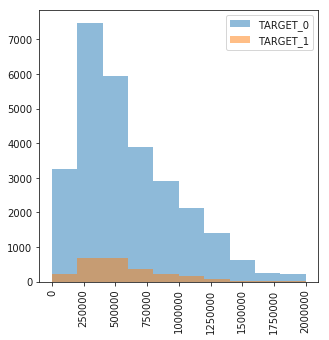

In [71]:
plt.figure(figsize=(5,5))
plt.hist(x = x_df[x_df['TARGET']==0]['AMT_CREDIT'],bins=10,range=(0,2000000),alpha=0.5,label='TARGET_0')     
plt.hist(x = x_df[x_df['TARGET']==1]['AMT_CREDIT'],bins=10,range=(0,2000000),alpha=0.5,label='TARGET_1')    
plt.xticks(rotation=90)
plt.legend(loc='upper right')
plt.show()  


In [72]:
# Default ratio
print(
n_x_df[(n_x_df['LOAN2INCOMERATIO']>0)&(n_x_df['LOAN2INCOMERATIO']<10)&(n_x_df.TARGET==1)].count()[1]/n_x_df[(n_x_df['LOAN2INCOMERATIO']>30)].count()[1],
n_x_df[(n_x_df['LOAN2INCOMERATIO']>10)&(n_x_df['LOAN2INCOMERATIO']<20)&(n_x_df.TARGET==1)].count()[1]/n_x_df[(n_x_df['LOAN2INCOMERATIO']>30)].count()[1],
n_x_df[(n_x_df['LOAN2INCOMERATIO']>20)&(n_x_df['LOAN2INCOMERATIO']<30)&(n_x_df.TARGET==1)].count()[1]/n_x_df[(n_x_df['LOAN2INCOMERATIO']>30)].count()[1],
n_x_df[(n_x_df['LOAN2INCOMERATIO']>30)&(n_x_df['LOAN2INCOMERATIO']<40)&(n_x_df.TARGET==1)].count()[1]/n_x_df[(n_x_df['LOAN2INCOMERATIO']>30)].count()[1],
n_x_df[(n_x_df['LOAN2INCOMERATIO']>40)&(n_x_df['LOAN2INCOMERATIO']<50)&(n_x_df.TARGET==1)].count()[1]/n_x_df[(n_x_df['LOAN2INCOMERATIO']>30)].count()[1],
n_x_df[(n_x_df['LOAN2INCOMERATIO']>50)&(n_x_df['LOAN2INCOMERATIO']<60)&(n_x_df.TARGET==1)].count()[1]/n_x_df[(n_x_df['LOAN2INCOMERATIO']>30)].count()[1],
n_x_df[(n_x_df['LOAN2INCOMERATIO']>60)&(n_x_df['LOAN2INCOMERATIO']<70)&(n_x_df.TARGET==1)].count()[1]/n_x_df[(n_x_df['LOAN2INCOMERATIO']>30)].count()[1]
)

NameError: name 'n_x_df' is not defined

In [ ]:
val = f.get_corr(x_df,'AMT_CREDIT')
f.plot_bar(val.index,(50,10),val)

In [ ]:
val = f.get_corr(n_x_df,'LOAN2INCOMERATIO')
f.plot_bar(val.index,(50,10),val)

In [ ]:
plt.figure(figsize=(30,10))
x_df.AMT_CREDIT.plot(kind='kde')

In [ ]:
OutLiersBox(x_df,'AMT_CREDIT')

##### Observations: AMT_INCOME_TOTAL
1. At least 50% values lie between 1L - 2L Income range
2. No significant difference is observed between the default candidates wrt the attribute
3. The distribution is right skewed with outliers for higher income range > 3L
4. The attribute is somewhat correlated with AMT_ANNUITY,AMT_GOODS_PRICE,AMT_CREDIT
5. The LOAN2INCOMERATIO is correlated with AMT_CREDIT and AMT_GOODS_PRICE. Moreover, the loan to income ratio is relatively higher for defaulters but it could be due to unbalanced dataset.
6. The high income group does not necessarily requested high credit amount.
7. Defaulters are mostly observed with low income group <1000000.
8. Most of the defaulters lie between 20-30 loan to Income Ratio group